In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from itertools import product
from joblib import Parallel, delayed
import warnings
warnings.filterwarnings('ignore')
import gc

# **AAPL:**

# Period 1:


Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31
Best ARIMA order: (0, 1, 0), RMSE: 2.9164
Best Seasonal order: (0, 1, 1, 22), RMSE: 2.5028
Fold 1 Metrics:
  RMSE: 2.5028
  MAE:  2.2557
  MAPE: 0.0843
  R2:   -1.2078


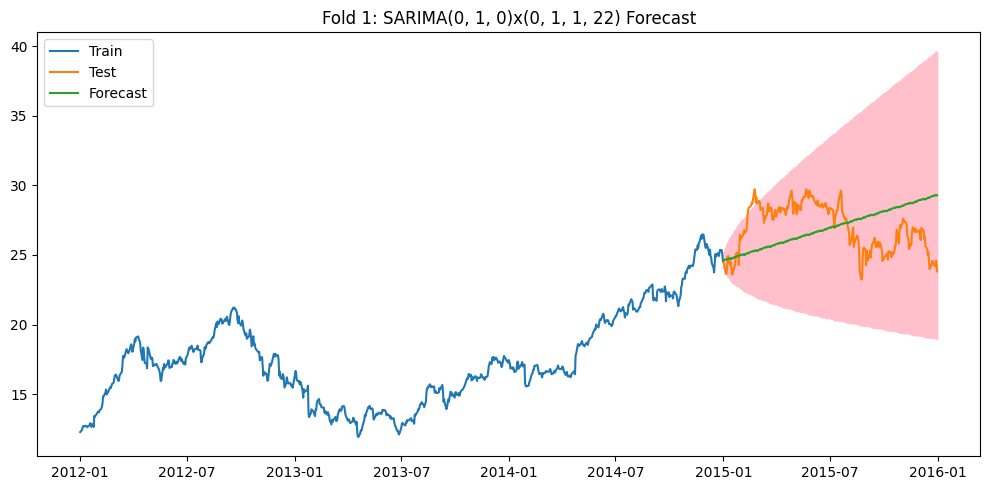


Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31
Best ARIMA order: (2, 1, 2), RMSE: 1.8456
Best Seasonal order: (1, 1, 1, 5), RMSE: 1.7227
Fold 2 Metrics:
  RMSE: 1.7227
  MAE:  1.3773
  MAPE: 0.0605
  R2:   0.1311


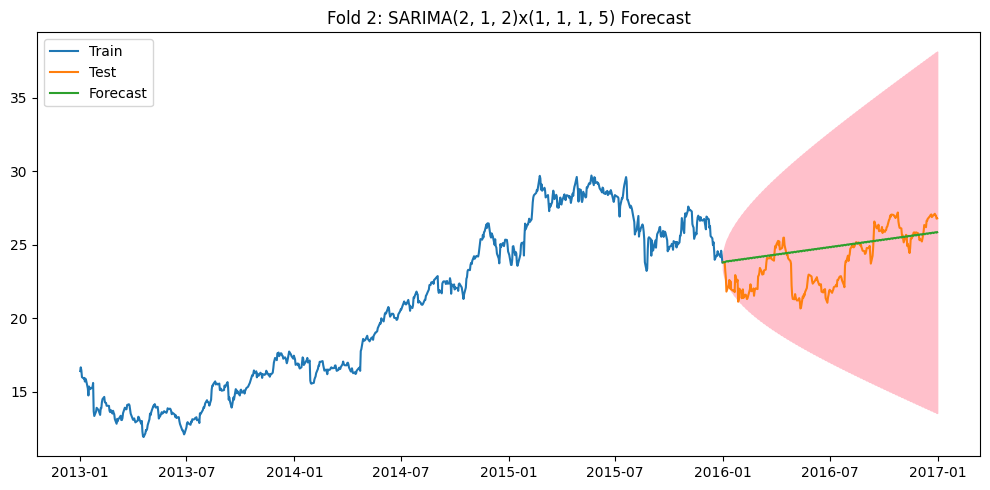


Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31
Best ARIMA order: (2, 1, 3), RMSE: 9.0542
Best Seasonal order: (1, 1, 1, 22), RMSE: 6.9764
Fold 3 Metrics:
  RMSE: 6.9764
  MAE:  6.4469
  MAPE: 0.1774
  R2:   -2.7072


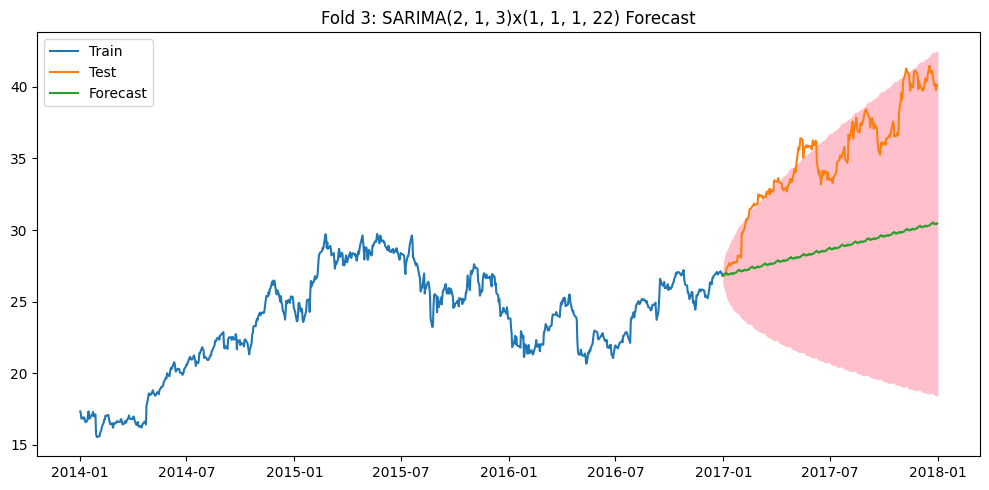

In [ ]:
# Load and preprocess data
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2012-01-01', '2014-12-31', '2015-01-01', '2015-12-31'),
    ('2013-01-01', '2015-12-31', '2016-01-01', '2016-12-31'),
    ('2014-01-01', '2016-12-31', '2017-01-01', '2017-12-31')
]

# Hyperparameter ranges
p = range(0, 3)
q = range(0, 5)
P = range(0, 2)
D = d = Q = [1]
m_values = [5, 22]
arima_params = list(product(p, d, q))
seasonal_params = list(product(P, D, Q, m_values))

# Helper functions
def evaluate_arima(train, test, order):
    try:
        model = SARIMAX(train, order=order, enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (order, rmse)
    except:
        return (order, np.inf)

def evaluate_seasonal(train, test, arima_order, seasonal_order):
    try:
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (seasonal_order, rmse)
    except:
        return (seasonal_order, np.inf)

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train = df.loc[train_start:train_end]['Close']
    test = df.loc[test_start:test_end]['Close']

    # ARIMA Grid Search
    # Ensure train and test are passed correctly to parallel functions
    arima_results = Parallel(n_jobs=-1)(delayed(evaluate_arima)(train, test, order) for order in arima_params)
    best_arima_order, best_arima_rmse = min(arima_results, key=lambda x: x[1])
    print(f"Best ARIMA order: {best_arima_order}, RMSE: {best_arima_rmse:.4f}")

    # Seasonal Grid Search
    # Ensure train and test are passed correctly to parallel functions
    seasonal_results = Parallel(n_jobs=-1)(
        delayed(evaluate_seasonal)(train, test, best_arima_order, seasonal_order)
        for seasonal_order in seasonal_params
    )
    best_seasonal_order, best_seasonal_rmse = min(seasonal_results, key=lambda x: x[1])
    print(f"Best Seasonal order: {best_seasonal_order}, RMSE: {best_seasonal_rmse:.4f}")

    # Fit final model
    model = SARIMAX(train, order=best_arima_order, seasonal_order=best_seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    forecast_result = results.get_forecast(steps=len(test))
    forecast_mean = forecast_result.predicted_mean
    forecast_ci = forecast_result.conf_int()


    # Metrics
    # Use forecast_mean for metrics
    rmse = np.sqrt(mean_squared_error(test, forecast_mean))
    mae = mean_absolute_error(test, forecast_mean)
    mape = mean_absolute_percentage_error(test, forecast_mean)
    r2 = r2_score(test, forecast_mean)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  MAPE: {mape:.4f}")
    print(f"  R2:   {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    # Use forecast_mean for plotting the forecast line
    plt.plot(test.index, forecast_mean, label='Forecast')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
    plt.title(f'Fold {i}: SARIMA{best_arima_order}x{best_seasonal_order} Forecast')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Explicitly delete large objects and collect garbage
    del model, results, forecast_result, forecast_mean, forecast_ci
    gc.collect()


chosen hyperparams: (2,1,3), (1,1,1,22)

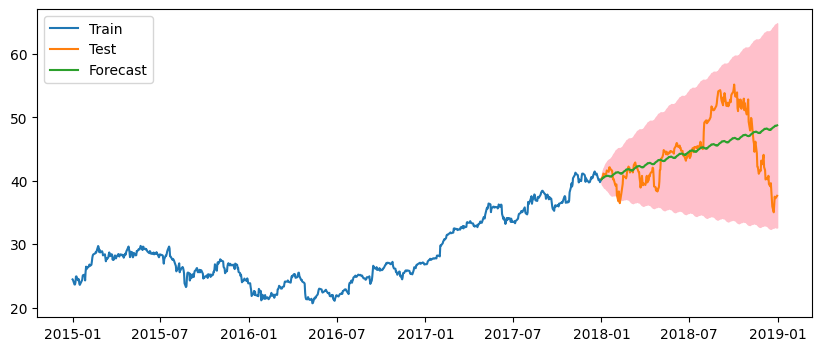

RMSE: 4.42, MAE: 3.26 MAPE: 0.07 R2: 0.21


In [ ]:
# Read CSV skipping the first two metadata rows
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2015-01-01':'2017-12-31']['Close']
test = df.loc['2018-01-01':'2018-12-31']['Close']

model = SARIMAX(train, order=(2,1,3), seasonal_order=(1,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
forecast = forecast_result.predicted_mean
forecast_ci = forecast_result.conf_int()
plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.legend()
plt.show()

# Metrics
rmse = np.sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)
mape = mean_absolute_percentage_error(test, forecast)
r2 = r2_score(test, forecast)
print(f'RMSE: {rmse:.2f}, MAE: {mae:.2f}', f'MAPE: {mape:.2f}', f'R2: {r2:.2f}')

# Period 2:


Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31
Best ARIMA order: (1, 1, 2), RMSE: 6.7315
Best Seasonal order: (1, 1, 1, 5), RMSE: 4.4191
Fold 1 Metrics:
  RMSE: 4.4191
  MAE:  3.2398
  MAPE: 0.0725
  R2:   0.2132


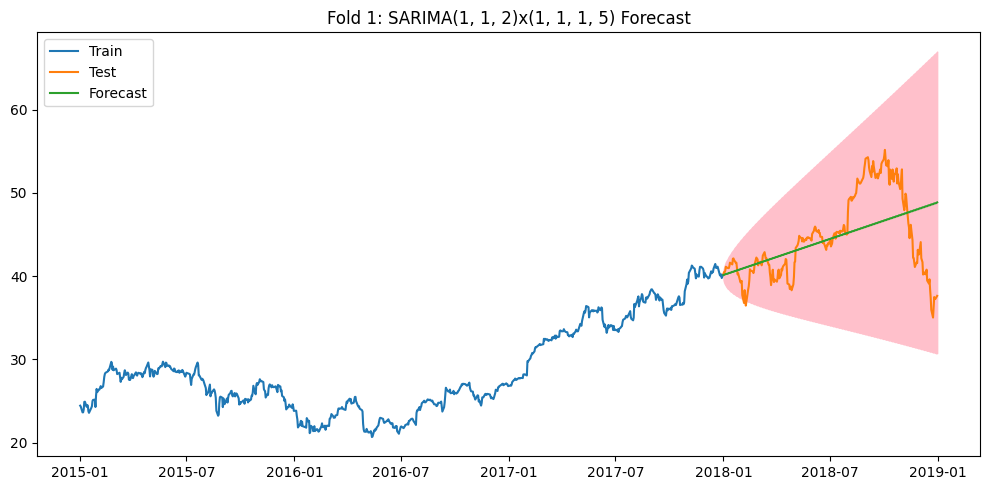


Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31
Best ARIMA order: (2, 1, 4), RMSE: 15.0919
Best Seasonal order: (0, 1, 1, 22), RMSE: 12.2105
Fold 2 Metrics:
  RMSE: 12.2105
  MAE:  10.0560
  MAPE: 0.1841
  R2:   -1.0045


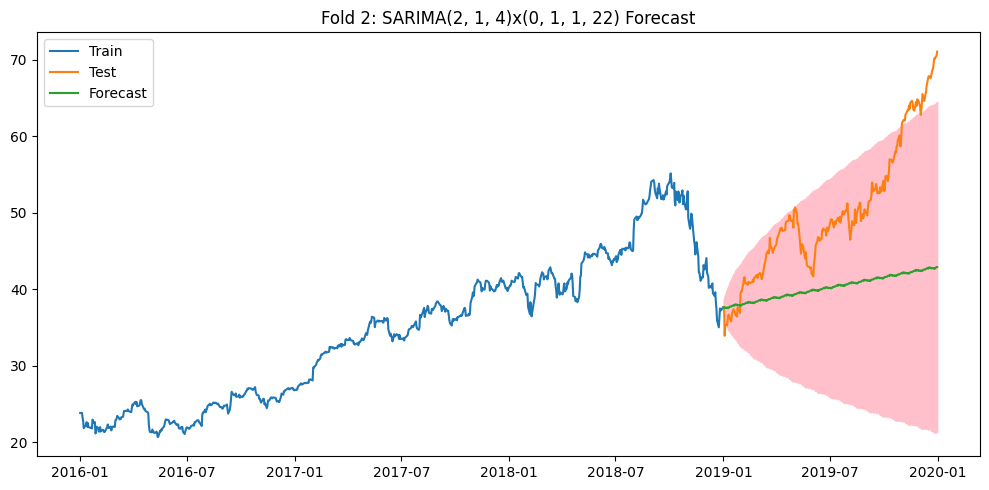


Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31
Best ARIMA order: (2, 1, 3), RMSE: 27.7230
Best Seasonal order: (0, 1, 1, 22), RMSE: 22.1284
Fold 3 Metrics:
  RMSE: 22.1278
  MAE:  17.5283
  MAPE: 0.1714
  R2:   -0.0732


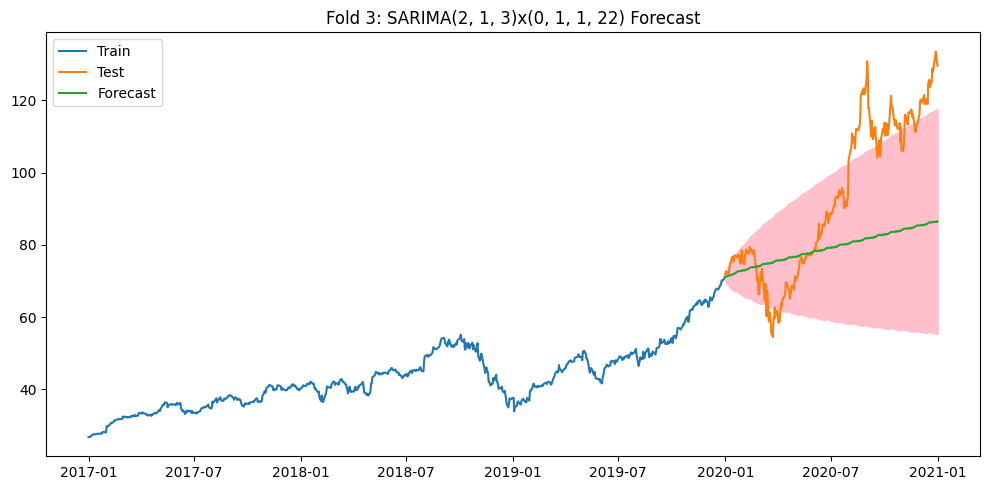

In [ ]:
# Load and preprocess data
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2015-01-01', '2017-12-31', '2018-01-01', '2018-12-31'),
    ('2016-01-01', '2018-12-31', '2019-01-01', '2019-12-31'),
    ('2017-01-01', '2019-12-31', '2020-01-01', '2020-12-31')
]

# Hyperparameter ranges
p = range(0, 3)
q = range(0, 5)
P = range(0, 2)
D = d = Q = [1]
m_values = [5, 22]
arima_params = list(product(p, d, q))
seasonal_params = list(product(P, D, Q, m_values))

# Helper functions
def evaluate_arima(train, test, order):
    try:
        model = SARIMAX(train, order=order, enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (order, rmse)
    except:
        return (order, np.inf)

def evaluate_seasonal(train, test, arima_order, seasonal_order):
    try:
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (seasonal_order, rmse)
    except:
        return (seasonal_order, np.inf)

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train = df.loc[train_start:train_end]['Close']
    test = df.loc[test_start:test_end]['Close']

    # ARIMA Grid Search
    # Ensure train and test are passed correctly to parallel functions
    arima_results = Parallel(n_jobs=-1)(delayed(evaluate_arima)(train, test, order) for order in arima_params)
    best_arima_order, best_arima_rmse = min(arima_results, key=lambda x: x[1])
    print(f"Best ARIMA order: {best_arima_order}, RMSE: {best_arima_rmse:.4f}")

    # Seasonal Grid Search
    # Ensure train and test are passed correctly to parallel functions
    seasonal_results = Parallel(n_jobs=-1)(
        delayed(evaluate_seasonal)(train, test, best_arima_order, seasonal_order)
        for seasonal_order in seasonal_params
    )
    best_seasonal_order, best_seasonal_rmse = min(seasonal_results, key=lambda x: x[1])
    print(f"Best Seasonal order: {best_seasonal_order}, RMSE: {best_seasonal_rmse:.4f}")

    # Fit final model
    model = SARIMAX(train, order=best_arima_order, seasonal_order=best_seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    forecast_result = results.get_forecast(steps=len(test))
    forecast_mean = forecast_result.predicted_mean
    forecast_ci = forecast_result.conf_int()


    # Metrics
    # Use forecast_mean for metrics
    rmse = np.sqrt(mean_squared_error(test, forecast_mean))
    mae = mean_absolute_error(test, forecast_mean)
    mape = mean_absolute_percentage_error(test, forecast_mean)
    r2 = r2_score(test, forecast_mean)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  MAPE: {mape:.4f}")
    print(f"  R2:   {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    # Use forecast_mean for plotting the forecast line
    plt.plot(test.index, forecast_mean, label='Forecast')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
    plt.title(f'Fold {i}: SARIMA{best_arima_order}x{best_seasonal_order} Forecast')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Explicitly delete large objects and collect garbage
    del model, results, forecast_result, forecast_mean, forecast_ci
    gc.collect()


Chosen parameters: (2,1,3), (0,1,1,22)

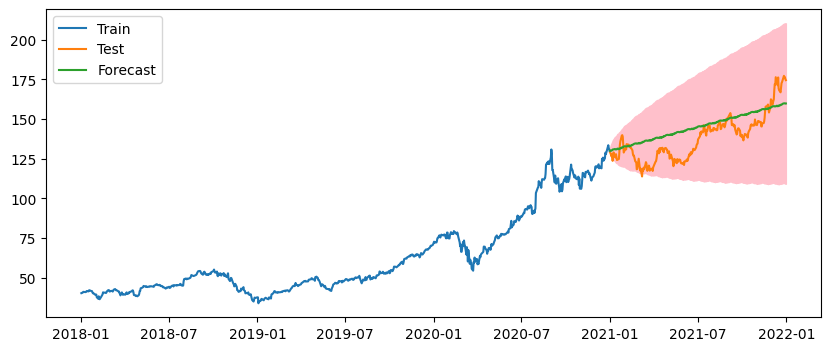

RMSE: 11.04, MAE: 9.27 MAPE: 0.07 R2: 0.42


In [ ]:
# Read CSV skipping the first two metadata rows
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2018-01-01':'2020-12-31']['Close']
test = df.loc['2021-01-01':'2021-12-31']['Close']

model = SARIMAX(train, order=(2,1,3), seasonal_order=(0,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
forecast = forecast_result.predicted_mean
forecast_ci = forecast_result.conf_int()
plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.legend()
plt.show()

# Metrics
rmse = np.sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)
mape = mean_absolute_percentage_error(test, forecast)
r2 = r2_score(test, forecast)
print(f'RMSE: {rmse:.2f}, MAE: {mae:.2f}', f'MAPE: {mape:.2f}', f'R2: {r2:.2f}')

# Period 3:


Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31
Best ARIMA order: (2, 1, 4), RMSE: 16.7601
Best Seasonal order: (0, 1, 1, 22), RMSE: 11.0203
Fold 1 Metrics:
  RMSE: 11.0251
  MAE:  9.2554
  MAPE: 0.0697
  R2:   0.4205


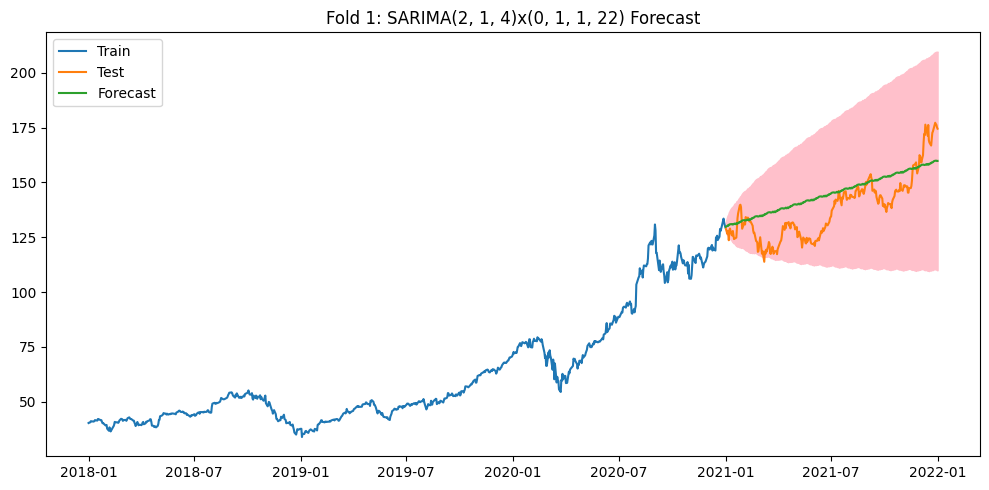


Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31
Best ARIMA order: (2, 1, 0), RMSE: 25.3358
Best Seasonal order: (0, 1, 1, 22), RMSE: 51.1379
Fold 2 Metrics:
  RMSE: 51.1379
  MAE:  45.3849
  MAPE: 0.3114
  R2:   -15.2528


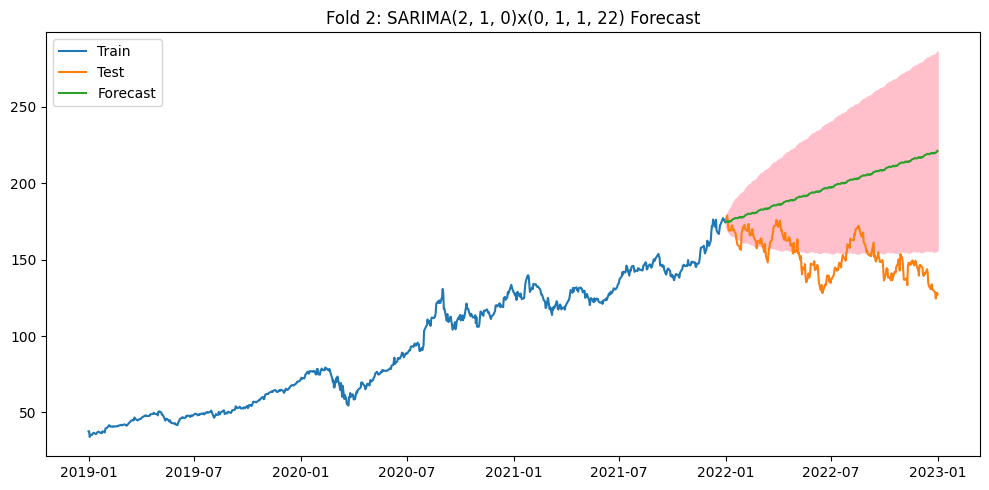


Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31
Best ARIMA order: (2, 1, 3), RMSE: 47.1108
Best Seasonal order: (1, 1, 1, 5), RMSE: 37.2953
Fold 3 Metrics:
  RMSE: 37.2953
  MAE:  34.8186
  MAPE: 0.1972
  R2:   -3.4993


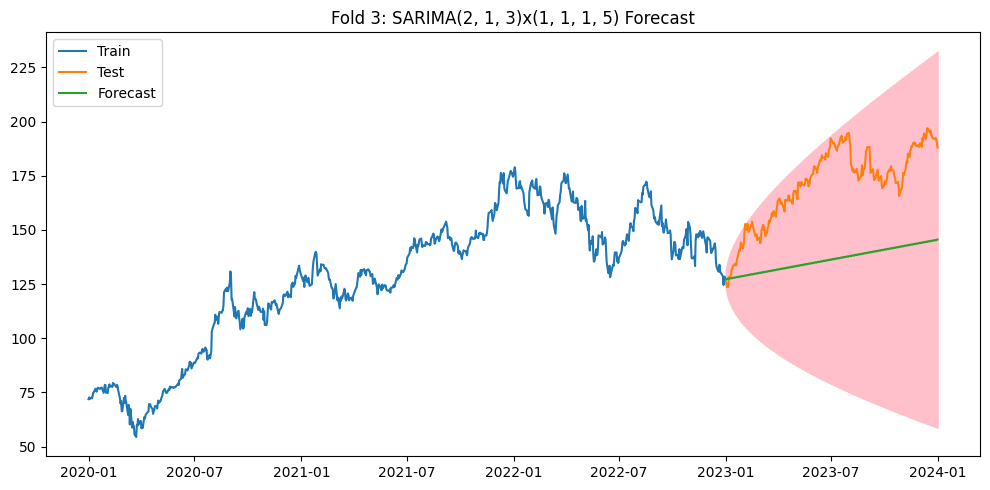

In [ ]:
# Load and preprocess data
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2018-01-01', '2020-12-31', '2021-01-01', '2021-12-31'),
    ('2019-01-01', '2021-12-31', '2022-01-01', '2022-12-31'),
    ('2020-01-01', '2022-12-31', '2023-01-01', '2023-12-31')
]

# Hyperparameter ranges
p = range(0, 3)
q = range(0, 5)
P = range(0, 2)
D = d = Q = [1]
m_values = [5, 22]
arima_params = list(product(p, d, q))
seasonal_params = list(product(P, D, Q, m_values))

# Helper functions
def evaluate_arima(train, test, order):
    try:
        model = SARIMAX(train, order=order, enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (order, rmse)
    except:
        return (order, np.inf)

def evaluate_seasonal(train, test, arima_order, seasonal_order):
    try:
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (seasonal_order, rmse)
    except:
        return (seasonal_order, np.inf)

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train = df.loc[train_start:train_end]['Close']
    test = df.loc[test_start:test_end]['Close']

    # ARIMA Grid Search
    # Ensure train and test are passed correctly to parallel functions
    arima_results = Parallel(n_jobs=-1)(delayed(evaluate_arima)(train, test, order) for order in arima_params)
    best_arima_order, best_arima_rmse = min(arima_results, key=lambda x: x[1])
    print(f"Best ARIMA order: {best_arima_order}, RMSE: {best_arima_rmse:.4f}")

    # Seasonal Grid Search
    # Ensure train and test are passed correctly to parallel functions
    seasonal_results = Parallel(n_jobs=-1)(
        delayed(evaluate_seasonal)(train, test, best_arima_order, seasonal_order)
        for seasonal_order in seasonal_params
    )
    best_seasonal_order, best_seasonal_rmse = min(seasonal_results, key=lambda x: x[1])
    print(f"Best Seasonal order: {best_seasonal_order}, RMSE: {best_seasonal_rmse:.4f}")

    # Fit final model
    model = SARIMAX(train, order=best_arima_order, seasonal_order=best_seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    forecast_result = results.get_forecast(steps=len(test))
    forecast_mean = forecast_result.predicted_mean
    forecast_ci = forecast_result.conf_int()


    # Metrics
    # Use forecast_mean for metrics
    rmse = np.sqrt(mean_squared_error(test, forecast_mean))
    mae = mean_absolute_error(test, forecast_mean)
    mape = mean_absolute_percentage_error(test, forecast_mean)
    r2 = r2_score(test, forecast_mean)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  MAPE: {mape:.4f}")
    print(f"  R2:   {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    # Use forecast_mean for plotting the forecast line
    plt.plot(test.index, forecast_mean, label='Forecast')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
    plt.title(f'Fold {i}: SARIMA{best_arima_order}x{best_seasonal_order} Forecast')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Explicitly delete large objects and collect garbage
    del model, results, forecast_result, forecast_mean, forecast_ci
    gc.collect()


chosen hyperparameters: order: (2,1,3), seasonal order: (0,1,1,22)

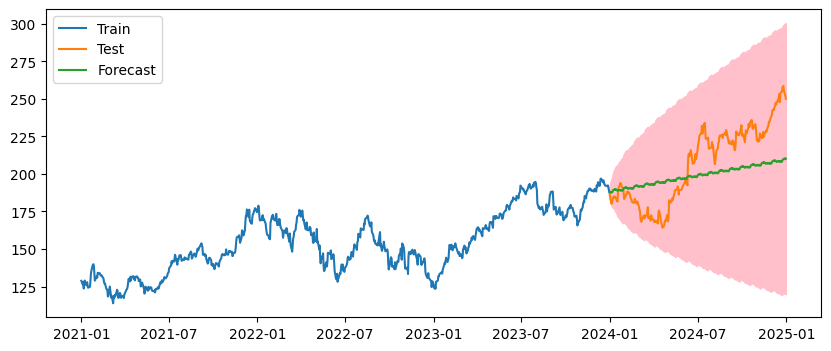

RMSE: 21.73, MAE: 19.04 MAPE: 0.09 R2: 0.28


In [ ]:
# Read CSV skipping the first two metadata rows
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2021-01-01':'2023-12-31']['Close']
test = df.loc['2024-01-01':'2024-12-31']['Close']

model = SARIMAX(train, order=(2,1,3), seasonal_order=(0,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
forecast = forecast_result.predicted_mean
forecast_ci = forecast_result.conf_int()
plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.legend()
plt.show()

# Metrics
rmse = np.sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)
mape = mean_absolute_percentage_error(test, forecast)
r2 = r2_score(test, forecast)
print(f'RMSE: {rmse:.2f}, MAE: {mae:.2f}', f'MAPE: {mape:.2f}', f'R2: {r2:.2f}')

# **JPM:**

# Period 1:


Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31
Best ARIMA order: (0, 1, 0), RMSE: 3.4683
Best Seasonal order: (1, 1, 1, 22), RMSE: 2.9328
Fold 1 Metrics:
  RMSE: 2.9328
  MAE:  2.4822
  MAPE: 0.0521
  R2:   0.0503


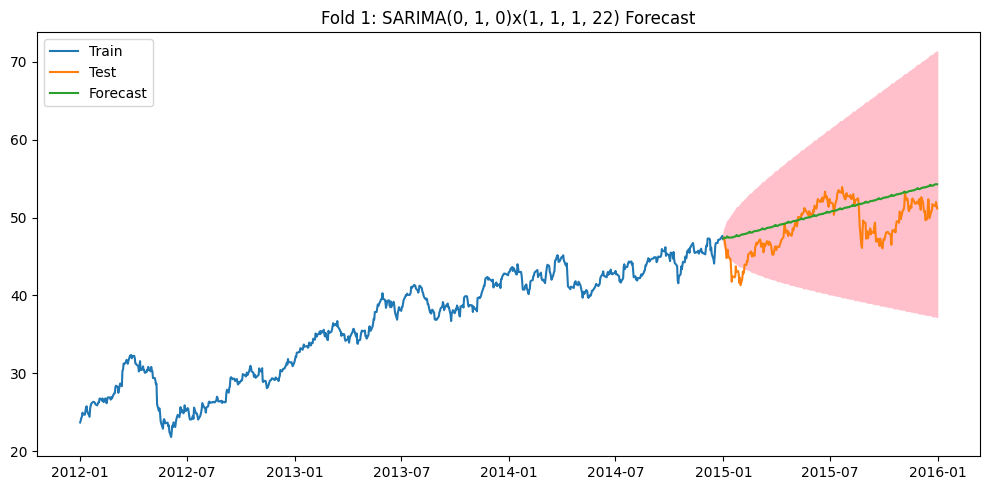


Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31
Best ARIMA order: (0, 1, 2), RMSE: 6.5862
Best Seasonal order: (0, 1, 1, 5), RMSE: 5.6562
Fold 2 Metrics:
  RMSE: 5.6562
  MAE:  5.0436
  MAPE: 0.0981
  R2:   0.2555


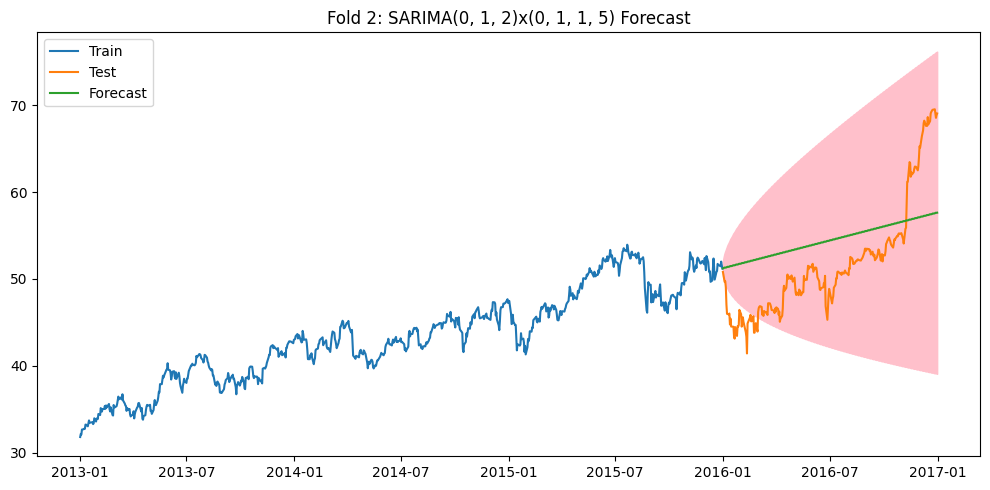


Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31
Best ARIMA order: (2, 1, 3), RMSE: 7.7788
Best Seasonal order: (1, 1, 1, 22), RMSE: 3.6743
Fold 3 Metrics:
  RMSE: 3.6742
  MAE:  2.7799
  MAPE: 0.0362
  R2:   0.5686


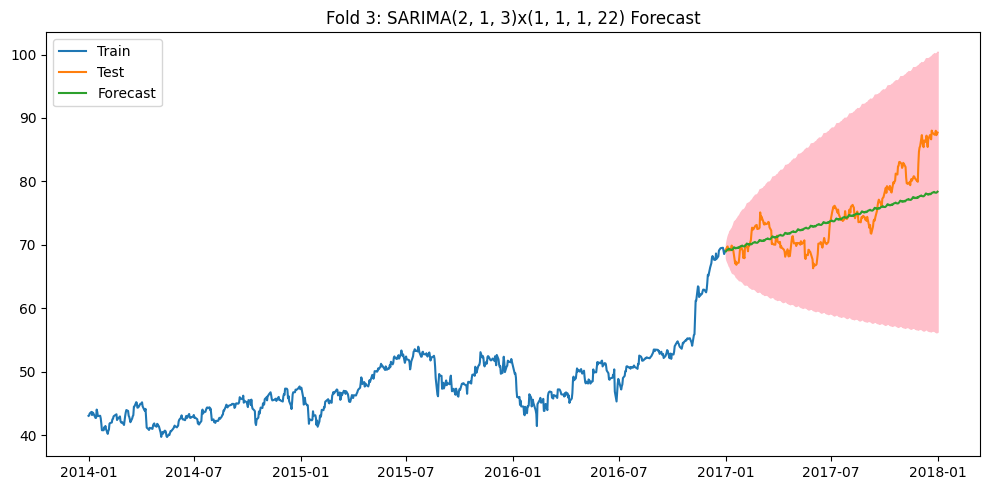

In [ ]:
# Load and preprocess data
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2012-01-01', '2014-12-31', '2015-01-01', '2015-12-31'),
    ('2013-01-01', '2015-12-31', '2016-01-01', '2016-12-31'),
    ('2014-01-01', '2016-12-31', '2017-01-01', '2017-12-31')
]

# Hyperparameter ranges
p = range(0, 3)
q = range(0, 5)
P = range(0, 2)
D = d = Q = [1]
m_values = [5, 22]
arima_params = list(product(p, d, q))
seasonal_params = list(product(P, D, Q, m_values))

# Helper functions
def evaluate_arima(train, test, order):
    try:
        model = SARIMAX(train, order=order, enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (order, rmse)
    except:
        return (order, np.inf)

def evaluate_seasonal(train, test, arima_order, seasonal_order):
    try:
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (seasonal_order, rmse)
    except:
        return (seasonal_order, np.inf)

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train = df.loc[train_start:train_end]['Close']
    test = df.loc[test_start:test_end]['Close']

    # ARIMA Grid Search
    # Ensure train and test are passed correctly to parallel functions
    arima_results = Parallel(n_jobs=-1)(delayed(evaluate_arima)(train, test, order) for order in arima_params)
    best_arima_order, best_arima_rmse = min(arima_results, key=lambda x: x[1])
    print(f"Best ARIMA order: {best_arima_order}, RMSE: {best_arima_rmse:.4f}")

    # Seasonal Grid Search
    # Ensure train and test are passed correctly to parallel functions
    seasonal_results = Parallel(n_jobs=-1)(
        delayed(evaluate_seasonal)(train, test, best_arima_order, seasonal_order)
        for seasonal_order in seasonal_params
    )
    best_seasonal_order, best_seasonal_rmse = min(seasonal_results, key=lambda x: x[1])
    print(f"Best Seasonal order: {best_seasonal_order}, RMSE: {best_seasonal_rmse:.4f}")

    # Fit final model
    model = SARIMAX(train, order=best_arima_order, seasonal_order=best_seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    forecast_result = results.get_forecast(steps=len(test))
    forecast_mean = forecast_result.predicted_mean
    forecast_ci = forecast_result.conf_int()


    # Metrics
    # Use forecast_mean for metrics
    rmse = np.sqrt(mean_squared_error(test, forecast_mean))
    mae = mean_absolute_error(test, forecast_mean)
    mape = mean_absolute_percentage_error(test, forecast_mean)
    r2 = r2_score(test, forecast_mean)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  MAPE: {mape:.4f}")
    print(f"  R2:   {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    # Use forecast_mean for plotting the forecast line
    plt.plot(test.index, forecast_mean, label='Forecast')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
    plt.title(f'Fold {i}: SARIMA{best_arima_order}x{best_seasonal_order} Forecast')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Explicitly delete large objects and collect garbage
    del model, results, forecast_result, forecast_mean, forecast_ci
    gc.collect()


chosen hyperparams: (2,1,3), (1,1,1,22)

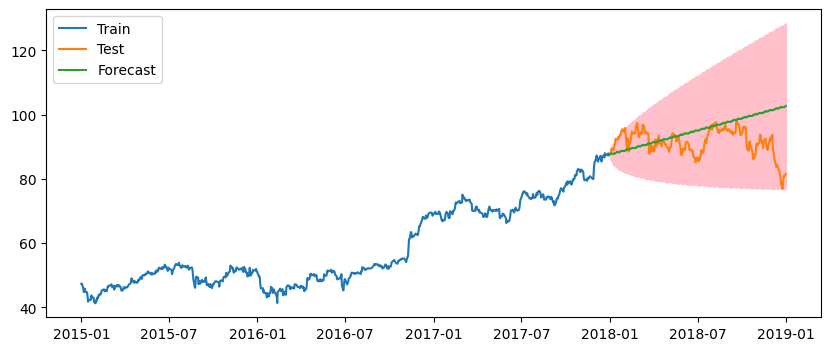

RMSE: 7.58, MAE: 5.53 MAPE: 0.06 R2: -2.72


In [ ]:
# Read CSV skipping the first two metadata rows
df = pd.read_csv('JPM.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2015-01-01':'2017-12-31']['Close']
test = df.loc['2018-01-01':'2018-12-31']['Close']

model = SARIMAX(train, order=(2,1,3), seasonal_order=(1,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
forecast = forecast_result.predicted_mean
forecast_ci = forecast_result.conf_int()
plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.legend()
plt.show()

# Metrics
rmse = np.sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)
mape = mean_absolute_percentage_error(test, forecast)
r2 = r2_score(test, forecast)
print(f'RMSE: {rmse:.2f}, MAE: {mae:.2f}', f'MAPE: {mape:.2f}', f'R2: {r2:.2f}')

# Period 2:


Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31
Best ARIMA order: (2, 1, 4), RMSE: 5.3874
Best Seasonal order: (0, 1, 1, 22), RMSE: 6.9987
Fold 1 Metrics:
  RMSE: 6.9987
  MAE:  5.0238
  MAPE: 0.0569
  R2:   -2.1679


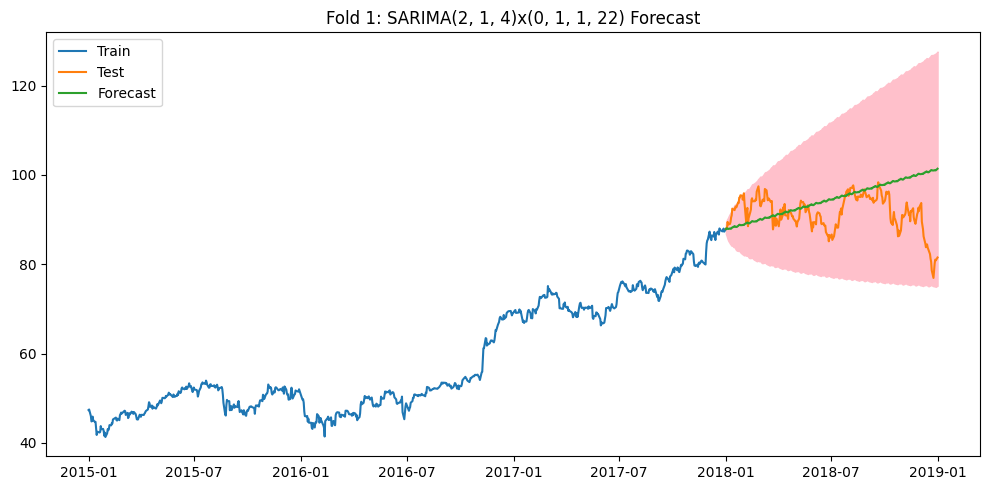


Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31
Best ARIMA order: (2, 1, 2), RMSE: 18.1898
Best Seasonal order: (1, 1, 1, 5), RMSE: 12.0292
Fold 2 Metrics:
  RMSE: 12.0292
  MAE:  9.8825
  MAPE: 0.0964
  R2:   -0.5501


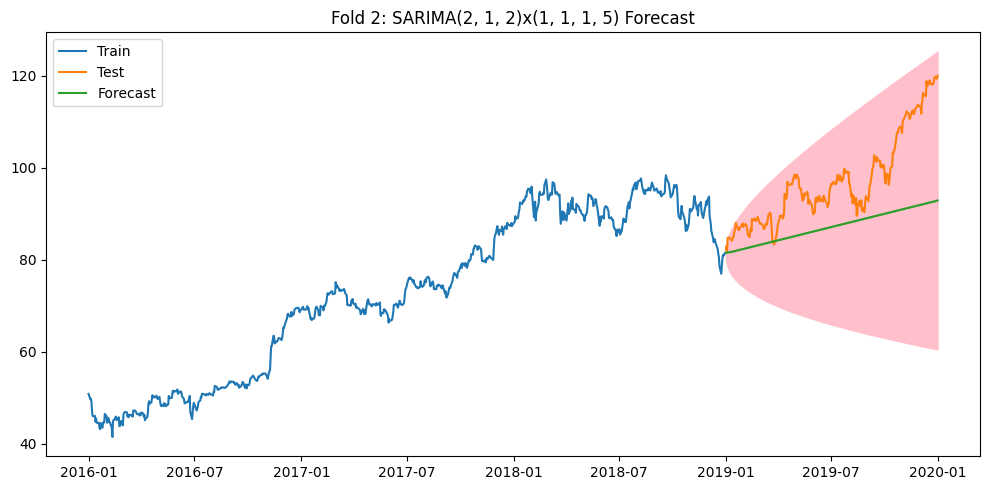


Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31
Best ARIMA order: (0, 1, 0), RMSE: 29.5141
Best Seasonal order: (0, 1, 1, 22), RMSE: 37.5010
Fold 3 Metrics:
  RMSE: 37.5010
  MAE:  34.3411
  MAPE: 0.3937
  R2:   -6.4673


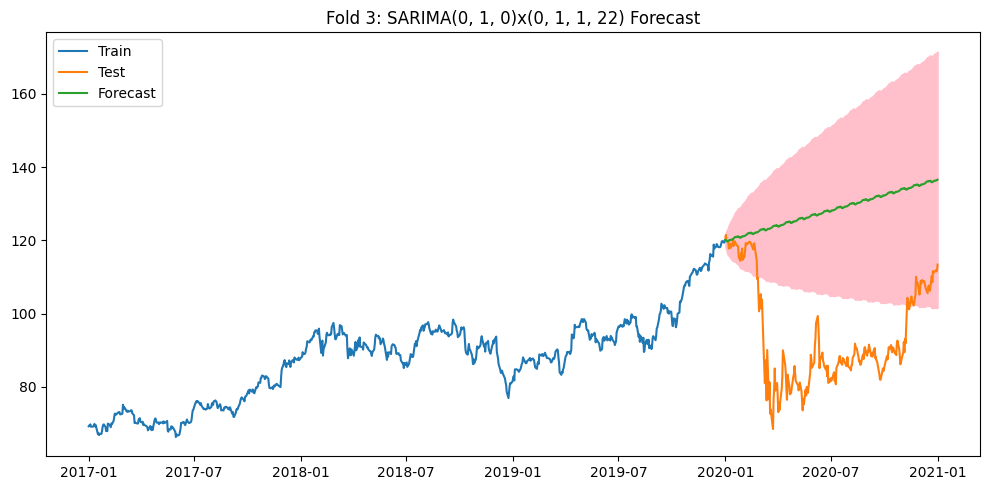

In [ ]:
# Load and preprocess data
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2015-01-01', '2017-12-31', '2018-01-01', '2018-12-31'),
    ('2016-01-01', '2018-12-31', '2019-01-01', '2019-12-31'),
    ('2017-01-01', '2019-12-31', '2020-01-01', '2020-12-31')
]

# Hyperparameter ranges
p = range(0, 3)
q = range(0, 5)
P = range(0, 2)
D = d = Q = [1]
m_values = [5, 22]
arima_params = list(product(p, d, q))
seasonal_params = list(product(P, D, Q, m_values))

# Helper functions
def evaluate_arima(train, test, order):
    try:
        model = SARIMAX(train, order=order, enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (order, rmse)
    except:
        return (order, np.inf)

def evaluate_seasonal(train, test, arima_order, seasonal_order):
    try:
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (seasonal_order, rmse)
    except:
        return (seasonal_order, np.inf)

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train = df.loc[train_start:train_end]['Close']
    test = df.loc[test_start:test_end]['Close']

    # ARIMA Grid Search
    # Ensure train and test are passed correctly to parallel functions
    arima_results = Parallel(n_jobs=-1)(delayed(evaluate_arima)(train, test, order) for order in arima_params)
    best_arima_order, best_arima_rmse = min(arima_results, key=lambda x: x[1])
    print(f"Best ARIMA order: {best_arima_order}, RMSE: {best_arima_rmse:.4f}")

    # Seasonal Grid Search
    # Ensure train and test are passed correctly to parallel functions
    seasonal_results = Parallel(n_jobs=-1)(
        delayed(evaluate_seasonal)(train, test, best_arima_order, seasonal_order)
        for seasonal_order in seasonal_params
    )
    best_seasonal_order, best_seasonal_rmse = min(seasonal_results, key=lambda x: x[1])
    print(f"Best Seasonal order: {best_seasonal_order}, RMSE: {best_seasonal_rmse:.4f}")

    # Fit final model
    model = SARIMAX(train, order=best_arima_order, seasonal_order=best_seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    forecast_result = results.get_forecast(steps=len(test))
    forecast_mean = forecast_result.predicted_mean
    forecast_ci = forecast_result.conf_int()


    # Metrics
    # Use forecast_mean for metrics
    rmse = np.sqrt(mean_squared_error(test, forecast_mean))
    mae = mean_absolute_error(test, forecast_mean)
    mape = mean_absolute_percentage_error(test, forecast_mean)
    r2 = r2_score(test, forecast_mean)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  MAPE: {mape:.4f}")
    print(f"  R2:   {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    # Use forecast_mean for plotting the forecast line
    plt.plot(test.index, forecast_mean, label='Forecast')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
    plt.title(f'Fold {i}: SARIMA{best_arima_order}x{best_seasonal_order} Forecast')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Explicitly delete large objects and collect garbage
    del model, results, forecast_result, forecast_mean, forecast_ci
    gc.collect()


Chosen parameters: (2,1,2), (0,1,1,22)

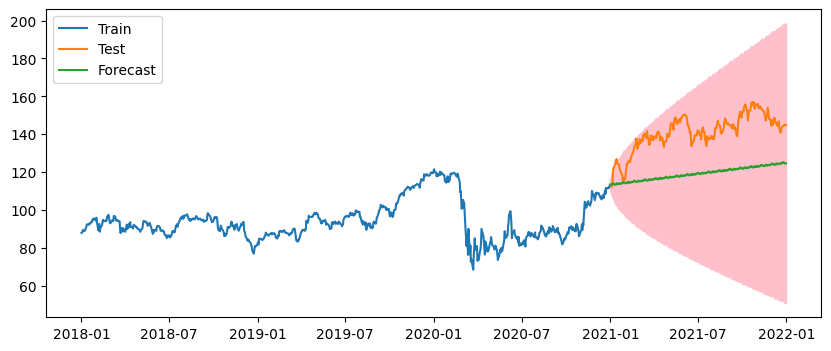

RMSE: 22.99, MAE: 21.82 MAPE: 0.15 R2: -4.81


In [ ]:
# Read CSV skipping the first two metadata rows
df = pd.read_csv('JPM.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2018-01-01':'2020-12-31']['Close']
test = df.loc['2021-01-01':'2021-12-31']['Close']

model = SARIMAX(train, order=(2,1,2), seasonal_order=(0,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
forecast = forecast_result.predicted_mean
forecast_ci = forecast_result.conf_int()
plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.legend()
plt.show()

# Metrics
rmse = np.sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)
mape = mean_absolute_percentage_error(test, forecast)
r2 = r2_score(test, forecast)
print(f'RMSE: {rmse:.2f}, MAE: {mae:.2f}', f'MAPE: {mape:.2f}', f'R2: {r2:.2f}')

# Period 3:


Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31
Best ARIMA order: (1, 1, 4), RMSE: 28.8892
Best Seasonal order: (1, 1, 1, 22), RMSE: 22.5931
Fold 1 Metrics:
  RMSE: 22.5934
  MAE:  21.4265
  MAPE: 0.1492
  R2:   -4.6115


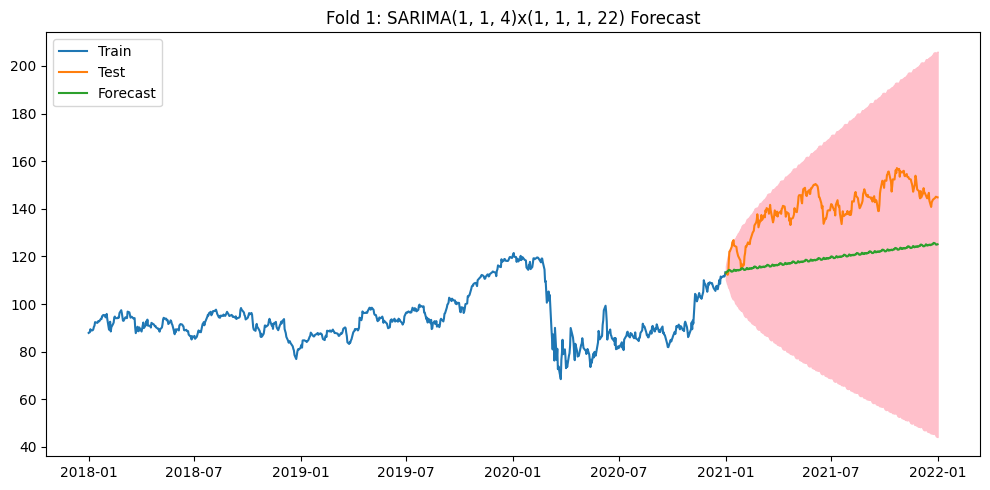


Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31
Best ARIMA order: (2, 1, 3), RMSE: 28.3155
Best Seasonal order: (0, 1, 1, 5), RMSE: 39.1105
Fold 2 Metrics:
  RMSE: 39.1105
  MAE:  35.9307
  MAPE: 0.3170
  R2:   -8.2228


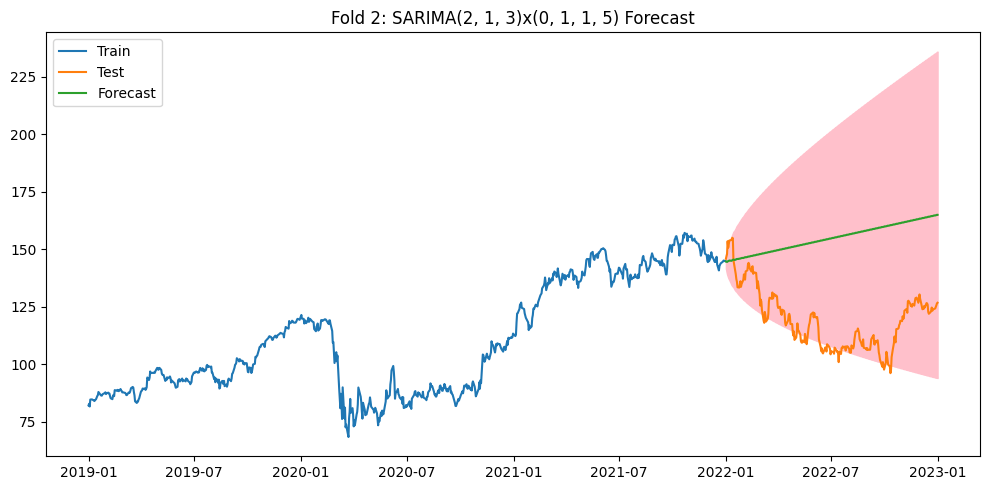


Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31
Best ARIMA order: (2, 1, 1), RMSE: 14.7507
Best Seasonal order: (1, 1, 1, 5), RMSE: 13.9492
Fold 3 Metrics:
  RMSE: 13.9492
  MAE:  11.3580
  MAPE: 0.0786
  R2:   -1.0055


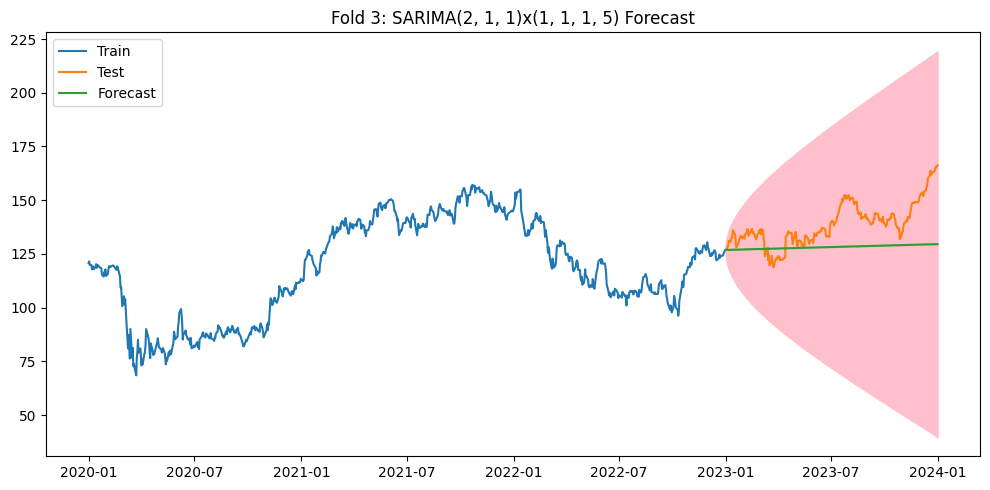

In [ ]:
# Load and preprocess data
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2018-01-01', '2020-12-31', '2021-01-01', '2021-12-31'),
    ('2019-01-01', '2021-12-31', '2022-01-01', '2022-12-31'),
    ('2020-01-01', '2022-12-31', '2023-01-01', '2023-12-31')
]

# Hyperparameter ranges
p = range(0, 3)
q = range(0, 5)
P = range(0, 2)
D = d = Q = [1]
m_values = [5, 22]
arima_params = list(product(p, d, q))
seasonal_params = list(product(P, D, Q, m_values))

# Helper functions
def evaluate_arima(train, test, order):
    try:
        model = SARIMAX(train, order=order, enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (order, rmse)
    except:
        return (order, np.inf)

def evaluate_seasonal(train, test, arima_order, seasonal_order):
    try:
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (seasonal_order, rmse)
    except:
        return (seasonal_order, np.inf)

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train = df.loc[train_start:train_end]['Close']
    test = df.loc[test_start:test_end]['Close']

    # ARIMA Grid Search
    # Ensure train and test are passed correctly to parallel functions
    arima_results = Parallel(n_jobs=-1)(delayed(evaluate_arima)(train, test, order) for order in arima_params)
    best_arima_order, best_arima_rmse = min(arima_results, key=lambda x: x[1])
    print(f"Best ARIMA order: {best_arima_order}, RMSE: {best_arima_rmse:.4f}")

    # Seasonal Grid Search
    # Ensure train and test are passed correctly to parallel functions
    seasonal_results = Parallel(n_jobs=-1)(
        delayed(evaluate_seasonal)(train, test, best_arima_order, seasonal_order)
        for seasonal_order in seasonal_params
    )
    best_seasonal_order, best_seasonal_rmse = min(seasonal_results, key=lambda x: x[1])
    print(f"Best Seasonal order: {best_seasonal_order}, RMSE: {best_seasonal_rmse:.4f}")

    # Fit final model
    model = SARIMAX(train, order=best_arima_order, seasonal_order=best_seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    forecast_result = results.get_forecast(steps=len(test))
    forecast_mean = forecast_result.predicted_mean
    forecast_ci = forecast_result.conf_int()


    # Metrics
    # Use forecast_mean for metrics
    rmse = np.sqrt(mean_squared_error(test, forecast_mean))
    mae = mean_absolute_error(test, forecast_mean)
    mape = mean_absolute_percentage_error(test, forecast_mean)
    r2 = r2_score(test, forecast_mean)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  MAPE: {mape:.4f}")
    print(f"  R2:   {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    # Use forecast_mean for plotting the forecast line
    plt.plot(test.index, forecast_mean, label='Forecast')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
    plt.title(f'Fold {i}: SARIMA{best_arima_order}x{best_seasonal_order} Forecast')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Explicitly delete large objects and collect garbage
    del model, results, forecast_result, forecast_mean, forecast_ci
    gc.collect()


chosen hyperparameters: order: (2,1,3), seasonal order: (1,1,1,5)

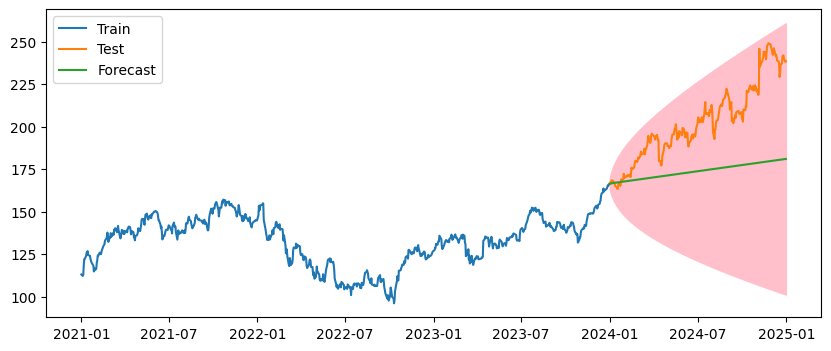

RMSE: 34.14, MAE: 28.85 MAPE: 0.13 R2: -1.32


In [ ]:
# Read CSV skipping the first two metadata rows
df = pd.read_csv('JPM.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2021-01-01':'2023-12-31']['Close']
test = df.loc['2024-01-01':'2024-12-31']['Close']

model = SARIMAX(train, order=(2,1,3), seasonal_order=(1,1,1,5), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
forecast = forecast_result.predicted_mean
forecast_ci = forecast_result.conf_int()
plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.legend()
plt.show()

# Metrics
rmse = np.sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)
mape = mean_absolute_percentage_error(test, forecast)
r2 = r2_score(test, forecast)
print(f'RMSE: {rmse:.2f}, MAE: {mae:.2f}', f'MAPE: {mape:.2f}', f'R2: {r2:.2f}')

# NVDA:

# Period 1:


Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31
Best ARIMA order: (1, 1, 1), RMSE: 0.1384
Best Seasonal order: (1, 1, 1, 22), RMSE: 0.0945
Fold 1 Metrics:
  RMSE: 77797280318690610170682146816.0000
  MAE:  12907193624851520245542682624.0000
  MAPE: 15964648777731251620888444928.0000
  R2:   -574821614263110422528377604257882418732749746826145859371008.0000


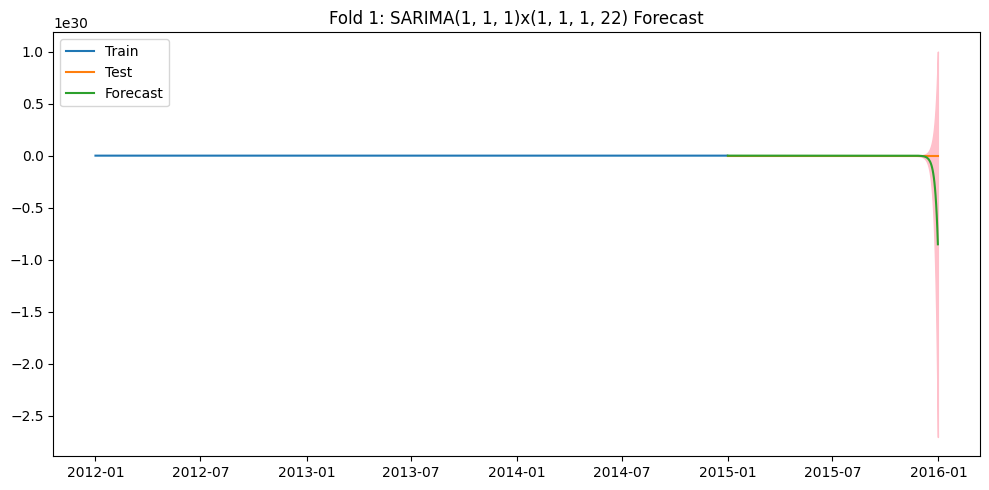


Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31
Best ARIMA order: (0, 1, 1), RMSE: 0.7506
Best Seasonal order: (1, 1, 1, 22), RMSE: 0.6541
Fold 2 Metrics:
  RMSE: 0.6540
  MAE:  0.4676
  MAPE: 0.2838
  R2:   -0.4387


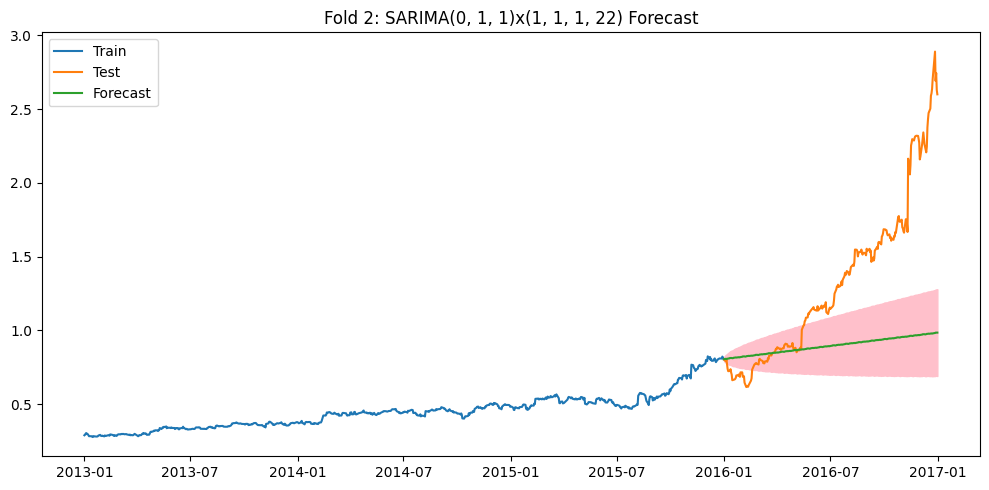


Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31
Best ARIMA order: (1, 1, 1), RMSE: 1.4469
Best Seasonal order: (1, 1, 1, 22), RMSE: 0.3980
Fold 3 Metrics:
  RMSE: 0.3982
  MAE:  0.3056
  MAPE: 0.0911
  R2:   0.8230


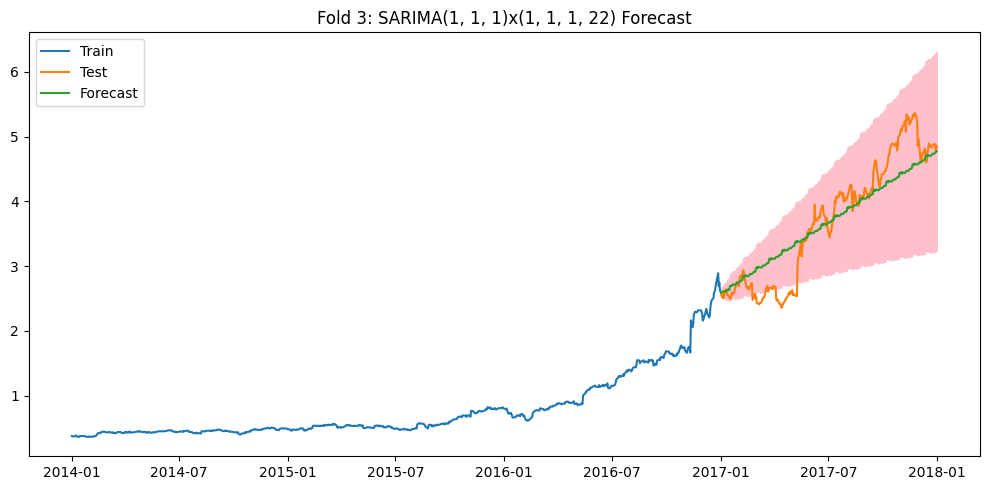

In [ ]:
# Load and preprocess data
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2012-01-01', '2014-12-31', '2015-01-01', '2015-12-31'),
    ('2013-01-01', '2015-12-31', '2016-01-01', '2016-12-31'),
    ('2014-01-01', '2016-12-31', '2017-01-01', '2017-12-31')
]

# Hyperparameter ranges
p = range(0, 3)
q = range(0, 5)
P = range(0, 2)
D = d = Q = [1]
m_values = [5, 22]
arima_params = list(product(p, d, q))
seasonal_params = list(product(P, D, Q, m_values))

# Helper functions
def evaluate_arima(train, test, order):
    try:
        model = SARIMAX(train, order=order, enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (order, rmse)
    except:
        return (order, np.inf)

def evaluate_seasonal(train, test, arima_order, seasonal_order):
    try:
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (seasonal_order, rmse)
    except:
        return (seasonal_order, np.inf)

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train = df.loc[train_start:train_end]['Close']
    test = df.loc[test_start:test_end]['Close']

    # ARIMA Grid Search
    # Ensure train and test are passed correctly to parallel functions
    arima_results = Parallel(n_jobs=-1)(delayed(evaluate_arima)(train, test, order) for order in arima_params)
    best_arima_order, best_arima_rmse = min(arima_results, key=lambda x: x[1])
    print(f"Best ARIMA order: {best_arima_order}, RMSE: {best_arima_rmse:.4f}")

    # Seasonal Grid Search
    # Ensure train and test are passed correctly to parallel functions
    seasonal_results = Parallel(n_jobs=-1)(
        delayed(evaluate_seasonal)(train, test, best_arima_order, seasonal_order)
        for seasonal_order in seasonal_params
    )
    best_seasonal_order, best_seasonal_rmse = min(seasonal_results, key=lambda x: x[1])
    print(f"Best Seasonal order: {best_seasonal_order}, RMSE: {best_seasonal_rmse:.4f}")

    # Fit final model
    model = SARIMAX(train, order=best_arima_order, seasonal_order=best_seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    forecast_result = results.get_forecast(steps=len(test))
    forecast_mean = forecast_result.predicted_mean
    forecast_ci = forecast_result.conf_int()


    # Metrics
    # Use forecast_mean for metrics
    rmse = np.sqrt(mean_squared_error(test, forecast_mean))
    mae = mean_absolute_error(test, forecast_mean)
    mape = mean_absolute_percentage_error(test, forecast_mean)
    r2 = r2_score(test, forecast_mean)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  MAPE: {mape:.4f}")
    print(f"  R2:   {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    # Use forecast_mean for plotting the forecast line
    plt.plot(test.index, forecast_mean, label='Forecast')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
    plt.title(f'Fold {i}: SARIMA{best_arima_order}x{best_seasonal_order} Forecast')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Explicitly delete large objects and collect garbage
    del model, results, forecast_result, forecast_mean, forecast_ci
    gc.collect()


strange divergence in fold 1. chosen hyperparams: (1,1,1), (1,1,1,22)

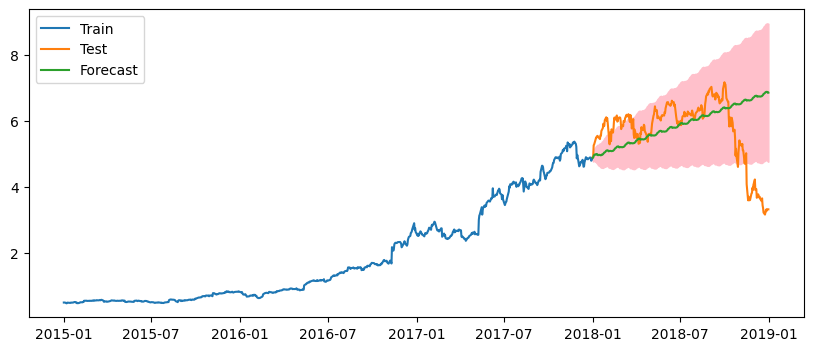

RMSE: 1.27, MAE: 0.87 MAPE: 0.19 R2: -0.87


In [ ]:
# Read CSV skipping the first two metadata rows
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2015-01-01':'2017-12-31']['Close']
test = df.loc['2018-01-01':'2018-12-31']['Close']

model = SARIMAX(train, order=(1,1,1), seasonal_order=(1,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
forecast = forecast_result.predicted_mean
forecast_ci = forecast_result.conf_int()
plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.legend()
plt.show()

# Metrics
rmse = np.sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)
mape = mean_absolute_percentage_error(test, forecast)
r2 = r2_score(test, forecast)
print(f'RMSE: {rmse:.2f}, MAE: {mae:.2f}', f'MAPE: {mape:.2f}', f'R2: {r2:.2f}')

# Period 2:


Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31
Best ARIMA order: (2, 1, 0), RMSE: 1.2681
Best Seasonal order: (0, 1, 1, 22), RMSE: 1.1663
Fold 1 Metrics:
  RMSE: 1.1664
  MAE:  0.9218
  MAPE: 0.1903
  R2:   -0.5797


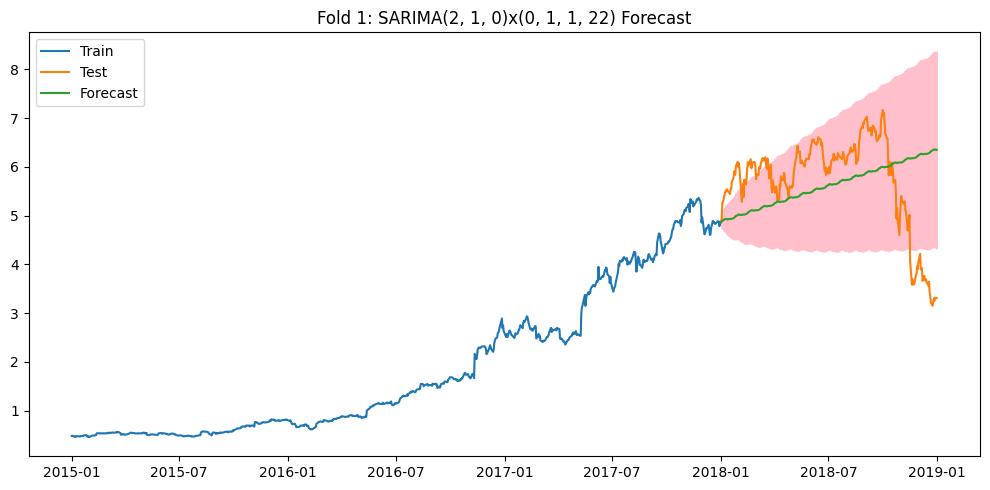


Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31
Best ARIMA order: (2, 1, 3), RMSE: 1.1973
Best Seasonal order: (1, 1, 1, 22), RMSE: 0.7384
Fold 2 Metrics:
  RMSE: 0.7318
  MAE:  0.5825
  MAPE: 0.1241
  R2:   -0.3458


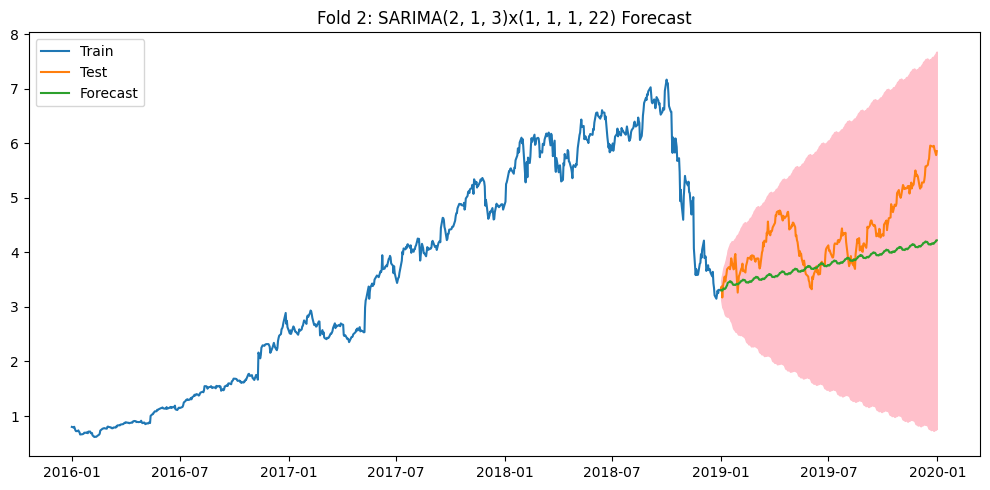


Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31
Best ARIMA order: (2, 1, 2), RMSE: 4.9113
Best Seasonal order: (1, 1, 1, 22), RMSE: 2.0104
Fold 3 Metrics:
  RMSE: 1.7196
  MAE:  1.3681
  MAPE: 0.1273
  R2:   0.6522


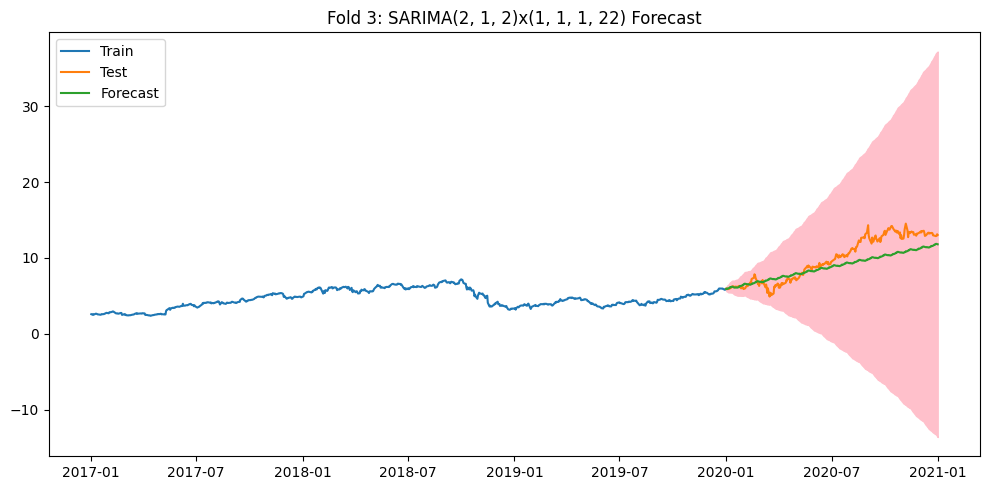

In [ ]:
# Load and preprocess data
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2015-01-01', '2017-12-31', '2018-01-01', '2018-12-31'),
    ('2016-01-01', '2018-12-31', '2019-01-01', '2019-12-31'),
    ('2017-01-01', '2019-12-31', '2020-01-01', '2020-12-31')
]

# Hyperparameter ranges
p = range(0, 3)
q = range(0, 5)
P = range(0, 2)
D = d = Q = [1]
m_values = [5, 22]
arima_params = list(product(p, d, q))
seasonal_params = list(product(P, D, Q, m_values))

# Helper functions
def evaluate_arima(train, test, order):
    try:
        model = SARIMAX(train, order=order, enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (order, rmse)
    except:
        return (order, np.inf)

def evaluate_seasonal(train, test, arima_order, seasonal_order):
    try:
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (seasonal_order, rmse)
    except:
        return (seasonal_order, np.inf)

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train = df.loc[train_start:train_end]['Close']
    test = df.loc[test_start:test_end]['Close']

    # ARIMA Grid Search
    # Ensure train and test are passed correctly to parallel functions
    arima_results = Parallel(n_jobs=-1)(delayed(evaluate_arima)(train, test, order) for order in arima_params)
    best_arima_order, best_arima_rmse = min(arima_results, key=lambda x: x[1])
    print(f"Best ARIMA order: {best_arima_order}, RMSE: {best_arima_rmse:.4f}")

    # Seasonal Grid Search
    # Ensure train and test are passed correctly to parallel functions
    seasonal_results = Parallel(n_jobs=-1)(
        delayed(evaluate_seasonal)(train, test, best_arima_order, seasonal_order)
        for seasonal_order in seasonal_params
    )
    best_seasonal_order, best_seasonal_rmse = min(seasonal_results, key=lambda x: x[1])
    print(f"Best Seasonal order: {best_seasonal_order}, RMSE: {best_seasonal_rmse:.4f}")

    # Fit final model
    model = SARIMAX(train, order=best_arima_order, seasonal_order=best_seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    forecast_result = results.get_forecast(steps=len(test))
    forecast_mean = forecast_result.predicted_mean
    forecast_ci = forecast_result.conf_int()


    # Metrics
    # Use forecast_mean for metrics
    rmse = np.sqrt(mean_squared_error(test, forecast_mean))
    mae = mean_absolute_error(test, forecast_mean)
    mape = mean_absolute_percentage_error(test, forecast_mean)
    r2 = r2_score(test, forecast_mean)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  MAPE: {mape:.4f}")
    print(f"  R2:   {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    # Use forecast_mean for plotting the forecast line
    plt.plot(test.index, forecast_mean, label='Forecast')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
    plt.title(f'Fold {i}: SARIMA{best_arima_order}x{best_seasonal_order} Forecast')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Explicitly delete large objects and collect garbage
    del model, results, forecast_result, forecast_mean, forecast_ci
    gc.collect()


Chosen parameters: (2,1,2), (1,1,1,22)

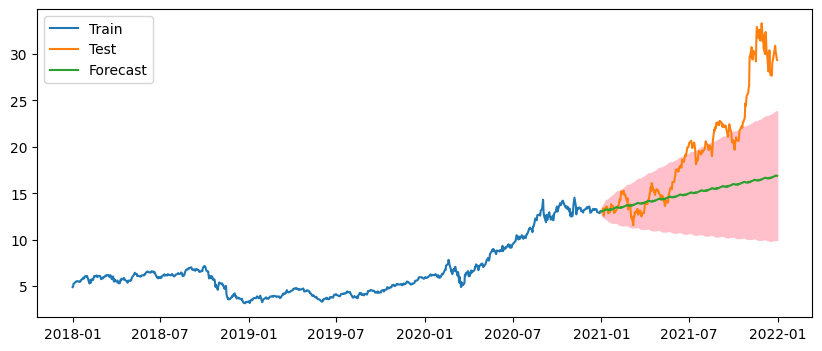

RMSE: 6.62, MAE: 4.72 MAPE: 0.20 R2: -0.28


In [ ]:
# Read CSV skipping the first two metadata rows
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2018-01-01':'2020-12-31']['Close']
test = df.loc['2021-01-01':'2021-12-31']['Close']

model = SARIMAX(train, order=(2,1,2), seasonal_order=(1,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
forecast = forecast_result.predicted_mean
forecast_ci = forecast_result.conf_int()
plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.legend()
plt.show()

# Metrics
rmse = np.sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)
mape = mean_absolute_percentage_error(test, forecast)
r2 = r2_score(test, forecast)
print(f'RMSE: {rmse:.2f}, MAE: {mae:.2f}', f'MAPE: {mape:.2f}', f'R2: {r2:.2f}')

# Period 3:


Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31
Best ARIMA order: (0, 1, 4), RMSE: 8.6954
Best Seasonal order: (0, 1, 1, 5), RMSE: 6.5936
Fold 1 Metrics:
  RMSE: 6.5936
  MAE:  4.7026
  MAPE: 0.1980
  R2:   -0.2651


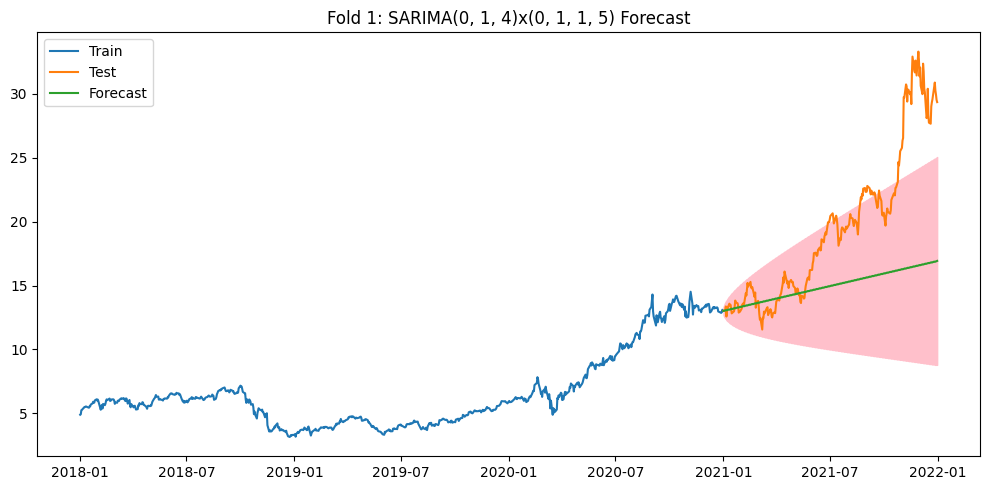


Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31
Best ARIMA order: (2, 1, 3), RMSE: 11.6649
Best Seasonal order: (0, 1, 1, 5), RMSE: 16.9338
Fold 2 Metrics:
  RMSE: 16.9338
  MAE:  15.4231
  MAPE: 0.9716
  R2:   -12.4253


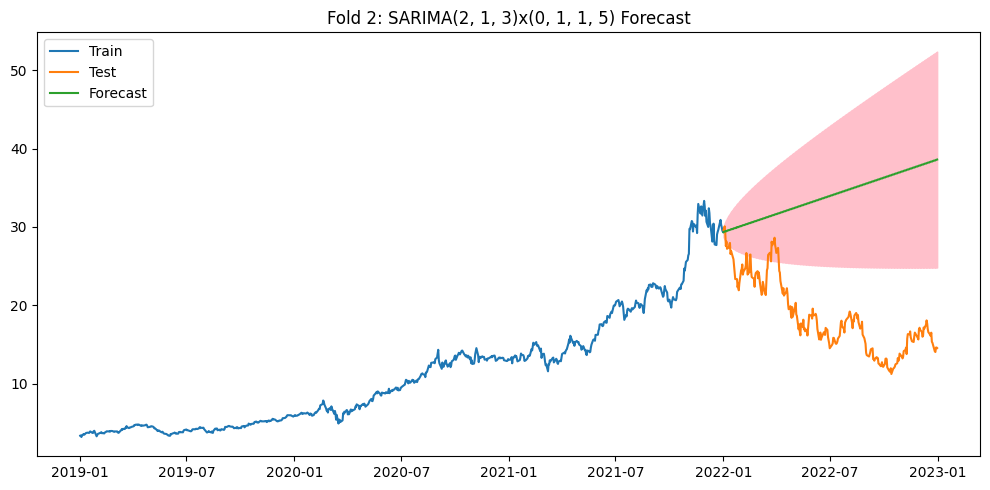


Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31
Best ARIMA order: (2, 1, 3), RMSE: 24.5082
Best Seasonal order: (1, 1, 1, 5), RMSE: 22.8951
Fold 3 Metrics:
  RMSE: 22.8951
  MAE:  20.5703
  MAPE: 0.5176
  R2:   -3.4687


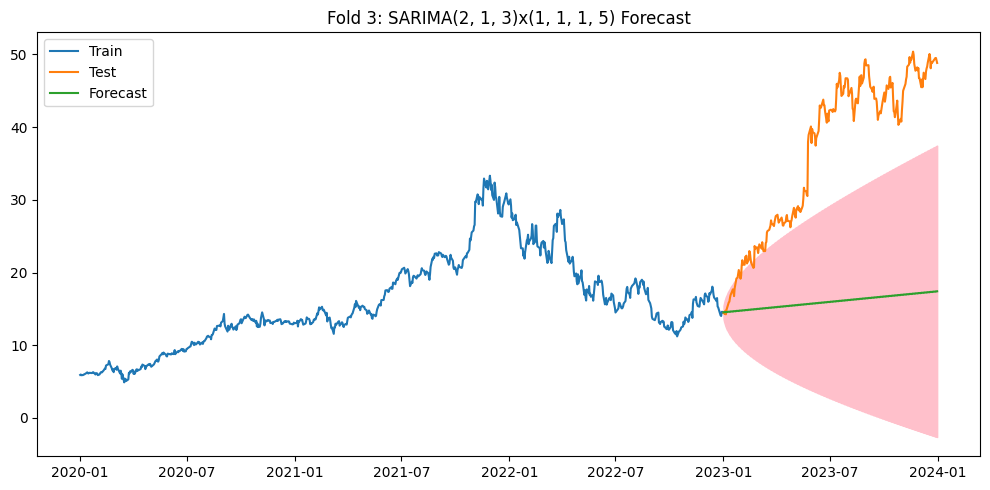

In [ ]:
# Load and preprocess data
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2018-01-01', '2020-12-31', '2021-01-01', '2021-12-31'),
    ('2019-01-01', '2021-12-31', '2022-01-01', '2022-12-31'),
    ('2020-01-01', '2022-12-31', '2023-01-01', '2023-12-31')
]

# Hyperparameter ranges
p = range(0, 3)
q = range(0, 5)
P = range(0, 2)
D = d = Q = [1]
m_values = [5, 22]
arima_params = list(product(p, d, q))
seasonal_params = list(product(P, D, Q, m_values))

# Helper functions
def evaluate_arima(train, test, order):
    try:
        model = SARIMAX(train, order=order, enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (order, rmse)
    except:
        return (order, np.inf)

def evaluate_seasonal(train, test, arima_order, seasonal_order):
    try:
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (seasonal_order, rmse)
    except:
        return (seasonal_order, np.inf)

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train = df.loc[train_start:train_end]['Close']
    test = df.loc[test_start:test_end]['Close']

    # ARIMA Grid Search
    # Ensure train and test are passed correctly to parallel functions
    arima_results = Parallel(n_jobs=-1)(delayed(evaluate_arima)(train, test, order) for order in arima_params)
    best_arima_order, best_arima_rmse = min(arima_results, key=lambda x: x[1])
    print(f"Best ARIMA order: {best_arima_order}, RMSE: {best_arima_rmse:.4f}")

    # Seasonal Grid Search
    # Ensure train and test are passed correctly to parallel functions
    seasonal_results = Parallel(n_jobs=-1)(
        delayed(evaluate_seasonal)(train, test, best_arima_order, seasonal_order)
        for seasonal_order in seasonal_params
    )
    best_seasonal_order, best_seasonal_rmse = min(seasonal_results, key=lambda x: x[1])
    print(f"Best Seasonal order: {best_seasonal_order}, RMSE: {best_seasonal_rmse:.4f}")

    # Fit final model
    model = SARIMAX(train, order=best_arima_order, seasonal_order=best_seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    forecast_result = results.get_forecast(steps=len(test))
    forecast_mean = forecast_result.predicted_mean
    forecast_ci = forecast_result.conf_int()


    # Metrics
    # Use forecast_mean for metrics
    rmse = np.sqrt(mean_squared_error(test, forecast_mean))
    mae = mean_absolute_error(test, forecast_mean)
    mape = mean_absolute_percentage_error(test, forecast_mean)
    r2 = r2_score(test, forecast_mean)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  MAPE: {mape:.4f}")
    print(f"  R2:   {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    # Use forecast_mean for plotting the forecast line
    plt.plot(test.index, forecast_mean, label='Forecast')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
    plt.title(f'Fold {i}: SARIMA{best_arima_order}x{best_seasonal_order} Forecast')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Explicitly delete large objects and collect garbage
    del model, results, forecast_result, forecast_mean, forecast_ci
    gc.collect()


chosen hyperparameters: order: (2,1,3), seasonal order: (0,1,1,5)

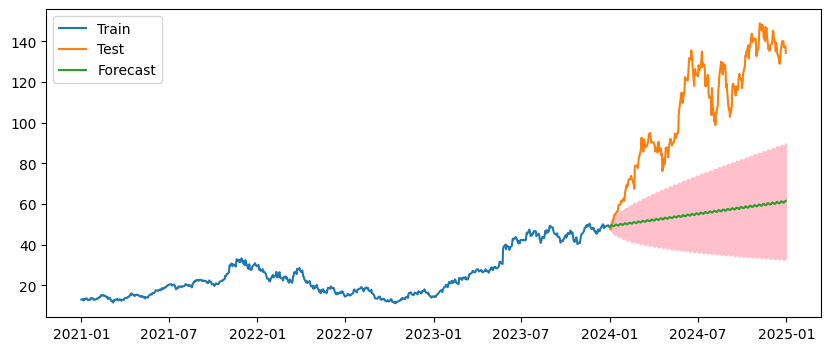

RMSE: 57.66, MAE: 52.57 MAPE: 0.46 R2: -3.59


In [ ]:
# Read CSV skipping the first two metadata rows
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2021-01-01':'2023-12-31']['Close']
test = df.loc['2024-01-01':'2024-12-31']['Close']

model = SARIMAX(train, order=(2,1,3), seasonal_order=(0,1,1,5), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
forecast = forecast_result.predicted_mean
forecast_ci = forecast_result.conf_int()
plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.legend()
plt.show()

# Metrics
rmse = np.sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)
mape = mean_absolute_percentage_error(test, forecast)
r2 = r2_score(test, forecast)
print(f'RMSE: {rmse:.2f}, MAE: {mae:.2f}', f'MAPE: {mape:.2f}', f'R2: {r2:.2f}')

# SPY:

# Period 1:


Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31
Best ARIMA order: (0, 1, 0), RMSE: 4.8119
Best Seasonal order: (1, 1, 1, 5), RMSE: 13.1798
Fold 1 Metrics:
  RMSE: 13.1798
  MAE:  10.3107
  MAPE: 0.0600
  R2:   -7.8486


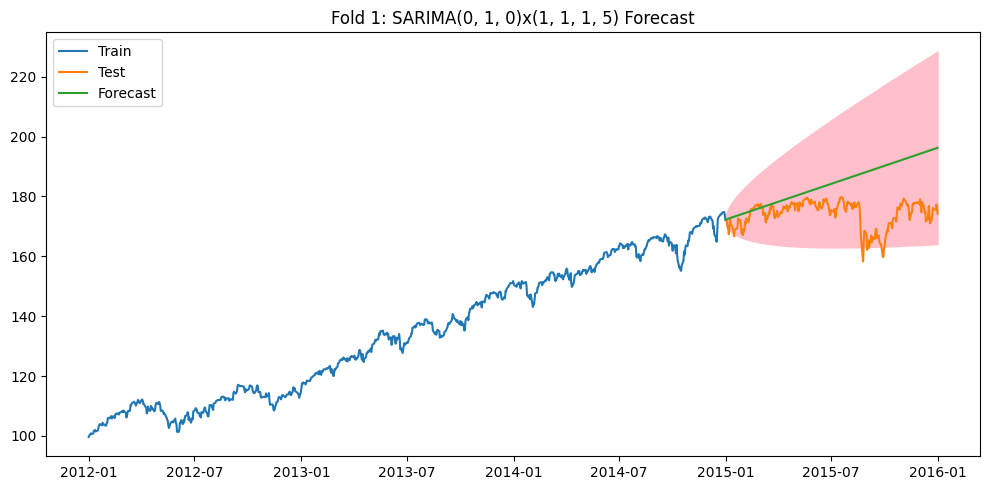


Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31
Best ARIMA order: (2, 1, 2), RMSE: 11.4904
Best Seasonal order: (1, 1, 1, 22), RMSE: 6.6562
Fold 2 Metrics:
  RMSE: 6.6562
  MAE:  4.9160
  MAPE: 0.0285
  R2:   0.5339


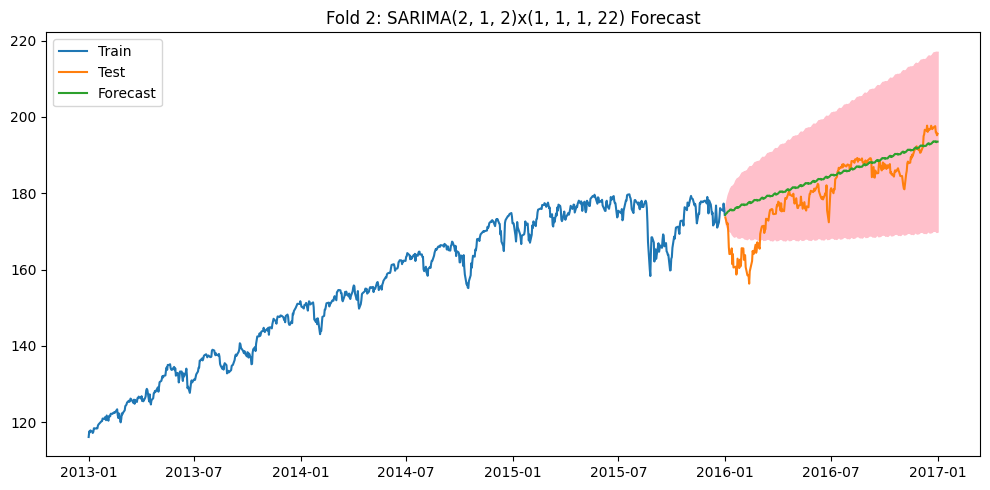


Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31
Best ARIMA order: (1, 1, 4), RMSE: 22.3897
Best Seasonal order: (1, 1, 1, 22), RMSE: 12.4535
Fold 3 Metrics:
  RMSE: 12.4535
  MAE:  10.8031
  MAPE: 0.0489
  R2:   -0.3010


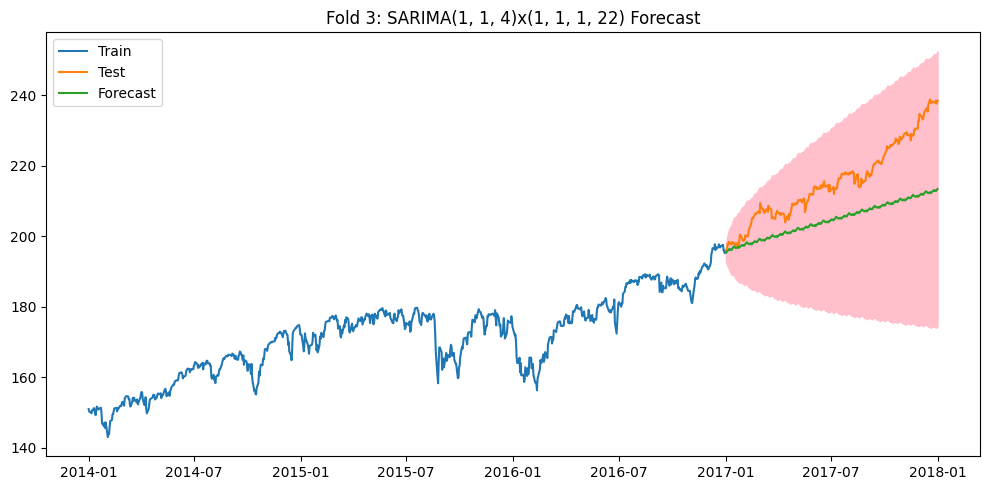

In [ ]:
# Load and preprocess data
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2012-01-01', '2014-12-31', '2015-01-01', '2015-12-31'),
    ('2013-01-01', '2015-12-31', '2016-01-01', '2016-12-31'),
    ('2014-01-01', '2016-12-31', '2017-01-01', '2017-12-31')
]

# Hyperparameter ranges
p = range(0, 3)
q = range(0, 5)
P = range(0, 2)
D = d = Q = [1]
m_values = [5, 22]
arima_params = list(product(p, d, q))
seasonal_params = list(product(P, D, Q, m_values))

# Helper functions
def evaluate_arima(train, test, order):
    try:
        model = SARIMAX(train, order=order, enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (order, rmse)
    except:
        return (order, np.inf)

def evaluate_seasonal(train, test, arima_order, seasonal_order):
    try:
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (seasonal_order, rmse)
    except:
        return (seasonal_order, np.inf)

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train = df.loc[train_start:train_end]['Close']
    test = df.loc[test_start:test_end]['Close']

    # ARIMA Grid Search
    # Ensure train and test are passed correctly to parallel functions
    arima_results = Parallel(n_jobs=-1)(delayed(evaluate_arima)(train, test, order) for order in arima_params)
    best_arima_order, best_arima_rmse = min(arima_results, key=lambda x: x[1])
    print(f"Best ARIMA order: {best_arima_order}, RMSE: {best_arima_rmse:.4f}")

    # Seasonal Grid Search
    # Ensure train and test are passed correctly to parallel functions
    seasonal_results = Parallel(n_jobs=-1)(
        delayed(evaluate_seasonal)(train, test, best_arima_order, seasonal_order)
        for seasonal_order in seasonal_params
    )
    best_seasonal_order, best_seasonal_rmse = min(seasonal_results, key=lambda x: x[1])
    print(f"Best Seasonal order: {best_seasonal_order}, RMSE: {best_seasonal_rmse:.4f}")

    # Fit final model
    model = SARIMAX(train, order=best_arima_order, seasonal_order=best_seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    forecast_result = results.get_forecast(steps=len(test))
    forecast_mean = forecast_result.predicted_mean
    forecast_ci = forecast_result.conf_int()


    # Metrics
    # Use forecast_mean for metrics
    rmse = np.sqrt(mean_squared_error(test, forecast_mean))
    mae = mean_absolute_error(test, forecast_mean)
    mape = mean_absolute_percentage_error(test, forecast_mean)
    r2 = r2_score(test, forecast_mean)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  MAPE: {mape:.4f}")
    print(f"  R2:   {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    # Use forecast_mean for plotting the forecast line
    plt.plot(test.index, forecast_mean, label='Forecast')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
    plt.title(f'Fold {i}: SARIMA{best_arima_order}x{best_seasonal_order} Forecast')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Explicitly delete large objects and collect garbage
    del model, results, forecast_result, forecast_mean, forecast_ci
    gc.collect()


chosen hyperparams: (1,1,4), (1,1,1,22)

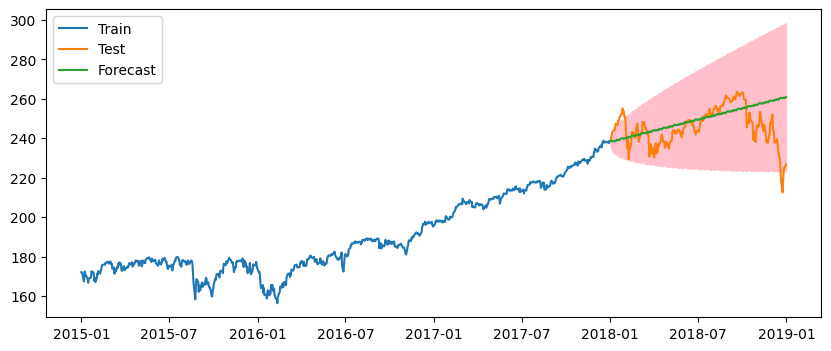

RMSE: 11.35, MAE: 7.95 MAPE: 0.03 R2: -0.49


In [ ]:
# Read CSV skipping the first two metadata rows
df = pd.read_csv('SPY.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2015-01-01':'2017-12-31']['Close']
test = df.loc['2018-01-01':'2018-12-31']['Close']

model = SARIMAX(train, order=(1,1,4), seasonal_order=(1,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
forecast = forecast_result.predicted_mean
forecast_ci = forecast_result.conf_int()
plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.legend()
plt.show()

# Metrics
rmse = np.sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)
mape = mean_absolute_percentage_error(test, forecast)
r2 = r2_score(test, forecast)
print(f'RMSE: {rmse:.2f}, MAE: {mae:.2f}', f'MAPE: {mape:.2f}', f'R2: {r2:.2f}')

# Period 2:


Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31
Best ARIMA order: (2, 1, 3), RMSE: 11.7627
Best Seasonal order: (1, 1, 1, 22), RMSE: 11.3014
Fold 1 Metrics:
  RMSE: 11.3012
  MAE:  7.9343
  MAPE: 0.0331
  R2:   -0.4822


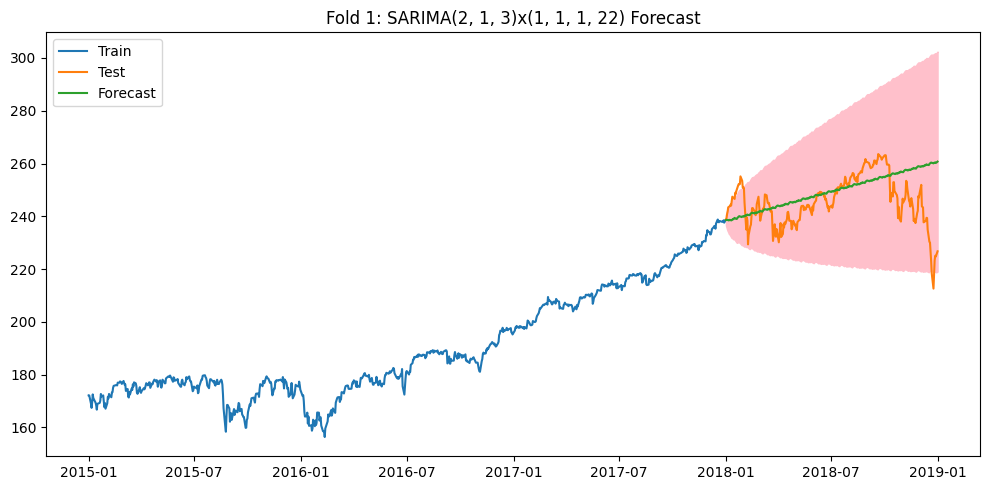


Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31
Best ARIMA order: (1, 1, 3), RMSE: 42.0562
Best Seasonal order: (1, 1, 1, 5), RMSE: 31.4766
Fold 2 Metrics:
  RMSE: 31.4766
  MAE:  29.7290
  MAPE: 0.1099
  R2:   -3.2594


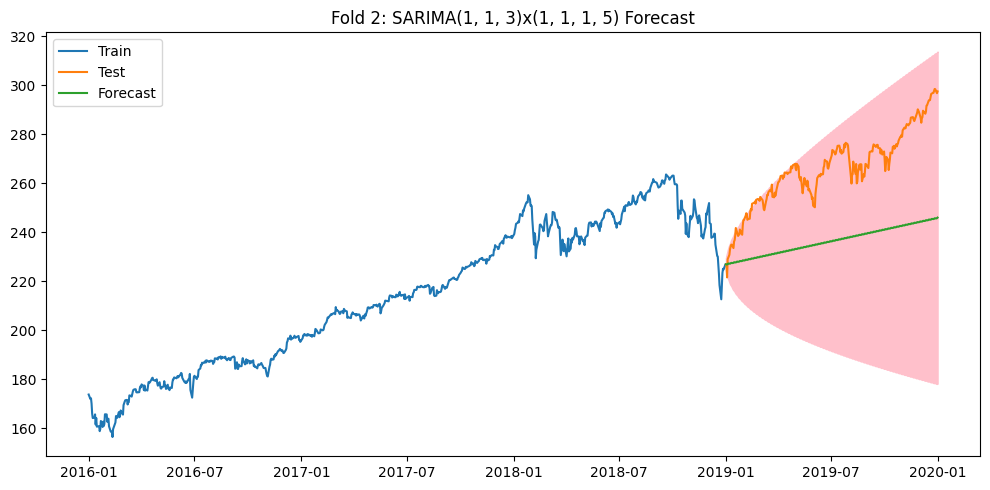


Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31
Best ARIMA order: (0, 1, 4), RMSE: 30.6097
Best Seasonal order: (1, 1, 1, 22), RMSE: 28.7168
Fold 3 Metrics:
  RMSE: 28.7168
  MAE:  20.6067
  MAPE: 0.0764
  R2:   0.1165


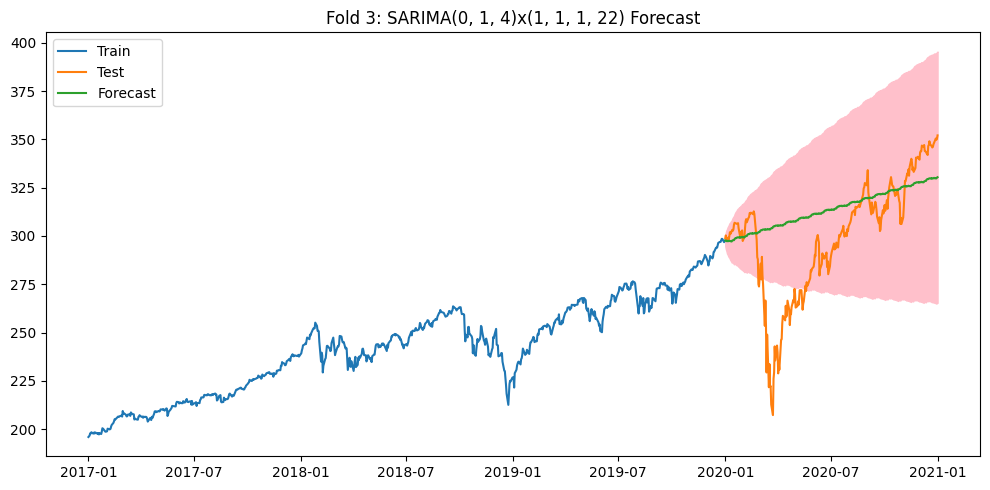

In [ ]:
# Load and preprocess data
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2015-01-01', '2017-12-31', '2018-01-01', '2018-12-31'),
    ('2016-01-01', '2018-12-31', '2019-01-01', '2019-12-31'),
    ('2017-01-01', '2019-12-31', '2020-01-01', '2020-12-31')
]

# Hyperparameter ranges
p = range(0, 3)
q = range(0, 5)
P = range(0, 2)
D = d = Q = [1]
m_values = [5, 22]
arima_params = list(product(p, d, q))
seasonal_params = list(product(P, D, Q, m_values))

# Helper functions
def evaluate_arima(train, test, order):
    try:
        model = SARIMAX(train, order=order, enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (order, rmse)
    except:
        return (order, np.inf)

def evaluate_seasonal(train, test, arima_order, seasonal_order):
    try:
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (seasonal_order, rmse)
    except:
        return (seasonal_order, np.inf)

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train = df.loc[train_start:train_end]['Close']
    test = df.loc[test_start:test_end]['Close']

    # ARIMA Grid Search
    # Ensure train and test are passed correctly to parallel functions
    arima_results = Parallel(n_jobs=-1)(delayed(evaluate_arima)(train, test, order) for order in arima_params)
    best_arima_order, best_arima_rmse = min(arima_results, key=lambda x: x[1])
    print(f"Best ARIMA order: {best_arima_order}, RMSE: {best_arima_rmse:.4f}")

    # Seasonal Grid Search
    # Ensure train and test are passed correctly to parallel functions
    seasonal_results = Parallel(n_jobs=-1)(
        delayed(evaluate_seasonal)(train, test, best_arima_order, seasonal_order)
        for seasonal_order in seasonal_params
    )
    best_seasonal_order, best_seasonal_rmse = min(seasonal_results, key=lambda x: x[1])
    print(f"Best Seasonal order: {best_seasonal_order}, RMSE: {best_seasonal_rmse:.4f}")

    # Fit final model
    model = SARIMAX(train, order=best_arima_order, seasonal_order=best_seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    forecast_result = results.get_forecast(steps=len(test))
    forecast_mean = forecast_result.predicted_mean
    forecast_ci = forecast_result.conf_int()


    # Metrics
    # Use forecast_mean for metrics
    rmse = np.sqrt(mean_squared_error(test, forecast_mean))
    mae = mean_absolute_error(test, forecast_mean)
    mape = mean_absolute_percentage_error(test, forecast_mean)
    r2 = r2_score(test, forecast_mean)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  MAPE: {mape:.4f}")
    print(f"  R2:   {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    # Use forecast_mean for plotting the forecast line
    plt.plot(test.index, forecast_mean, label='Forecast')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
    plt.title(f'Fold {i}: SARIMA{best_arima_order}x{best_seasonal_order} Forecast')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Explicitly delete large objects and collect garbage
    del model, results, forecast_result, forecast_mean, forecast_ci
    gc.collect()


Chosen parameters: (1,1,3), (1,1,1,22)

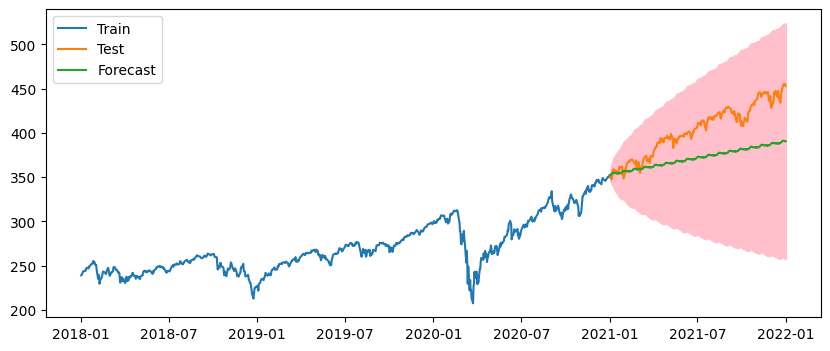

RMSE: 36.54, MAE: 31.87 MAPE: 0.08 R2: -0.62


In [ ]:
# Read CSV skipping the first two metadata rows
df = pd.read_csv('SPY.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2018-01-01':'2020-12-31']['Close']
test = df.loc['2021-01-01':'2021-12-31']['Close']

model = SARIMAX(train, order=(1,1,3), seasonal_order=(1,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
forecast = forecast_result.predicted_mean
forecast_ci = forecast_result.conf_int()
plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.legend()
plt.show()

# Metrics
rmse = np.sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)
mape = mean_absolute_percentage_error(test, forecast)
r2 = r2_score(test, forecast)
print(f'RMSE: {rmse:.2f}, MAE: {mae:.2f}', f'MAPE: {mape:.2f}', f'R2: {r2:.2f}')

# Period 3:


Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31
Best ARIMA order: (0, 1, 4), RMSE: 58.5463
Best Seasonal order: (1, 1, 1, 5), RMSE: 35.6968
Fold 1 Metrics:
  RMSE: 35.6968
  MAE:  31.3009
  MAPE: 0.0749
  R2:   -0.5422


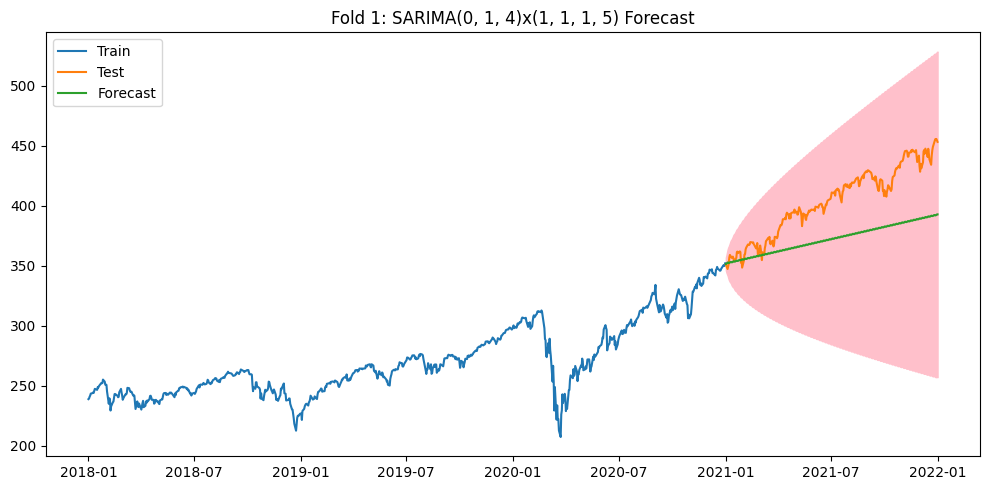


Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31
Best ARIMA order: (0, 1, 4), RMSE: 65.8506
Best Seasonal order: (1, 1, 1, 22), RMSE: 107.6617
Fold 2 Metrics:
  RMSE: 107.6617
  MAE:  97.8932
  MAPE: 0.2577
  R2:   -15.5756


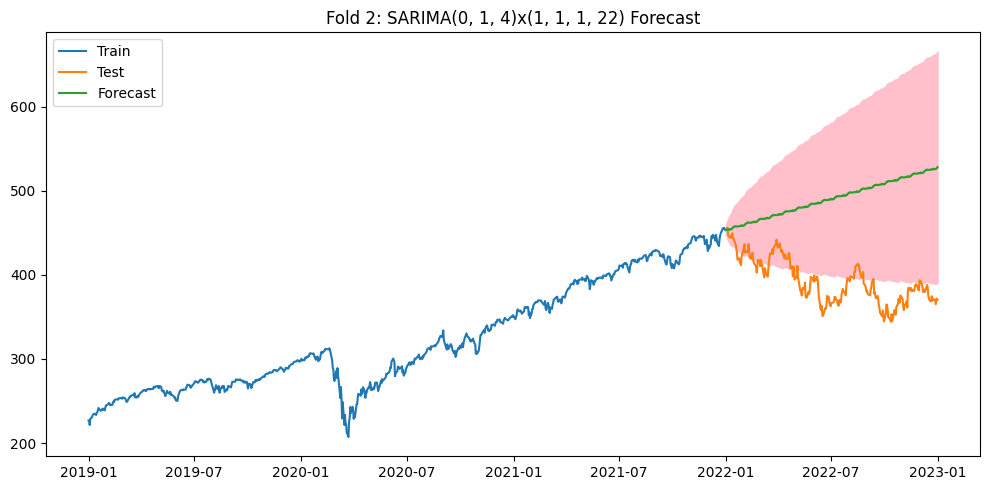


Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31
Best ARIMA order: (2, 1, 2), RMSE: 52.1666
Best Seasonal order: (0, 1, 1, 22), RMSE: 40.1246
Fold 3 Metrics:
  RMSE: 40.1246
  MAE:  35.6547
  MAPE: 0.0832
  R2:   -1.7522


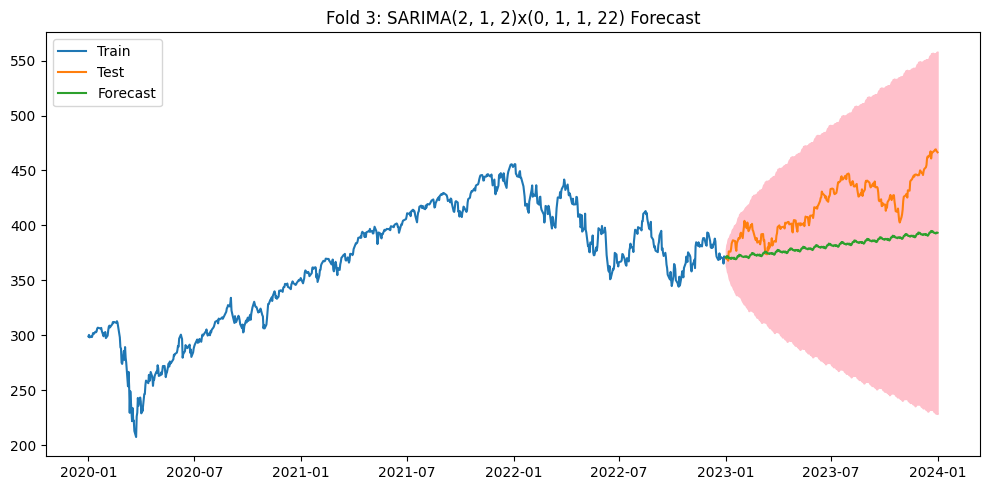

In [ ]:
# Load and preprocess data
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2018-01-01', '2020-12-31', '2021-01-01', '2021-12-31'),
    ('2019-01-01', '2021-12-31', '2022-01-01', '2022-12-31'),
    ('2020-01-01', '2022-12-31', '2023-01-01', '2023-12-31')
]

# Hyperparameter ranges
p = range(0, 3)
q = range(0, 5)
P = range(0, 2)
D = d = Q = [1]
m_values = [5, 22]
arima_params = list(product(p, d, q))
seasonal_params = list(product(P, D, Q, m_values))

# Helper functions
def evaluate_arima(train, test, order):
    try:
        model = SARIMAX(train, order=order, enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (order, rmse)
    except:
        return (order, np.inf)

def evaluate_seasonal(train, test, arima_order, seasonal_order):
    try:
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (seasonal_order, rmse)
    except:
        return (seasonal_order, np.inf)

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train = df.loc[train_start:train_end]['Close']
    test = df.loc[test_start:test_end]['Close']

    # ARIMA Grid Search
    # Ensure train and test are passed correctly to parallel functions
    arima_results = Parallel(n_jobs=-1)(delayed(evaluate_arima)(train, test, order) for order in arima_params)
    best_arima_order, best_arima_rmse = min(arima_results, key=lambda x: x[1])
    print(f"Best ARIMA order: {best_arima_order}, RMSE: {best_arima_rmse:.4f}")

    # Seasonal Grid Search
    # Ensure train and test are passed correctly to parallel functions
    seasonal_results = Parallel(n_jobs=-1)(
        delayed(evaluate_seasonal)(train, test, best_arima_order, seasonal_order)
        for seasonal_order in seasonal_params
    )
    best_seasonal_order, best_seasonal_rmse = min(seasonal_results, key=lambda x: x[1])
    print(f"Best Seasonal order: {best_seasonal_order}, RMSE: {best_seasonal_rmse:.4f}")

    # Fit final model
    model = SARIMAX(train, order=best_arima_order, seasonal_order=best_seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    forecast_result = results.get_forecast(steps=len(test))
    forecast_mean = forecast_result.predicted_mean
    forecast_ci = forecast_result.conf_int()


    # Metrics
    # Use forecast_mean for metrics
    rmse = np.sqrt(mean_squared_error(test, forecast_mean))
    mae = mean_absolute_error(test, forecast_mean)
    mape = mean_absolute_percentage_error(test, forecast_mean)
    r2 = r2_score(test, forecast_mean)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  MAPE: {mape:.4f}")
    print(f"  R2:   {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    # Use forecast_mean for plotting the forecast line
    plt.plot(test.index, forecast_mean, label='Forecast')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
    plt.title(f'Fold {i}: SARIMA{best_arima_order}x{best_seasonal_order} Forecast')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Explicitly delete large objects and collect garbage
    del model, results, forecast_result, forecast_mean, forecast_ci
    gc.collect()


chosen hyperparameters: order: (0,1,2), seasonal order: (1,1,1,22)

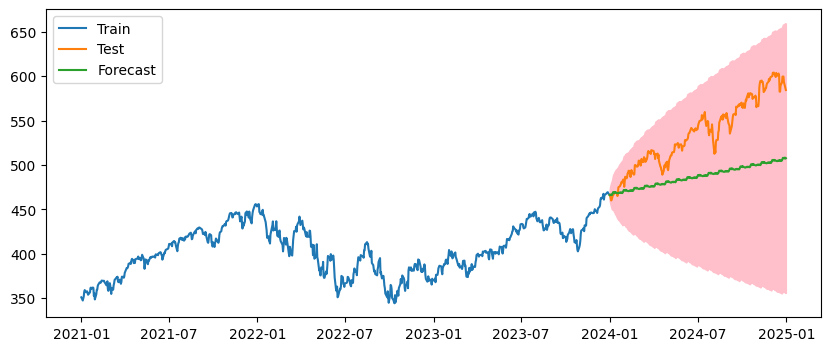

RMSE: 55.94, MAE: 49.11 MAPE: 0.09 R2: -1.14


In [ ]:
# Read CSV skipping the first two metadata rows
df = pd.read_csv('SPY.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2021-01-01':'2023-12-31']['Close']
test = df.loc['2024-01-01':'2024-12-31']['Close']

model = SARIMAX(train, order=(0,1,2), seasonal_order=(1,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
forecast = forecast_result.predicted_mean
forecast_ci = forecast_result.conf_int()
plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.legend()
plt.show()

# Metrics
rmse = np.sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)
mape = mean_absolute_percentage_error(test, forecast)
r2 = r2_score(test, forecast)
print(f'RMSE: {rmse:.2f}, MAE: {mae:.2f}', f'MAPE: {mape:.2f}', f'R2: {r2:.2f}')

## Weekly Prediction (Rolling window)

# AAPL:

100%|██████████| 73/73 [09:39<00:00,  7.94s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 3.5226
  MAE:  2.6546
  MAPE: 0.0192
  R2:   0.9414


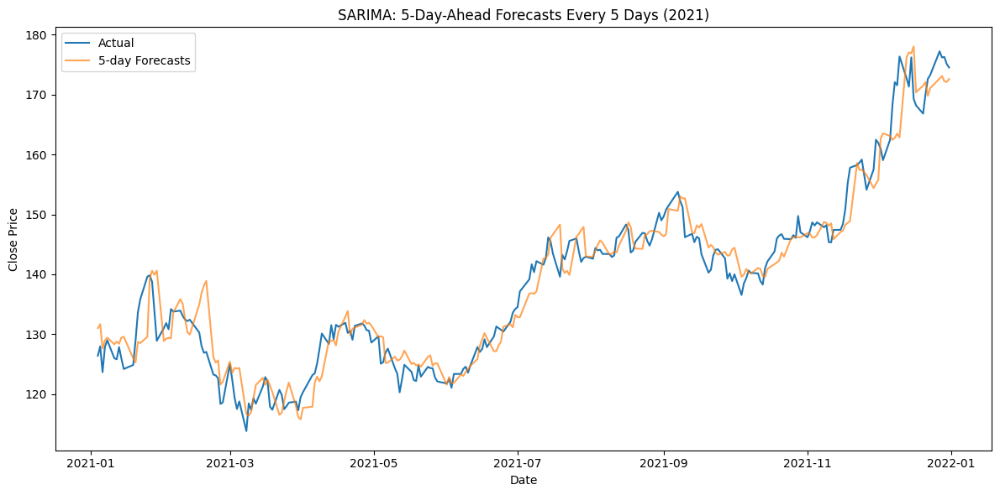

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (2, 1, 3)
best_seasonal_order = (0, 1, 1, 22)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2021-01-01", "2021-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("SARIMA: 5-Day-Ahead Forecasts Every 5 Days (2021)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

100%|██████████| 74/74 [08:01<00:00,  6.51s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 4.5212
  MAE:  3.2137
  MAPE: 0.0157
  R2:   0.9692


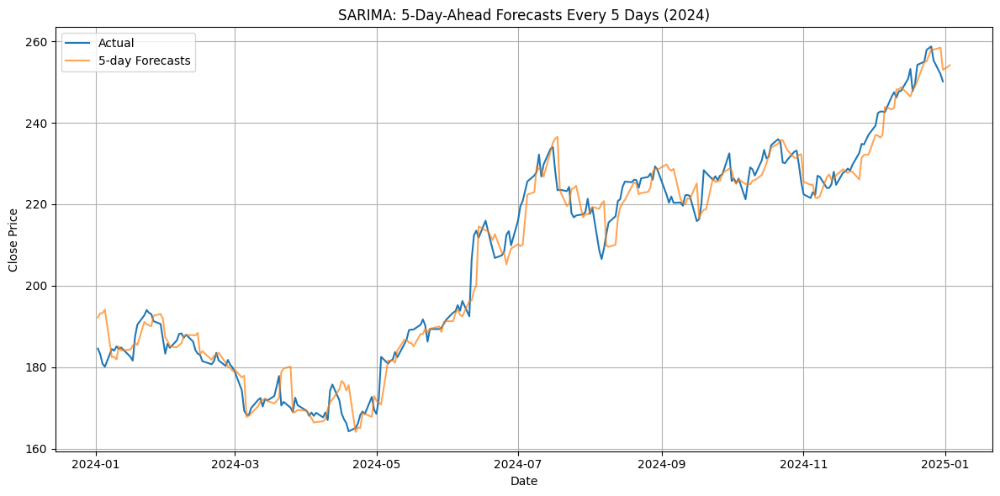

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (2, 1, 3)
best_seasonal_order = (0, 1, 1, 22)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2024-01-01", "2024-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2024"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("SARIMA: 5-Day-Ahead Forecasts Every 5 Days (2024)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

100%|██████████| 73/73 [08:05<00:00,  6.65s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 1.3155
  MAE:  0.8957
  MAPE: 0.0202
  R2:   0.9300


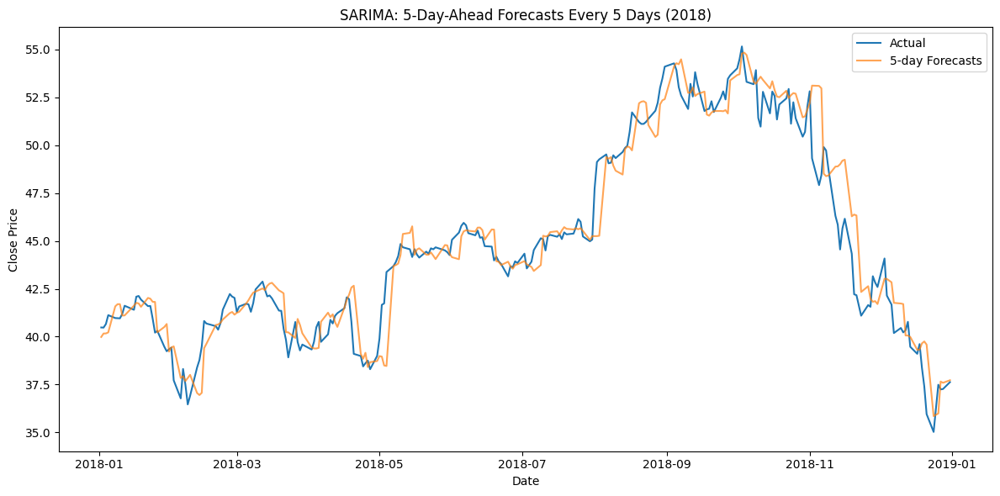

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (2, 1, 3)
best_seasonal_order = (1, 1, 1, 22)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2018-01-01", "2018-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2018"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("SARIMA: 5-Day-Ahead Forecasts Every 5 Days (2018)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

# JPM:

100%|██████████| 73/73 [04:03<00:00,  3.34s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 3.1259
  MAE:  2.4388
  MAPE: 0.0175
  R2:   0.8874


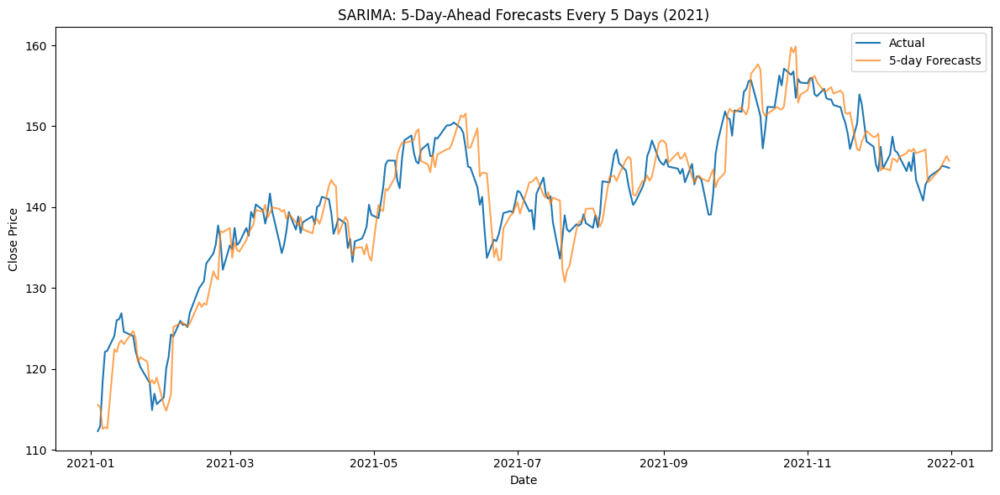

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (2, 1, 2)
best_seasonal_order = (0, 1, 1, 22)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2021-01-01", "2021-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("SARIMA: 5-Day-Ahead Forecasts Every 5 Days (2021)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 74/74 [00:58<00:00,  1.26it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 4.2194
  MAE:  2.8659
  MAPE: 0.0139
  R2:   0.9645


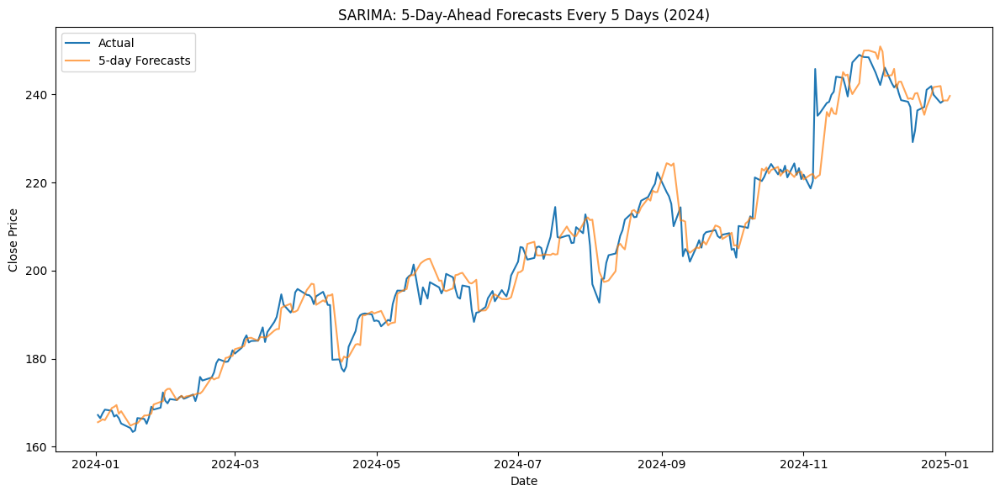

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (2, 1, 3)
best_seasonal_order = (0, 1, 1, 5)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2024-01-01", "2024-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2024"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("SARIMA: 5-Day-Ahead Forecasts Every 5 Days (2024)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 73/73 [07:38<00:00,  6.28s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 2.0062
  MAE:  1.4636
  MAPE: 0.0161
  R2:   0.7272


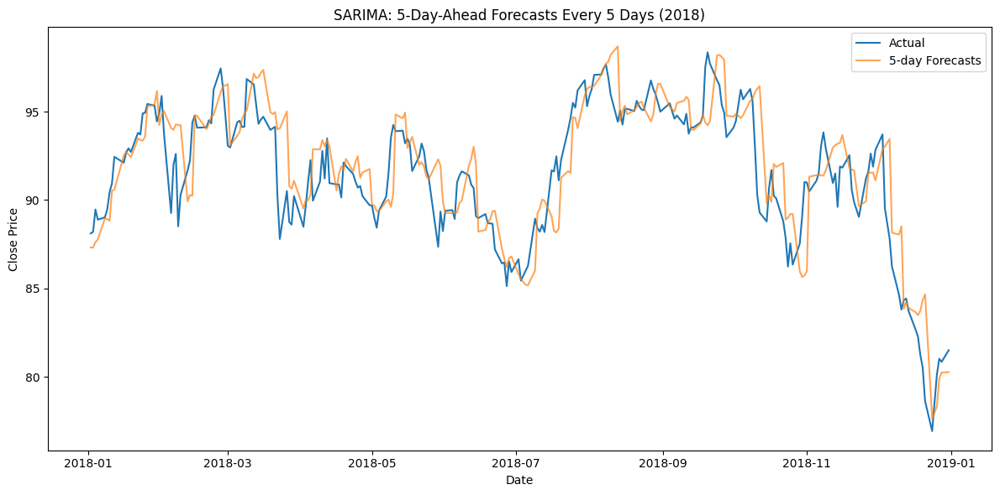

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (2, 1, 3)
best_seasonal_order = (1, 1, 1, 22)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2018-01-01", "2018-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2018"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("SARIMA: 5-Day-Ahead Forecasts Every 5 Days (2018)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

# NVDA:

100%|██████████| 73/73 [06:02<00:00,  4.97s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 0.8913
  MAE:  0.6271
  MAPE: 0.0313
  R2:   0.9768


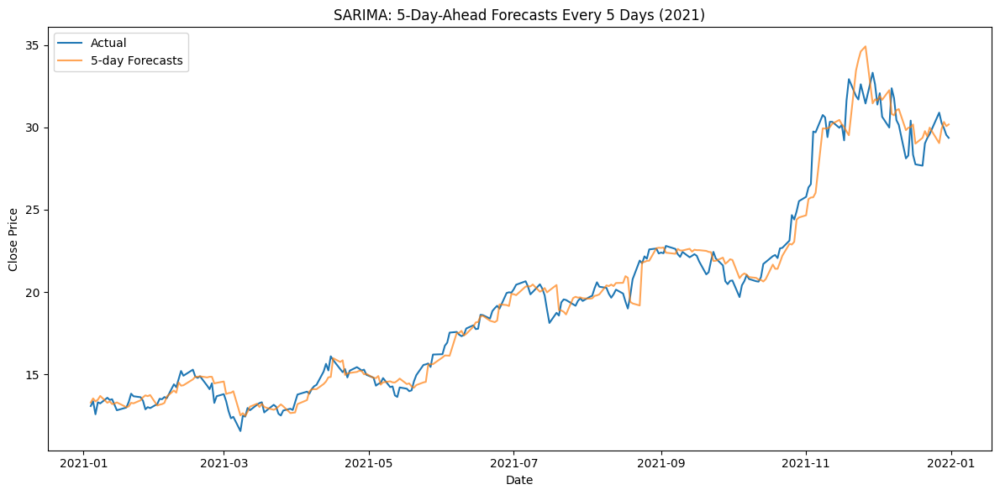

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (2, 1, 2)
best_seasonal_order = (1, 1, 1, 22)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2021-01-01", "2021-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("SARIMA: 5-Day-Ahead Forecasts Every 5 Days (2021)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 74/74 [01:06<00:00,  1.11it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 5.1625
  MAE:  3.9100
  MAPE: 0.0366
  R2:   0.9633


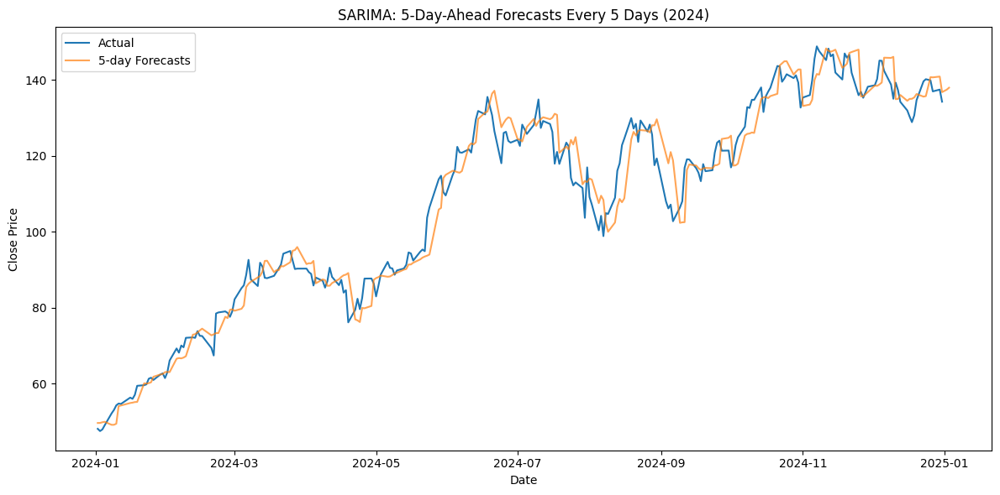

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (2, 1, 3)
best_seasonal_order = (1, 1, 1, 5)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2024-01-01", "2024-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2024"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("SARIMA: 5-Day-Ahead Forecasts Every 5 Days (2024)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 73/73 [05:48<00:00,  4.77s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 0.2481
  MAE:  0.1801
  MAPE: 0.0330
  R2:   0.9242


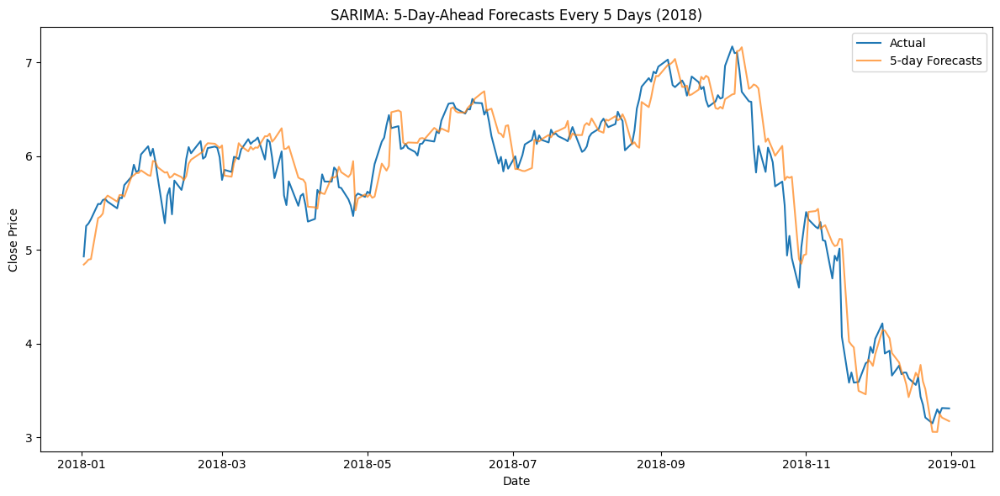

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (1, 1, 1)
best_seasonal_order = (1, 1, 1, 22)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2018-01-01", "2018-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2018"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("SARIMA: 5-Day-Ahead Forecasts Every 5 Days (2018)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

# SPY:

100%|██████████| 73/73 [04:59<00:00,  4.10s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 5.5967
  MAE:  4.1356
  MAPE: 0.0104
  R2:   0.9616


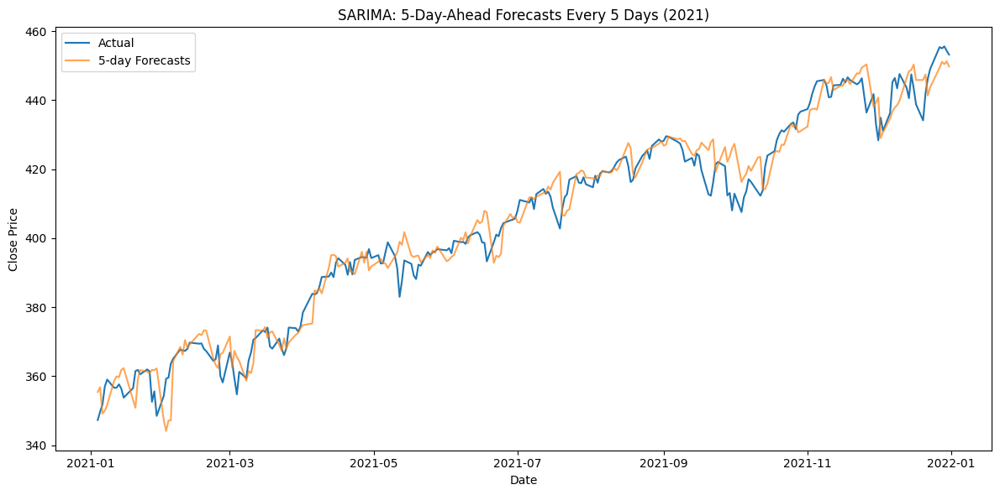

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (1, 1, 3)
best_seasonal_order = (1, 1, 1, 22)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2021-01-01", "2021-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("SARIMA: 5-Day-Ahead Forecasts Every 5 Days (2021)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 74/74 [01:54<00:00,  1.55s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 7.0512
  MAE:  5.1734
  MAPE: 0.0097
  R2:   0.9660


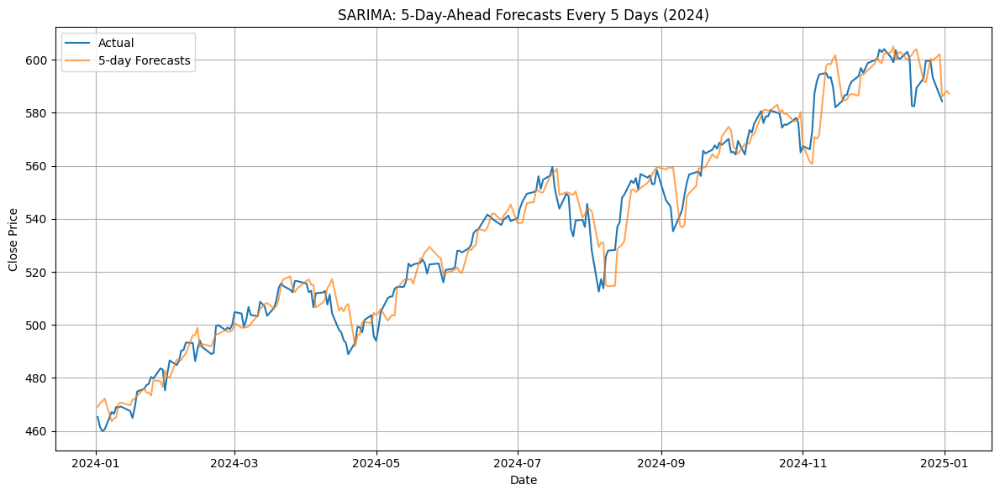

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (0, 1, 2)
best_seasonal_order = (1, 1, 1, 22)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2024-01-01", "2024-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2024"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("SARIMA: 5-Day-Ahead Forecasts Every 5 Days (2024)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

100%|██████████| 73/73 [07:37<00:00,  6.27s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 4.1743
  MAE:  2.9637
  MAPE: 0.0122
  R2:   0.7894


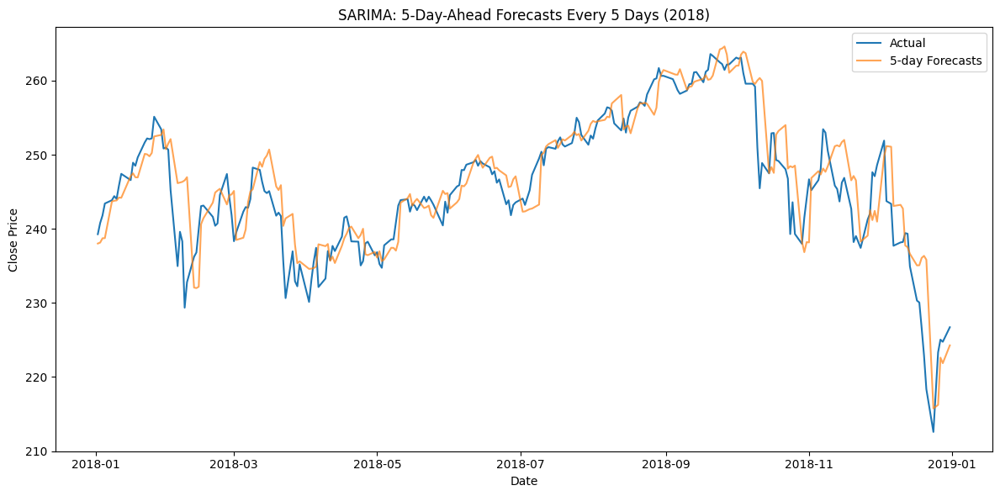

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (1, 1, 4)
best_seasonal_order = (1, 1, 1, 22)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2018-01-01", "2018-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2018"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("SARIMA: 5-Day-Ahead Forecasts Every 5 Days (2018)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

# Weekly ETS:

# AAPL:

100%|██████████| 51/51 [00:35<00:00,  1.44it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 3.3313
  MAE:  2.6108
  MAPE: 0.0190
  R2:   0.9413


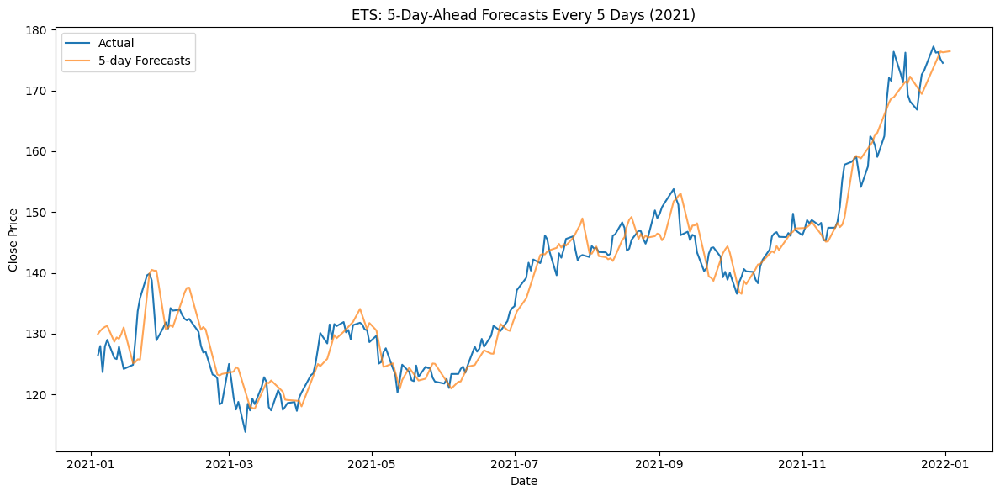

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 750

forecast_dates = series.loc["2021-01-01":"2021-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='add',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists and filter out empty lists
forecast_flat = [item for sublist in all_results if sublist for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2021)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 51/51 [00:15<00:00,  3.33it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 4.9897
  MAE:  3.5748
  MAPE: 0.0173
  R2:   0.9611


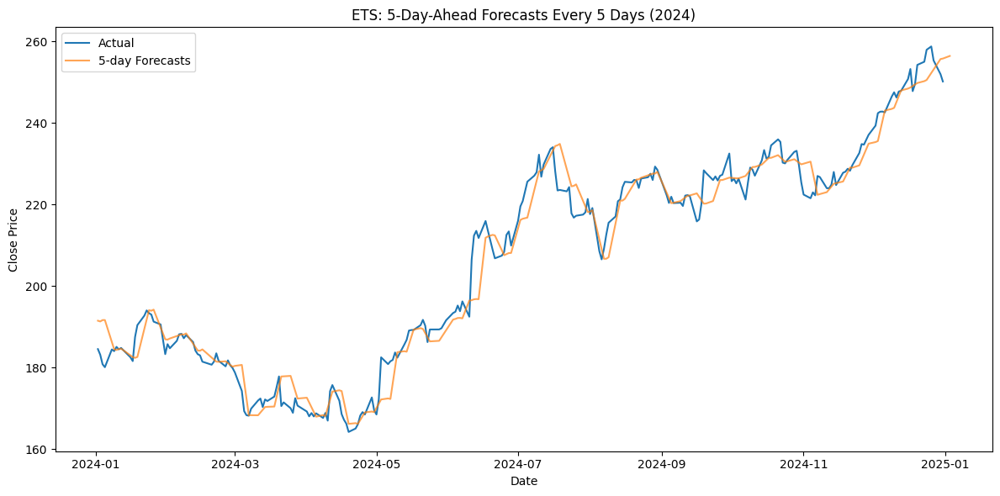

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 750

forecast_dates = series.loc["2024-01-01":"2024-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='mul',
                                     seasonal_periods=5, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list


# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2024"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2024)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 51/51 [01:21<00:00,  1.59s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 1.1514
  MAE:  0.8446
  MAPE: 0.0191
  R2:   0.9467


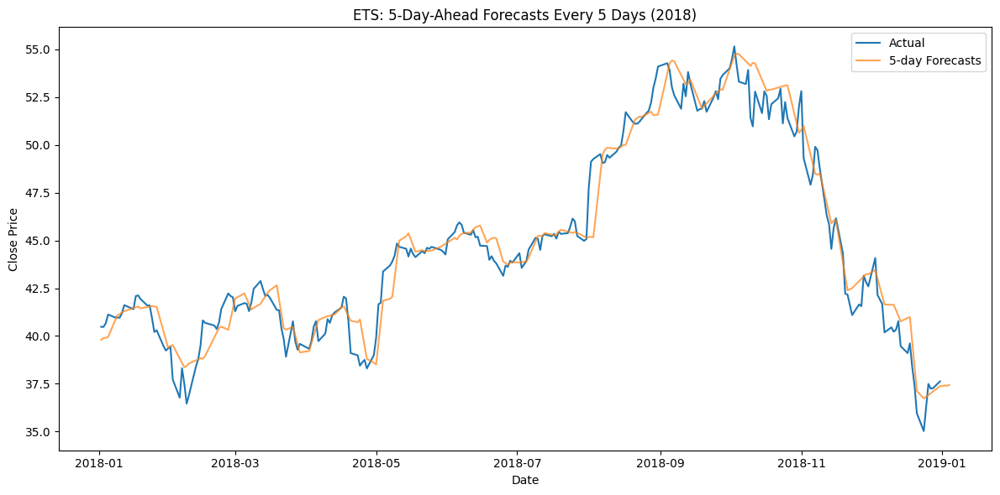

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 750

forecast_dates = series.loc["2018-01-01":"2018-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='mul', seasonal='add',
                                     seasonal_periods=22, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list


# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2018"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2018)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

# JPM:

100%|██████████| 51/51 [00:28<00:00,  1.78it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 3.5701
  MAE:  2.8097
  MAPE: 0.0201
  R2:   0.8696


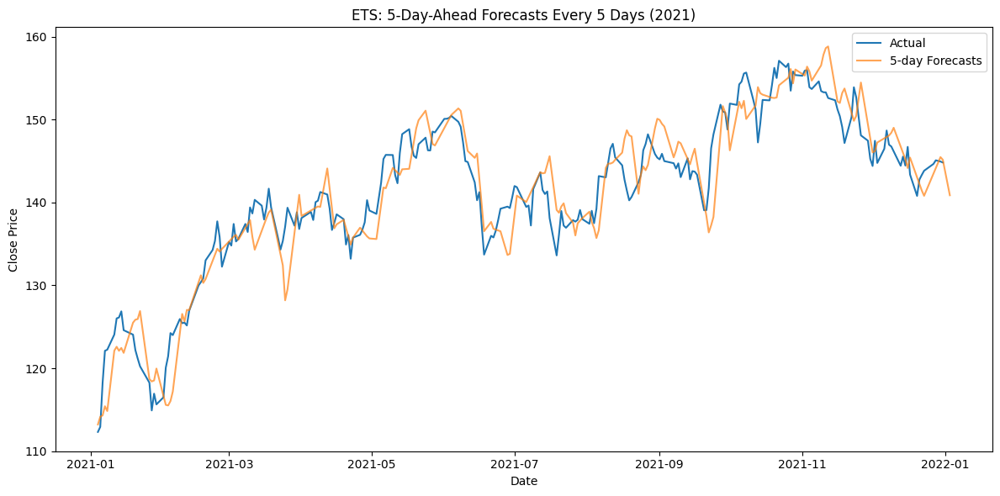

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 750

forecast_dates = series.loc["2021-01-01":"2021-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='mul',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list


# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2021)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 51/51 [02:32<00:00,  2.99s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 4.4799
  MAE:  3.2556
  MAPE: 0.0162
  R2:   0.9608


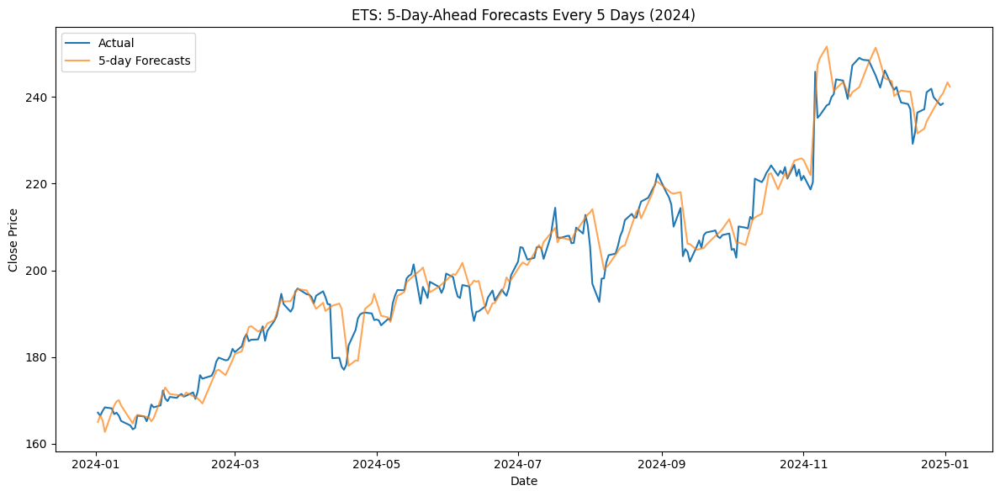

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 750

forecast_dates = series.loc["2024-01-01":"2024-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='mul', seasonal='mul',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list


# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2024"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2024)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 51/51 [00:56<00:00,  1.11s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 1.8159
  MAE:  1.3760
  MAPE: 0.0152
  R2:   0.7901


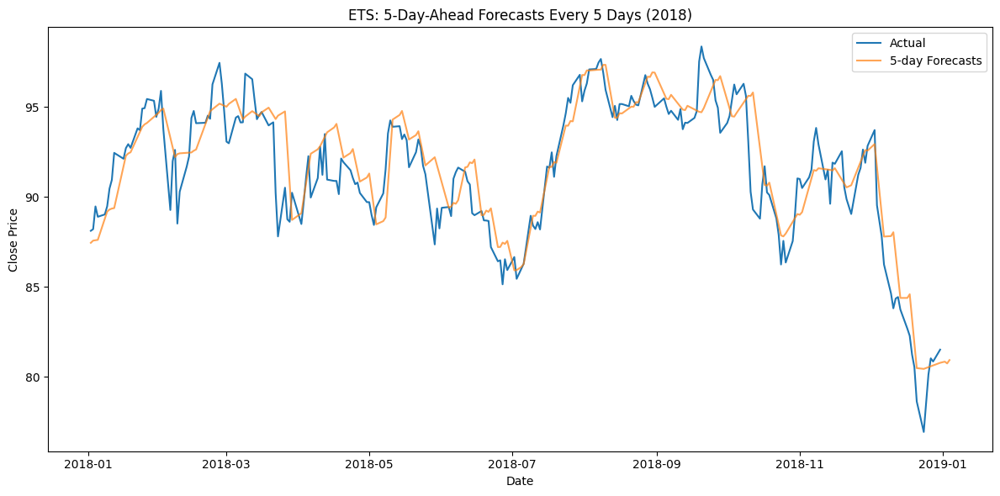

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 750

forecast_dates = series.loc["2018-01-01":"2018-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='mul', seasonal='mul',
                                     seasonal_periods=5, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list


# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2018"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2018)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

# NVDA:

100%|██████████| 51/51 [00:51<00:00,  1.00s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 0.8712
  MAE:  0.6411
  MAPE: 0.0320
  R2:   0.9764


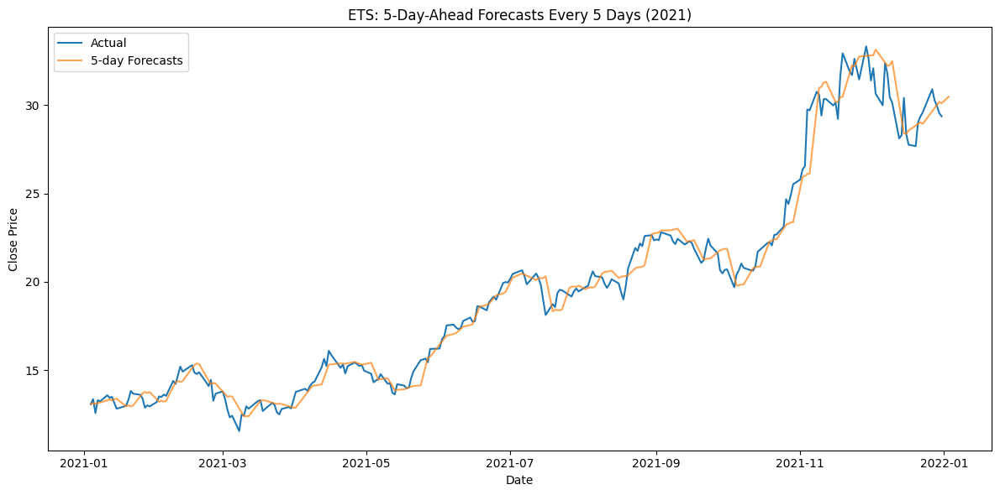

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 750

forecast_dates = series.loc["2021-01-01":"2021-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='mul', seasonal='mul',
                                     seasonal_periods=5, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2021)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 51/51 [00:34<00:00,  1.47it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 5.1424
  MAE:  4.0416
  MAPE: 0.0376
  R2:   0.9649


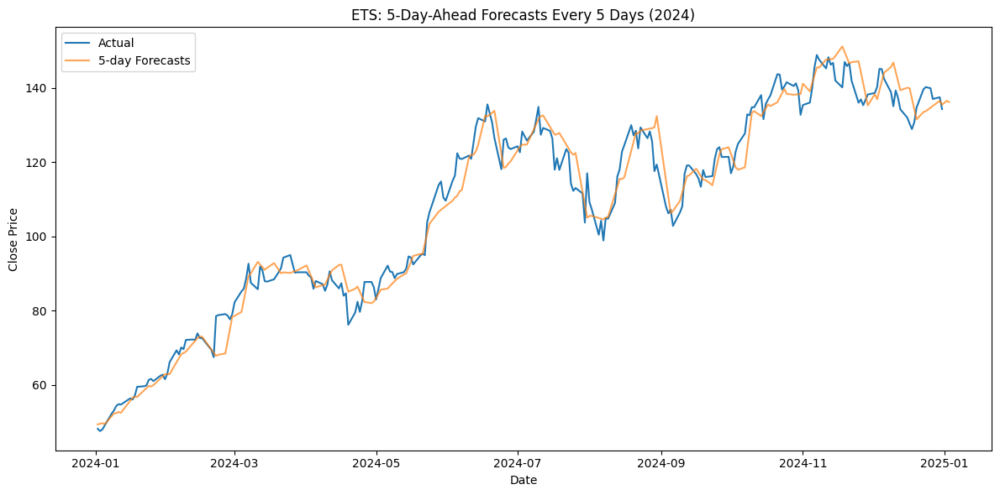

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 750

forecast_dates = series.loc["2024-01-01":"2024-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='add',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2024"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2024)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 51/51 [00:08<00:00,  5.85it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 0.2243
  MAE:  0.1610
  MAPE: 0.0288
  R2:   0.9361


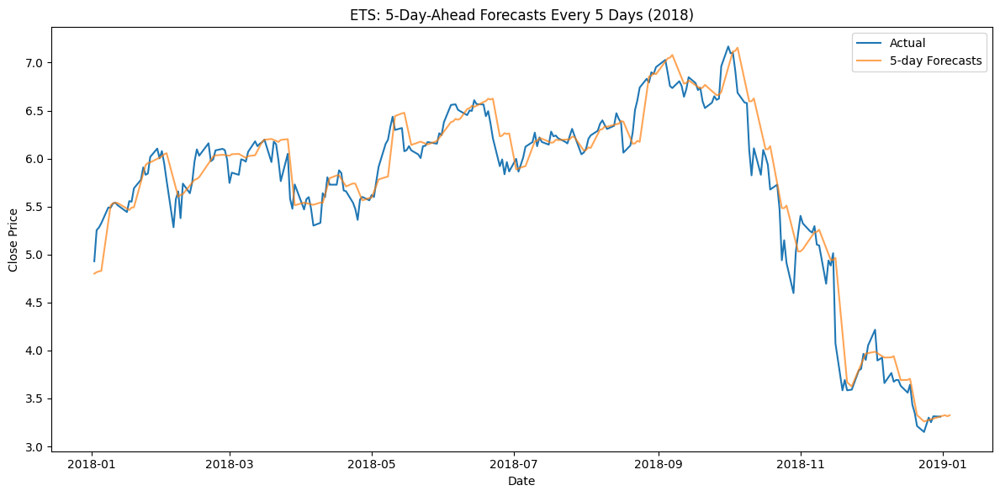

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 750

forecast_dates = series.loc["2018-01-01":"2018-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='mul',
                                     seasonal_periods=5, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2018"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2018)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

# SPY:

100%|██████████| 51/51 [00:31<00:00,  1.62it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 5.4399
  MAE:  4.1988
  MAPE: 0.0105
  R2:   0.9648


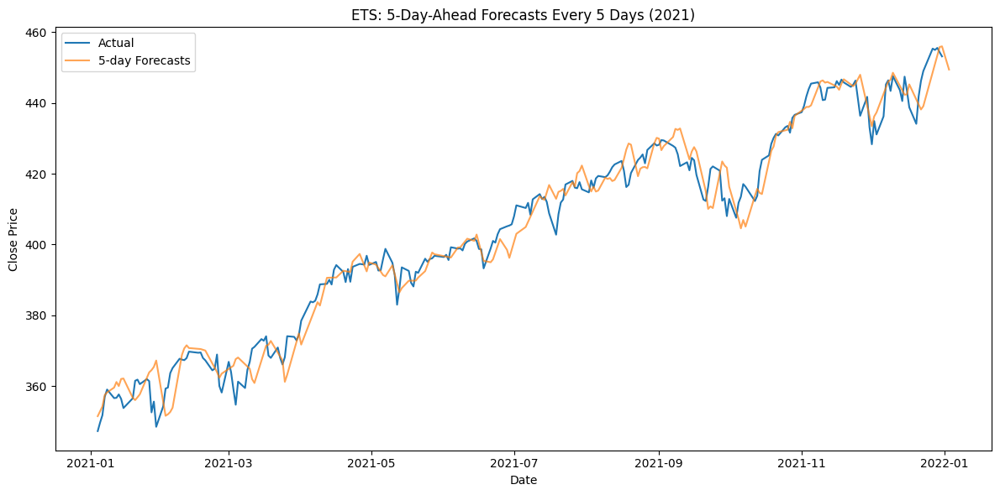

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 750

forecast_dates = series.loc["2021-01-01":"2021-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='mul',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2021)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 51/51 [00:30<00:00,  1.65it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 6.2855
  MAE:  5.0126
  MAPE: 0.0094
  R2:   0.9733


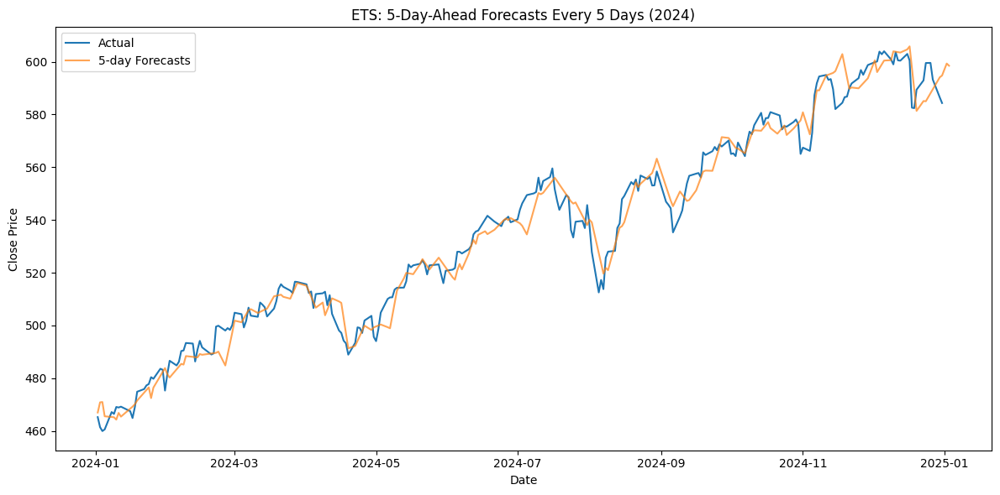

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 750

forecast_dates = series.loc["2024-01-01":"2024-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='mul',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2024"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2024)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 51/51 [01:03<00:00,  1.25s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 3.7922
  MAE:  2.7306
  MAPE: 0.0113
  R2:   0.8301


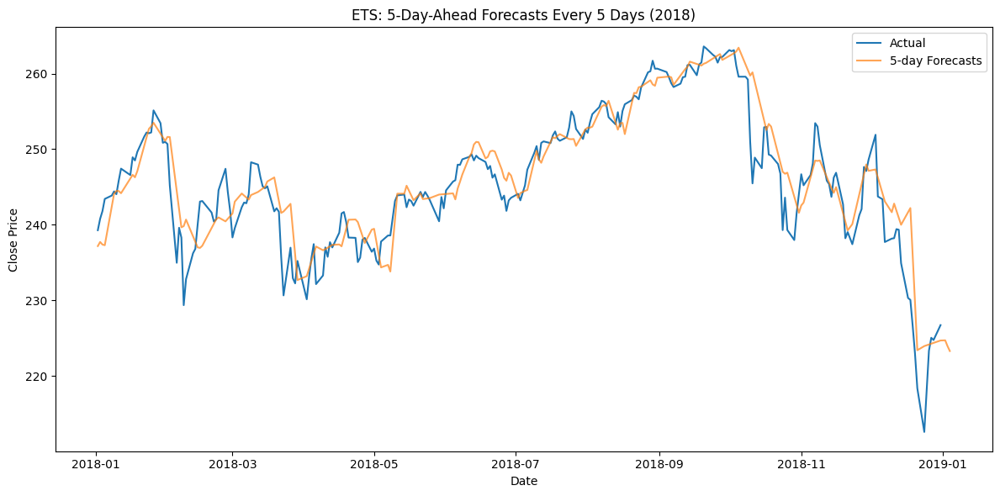

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 750

forecast_dates = series.loc["2018-01-01":"2018-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='mul', seasonal='add',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2018"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2018)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

# Daily ETS:

# AAPL:

100%|██████████| 252/252 [03:23<00:00,  1.24it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 2.3866
  MAE:  1.8524
  MAPE: 0.0135
  R2:   0.9731


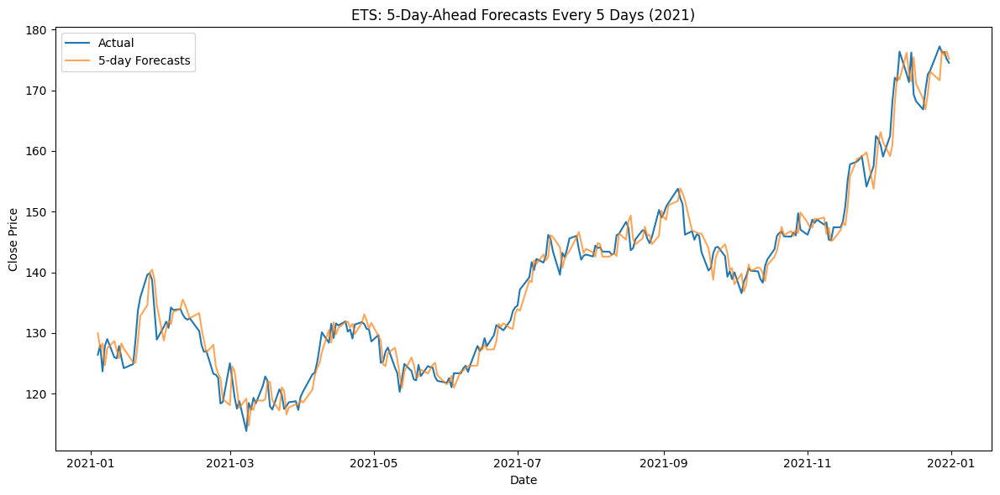

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 1
step_size = 1
train_window_days = 750

forecast_dates = series.loc["2021-01-01":"2021-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='add',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists and filter out empty lists
forecast_flat = [item for sublist in all_results if sublist for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2021)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 252/252 [00:35<00:00,  7.07it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 2.9119
  MAE:  2.1293
  MAPE: 0.0104
  R2:   0.9871


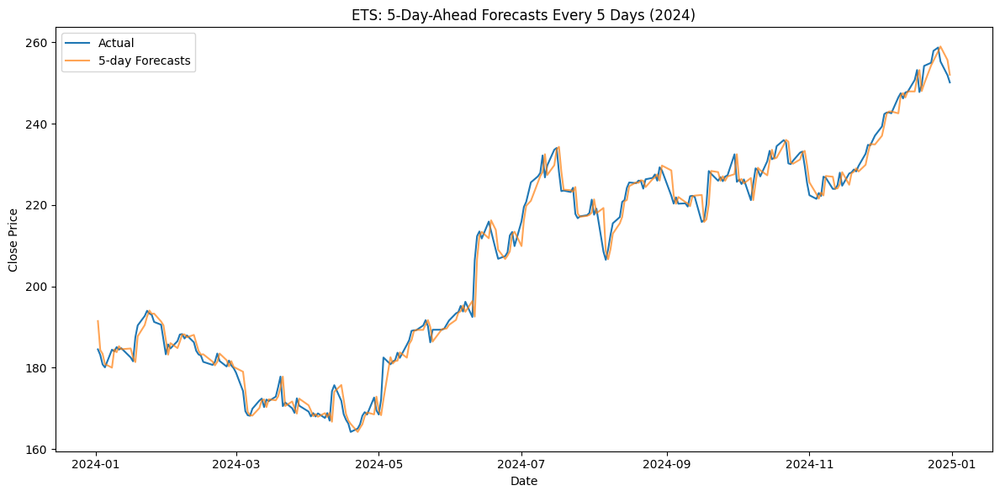

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 1
step_size = 1
train_window_days = 750

forecast_dates = series.loc["2024-01-01":"2024-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='mul',
                                     seasonal_periods=5, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list


# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2024"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2024)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 251/251 [03:47<00:00,  1.10it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 0.8140
  MAE:  0.5848
  MAPE: 0.0132
  R2:   0.9732


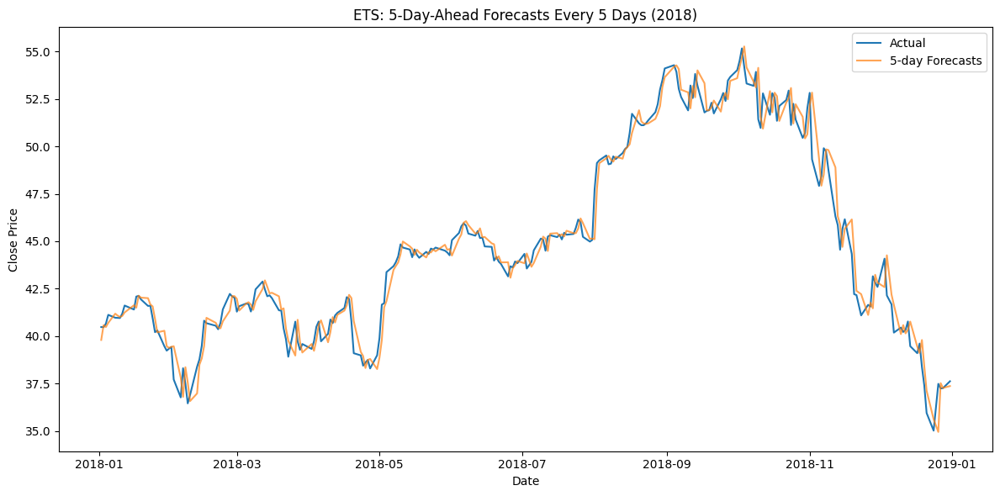

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 1
step_size = 1
train_window_days = 750

forecast_dates = series.loc["2018-01-01":"2018-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='mul', seasonal='add',
                                     seasonal_periods=22, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list


# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2018"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2018)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

# JPM:

100%|██████████| 252/252 [01:46<00:00,  2.37it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 2.3179
  MAE:  1.8808
  MAPE: 0.0134
  R2:   0.9381


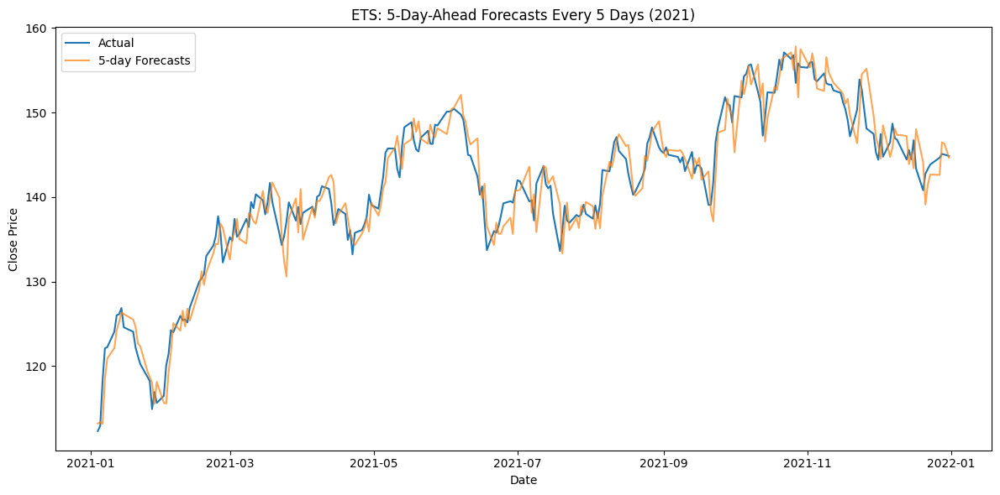

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 1
step_size = 1
train_window_days = 750

forecast_dates = series.loc["2021-01-01":"2021-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='mul',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list


# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2021)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 252/252 [06:43<00:00,  1.60s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 3.2860
  MAE:  2.1920
  MAPE: 0.0107
  R2:   0.9781


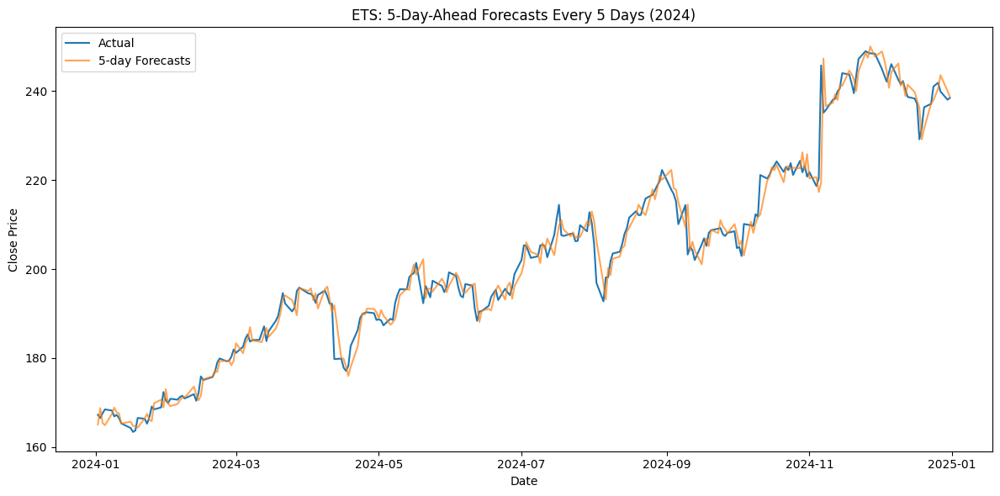

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 1
step_size = 1
train_window_days = 750

forecast_dates = series.loc["2024-01-01":"2024-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='mul', seasonal='mul',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list


# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2024"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2024)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 251/251 [02:25<00:00,  1.73it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 1.2662
  MAE:  0.9565
  MAPE: 0.0105
  R2:   0.8913


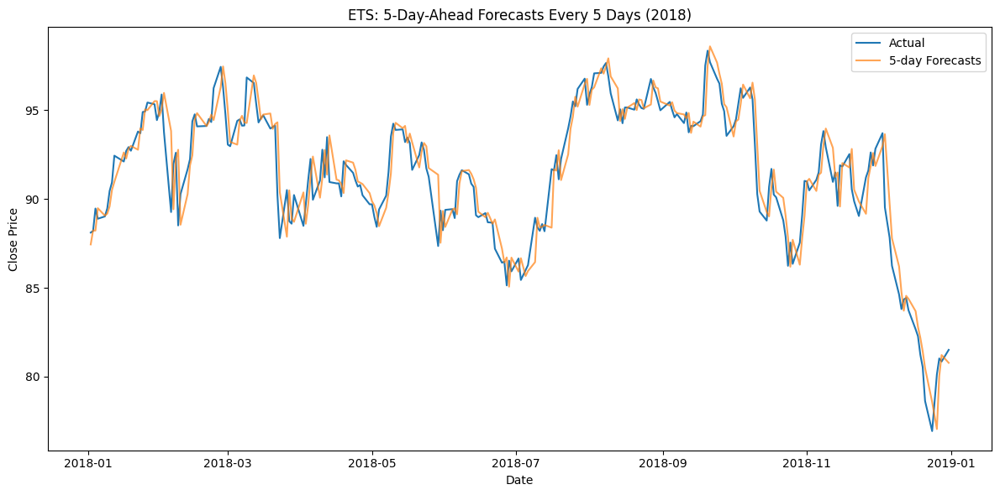

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 1
step_size = 1
train_window_days = 750

forecast_dates = series.loc["2018-01-01":"2018-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='mul', seasonal='mul',
                                     seasonal_periods=5, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list


# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2018"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2018)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

# NVDA:

100%|██████████| 252/252 [02:50<00:00,  1.48it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 0.6350
  MAE:  0.4399
  MAPE: 0.0218
  R2:   0.9882


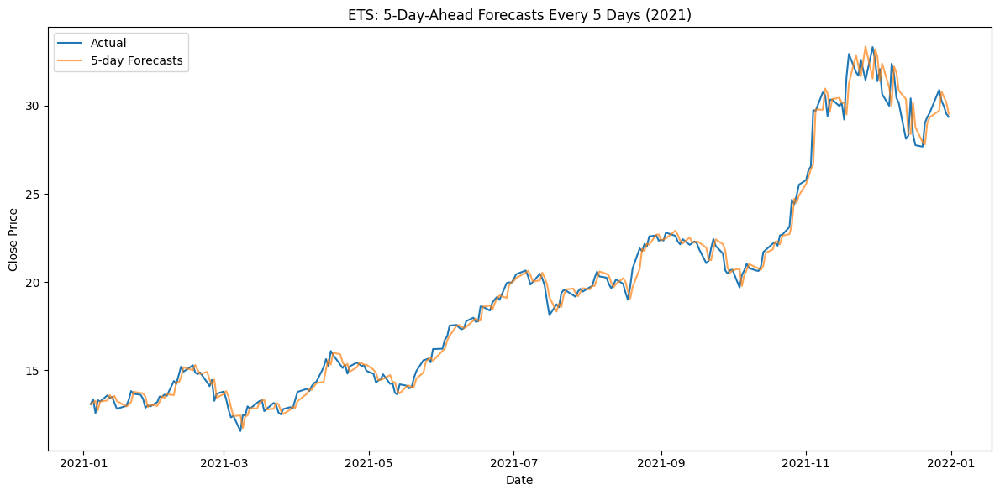

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 1
step_size = 1
train_window_days = 750

forecast_dates = series.loc["2021-01-01":"2021-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='mul', seasonal='mul',
                                     seasonal_periods=5, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2021)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 252/252 [02:11<00:00,  1.92it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 3.5341
  MAE:  2.6821
  MAPE: 0.0251
  R2:   0.9827


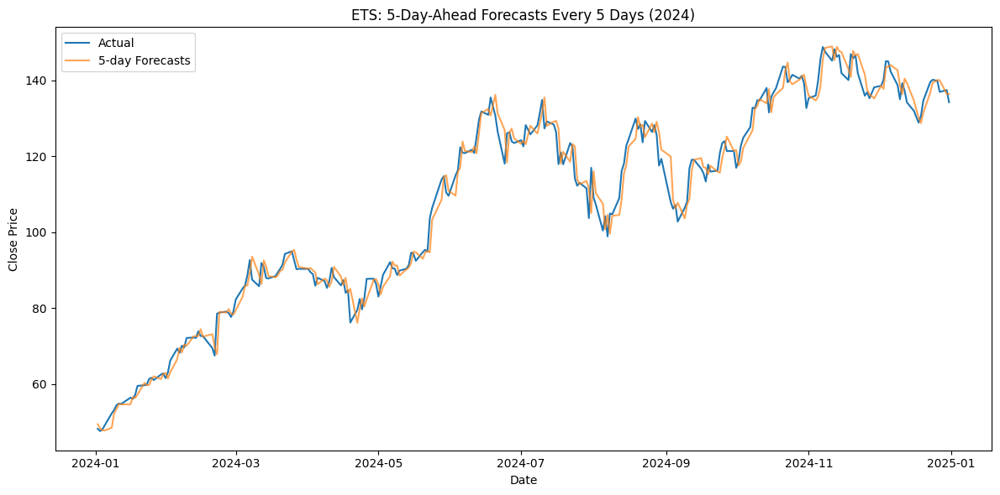

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 1
step_size = 1
train_window_days = 750

forecast_dates = series.loc["2024-01-01":"2024-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='add',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2024"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2024)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 251/251 [00:32<00:00,  7.74it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 0.1658
  MAE:  0.1193
  MAPE: 0.0220
  R2:   0.9661


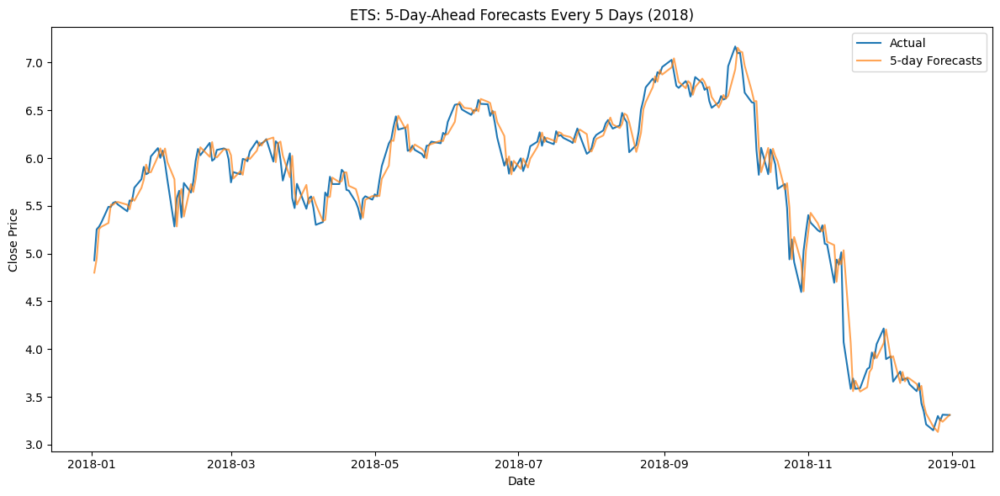

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 1
step_size = 1
train_window_days = 750

forecast_dates = series.loc["2018-01-01":"2018-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='mul',
                                     seasonal_periods=5, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2018"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2018)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

# SPY:

100%|██████████| 252/252 [01:54<00:00,  2.20it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 3.9941
  MAE:  3.1043
  MAPE: 0.0077
  R2:   0.9804


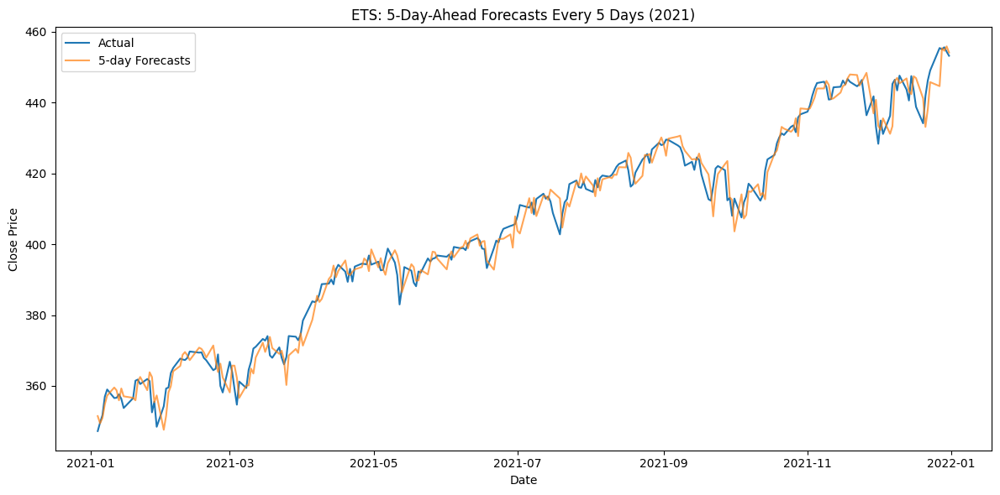

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 1
step_size = 1
train_window_days = 750

forecast_dates = series.loc["2021-01-01":"2021-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='mul',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2021)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 252/252 [02:11<00:00,  1.92it/s]



Sliding 5-Day Forecast Metrics:
  RMSE: 4.5404
  MAE:  3.4972
  MAPE: 0.0066
  R2:   0.9858


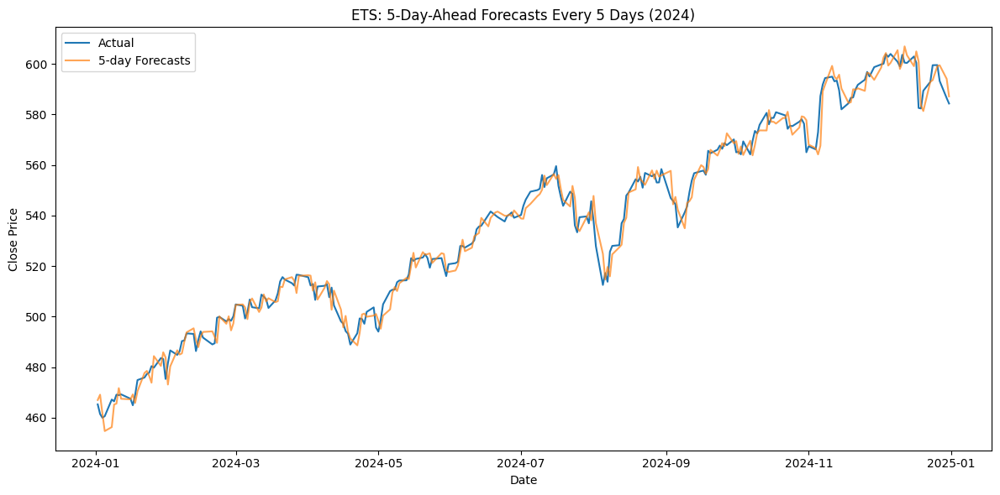

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 1
step_size = 1
train_window_days = 750

forecast_dates = series.loc["2024-01-01":"2024-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='add', seasonal='mul',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2024"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2024)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

100%|██████████| 251/251 [05:33<00:00,  1.33s/it]



Sliding 5-Day Forecast Metrics:
  RMSE: 2.6669
  MAE:  1.8772
  MAPE: 0.0078
  R2:   0.9135


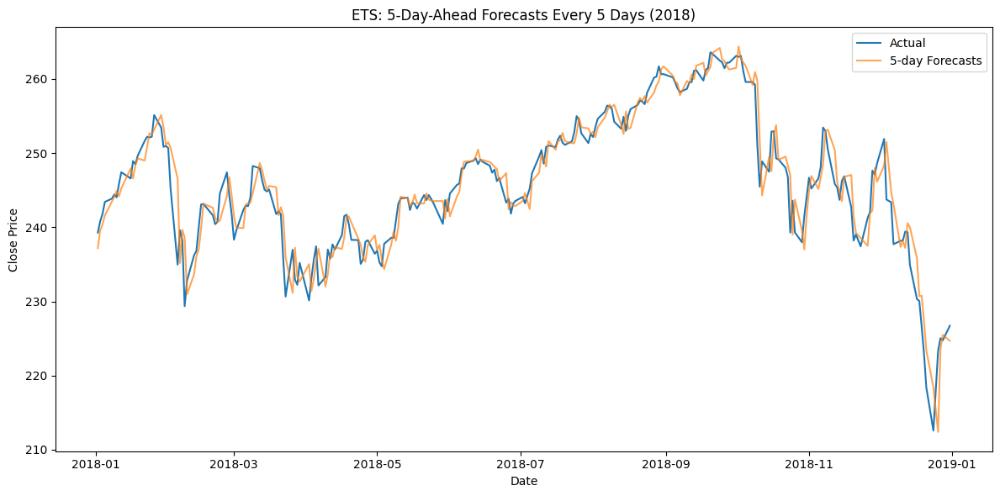

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 1
step_size = 1
train_window_days = 750

forecast_dates = series.loc["2018-01-01":"2018-12-31"].index[::step_size]

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = ExponentialSmoothing(train_data, trend='mul', seasonal='add',
                                     seasonal_periods=66, damped_trend=False)
        results = model.fit()
        forecast = results.forecast(steps=forecast_horizon)
    except Exception as e:
        print(f"Error forecasting for date {forecast_start}: {e}")
        return []

    results_list = []
    forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
    for offset, pred_date in enumerate(forecast_dates_range):
        if pred_date in series.index and offset < len(forecast):
             results_list.append({
                "Date": pred_date,
                "Actual": series[pred_date],
                "Predicted": forecast.iloc[offset]
            })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df = pd.DataFrame(forecast_flat).dropna()
forecast_df.set_index("Date", inplace=True)

rmse = np.sqrt(mean_squared_error(forecast_df["Actual"], forecast_df["Predicted"]))
mae = mean_absolute_error(forecast_df["Actual"], forecast_df["Predicted"])
mape = mean_absolute_percentage_error(forecast_df["Actual"], forecast_df["Predicted"])
r2 = r2_score(forecast_df["Actual"], forecast_df["Predicted"])

print("\nSliding 5-Day Forecast Metrics:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE:  {mae:.4f}")
print(f"  MAPE: {mape:.4f}")
print(f"  R2:   {r2:.4f}")

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2018"], label="Actual")
plt.plot(forecast_df.index, forecast_df["Predicted"], label="5-day Forecasts", alpha=0.7)
plt.title("ETS: 5-Day-Ahead Forecasts Every 5 Days (2018)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.tight_layout()
plt.show()

# Plot of all 3 together

# Year:

In [ ]:
!pip install orbit-ml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 446.9/446.9 kB 6.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 28.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 29.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 23.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 24.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.8 MB/

2025-08-14 14:48:02 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

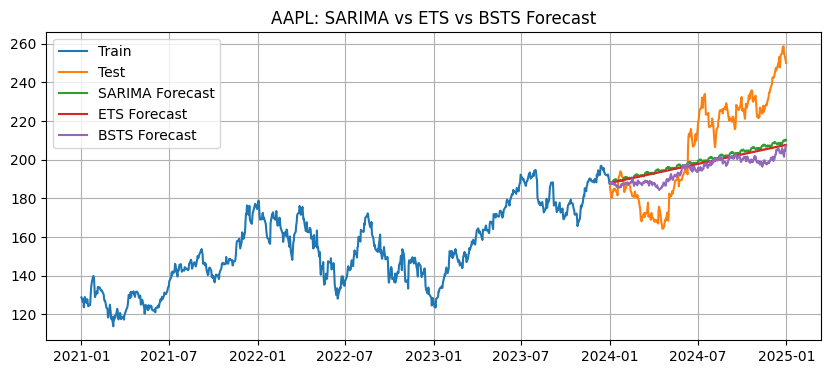

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")
# Read CSV skipping the first two metadata rows
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2021-01-01':'2023-12-31']['Close']
test = df.loc['2024-01-01':'2024-12-31']['Close']

model = SARIMAX(train, order=(2,1,3), seasonal_order=(0,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
sarima_forecast = forecast_result.predicted_mean

model = ExponentialSmoothing(train, trend='add', seasonal='mul', seasonal_periods=5, damped_trend=False)
results = model.fit()
ets_forecast = results.forecast(steps=len(test))

def bsts_forecast():
  from orbit.models import DLT
  from orbit.diagnostics.metrics import smape, mape
  from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
  import pandas as pd
  import numpy as np
  import matplotlib.pyplot as plt
  import gc

  # -------------------------------
  # Load and preprocess data
  # -------------------------------
  df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
  df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
  df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
  df = df[['Date', 'Close']]
  df.columns = ['ds', 'y']
  df = df.set_index('ds').asfreq('D')
  df['y'] = df['y'].interpolate(method='time')
  df = df.reset_index()

  # -------------------------------
  # Define backtesting folds
  # -------------------------------
  train_start = '2021-01-01'
  train_end = '2023-12-31'
  test_start = '2024-01-01'
  test_end = '2024-12-31'

  seasonality = 5

  train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
  test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

  model = DLT(
      response_col='y',
      date_col='ds',
      seasonality=seasonality,
      seed=2023,
      estimator='stan-mcmc',
      )
  model.fit(train_df)

      # Forecast
  forecast_df = model.predict(df=test_df)
  y_true = test_df['y'].values
  y_pred = forecast_df['prediction'].values

  forecast_df = forecast_df[['prediction']]
  #forecast_df.index = forecast_df['ds']
  #forecast_df.drop(columns=['ds'], inplace=True)

  return forecast_df

bsts_prediction = bsts_forecast()

plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, sarima_forecast, label='SARIMA Forecast')
plt.plot(test.index, ets_forecast, label='ETS Forecast')
plt.plot(test.index, bsts_prediction, label='BSTS Forecast')
plt.legend()
plt.grid(True)
plt.title('AAPL: SARIMA vs ETS vs BSTS Forecast')
plt.show()


2025-08-14 15:10:28 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

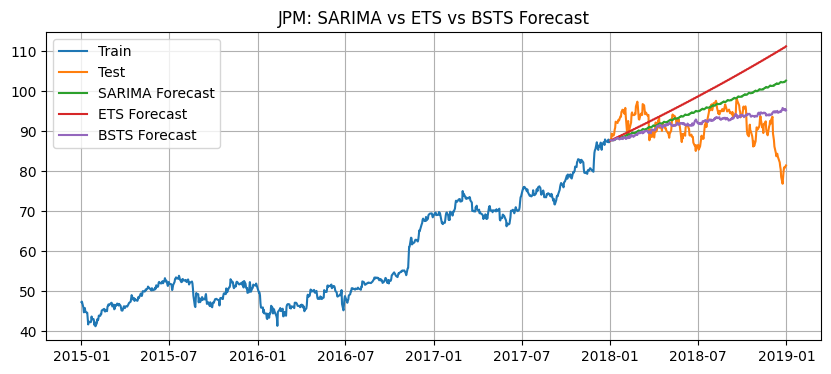

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")
# Read CSV skipping the first two metadata rows
df = pd.read_csv('JPM.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2015-01-01':'2017-12-31']['Close']
test = df.loc['2018-01-01':'2018-12-31']['Close']

model = SARIMAX(train, order=(2,1,3), seasonal_order=(1,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
sarima_forecast = forecast_result.predicted_mean

model = ExponentialSmoothing(train, trend='mul', seasonal='mul', seasonal_periods=5, damped_trend=False)
results = model.fit()
ets_forecast = results.forecast(steps=len(test))

def bsts_forecast():
  from orbit.models import DLT
  from orbit.diagnostics.metrics import smape, mape
  from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
  import pandas as pd
  import numpy as np
  import matplotlib.pyplot as plt
  import gc

  # -------------------------------
  # Load and preprocess data
  # -------------------------------
  df = pd.read_csv('JPM.csv', skiprows=3, header=None)
  df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
  df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
  df = df[['Date', 'Close']]
  df.columns = ['ds', 'y']
  df = df.set_index('ds').asfreq('D')
  df['y'] = df['y'].interpolate(method='time')
  df = df.reset_index()

  # -------------------------------
  # Define backtesting folds
  # -------------------------------
  train_start = '2015-01-01'
  train_end = '2017-12-31'
  test_start = '2018-01-01'
  test_end = '2018-12-31'

  seasonality = 22

  train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
  test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

  model = DLT(
      response_col='y',
      date_col='ds',
      seasonality=seasonality,
      seed=2023,
      estimator='stan-mcmc',
      )
  model.fit(train_df)

      # Forecast
  forecast_df = model.predict(df=test_df)
  y_true = test_df['y'].values
  y_pred = forecast_df['prediction'].values

  forecast_df = forecast_df[['prediction']]
  #forecast_df.index = forecast_df['ds']
  #forecast_df.drop(columns=['ds'], inplace=True)

  return forecast_df

bsts_prediction = bsts_forecast()

plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, sarima_forecast, label='SARIMA Forecast')
plt.plot(test.index, ets_forecast, label='ETS Forecast')
plt.plot(test.index, bsts_prediction, label='BSTS Forecast')
plt.legend()
plt.grid(True)
plt.title('JPM: SARIMA vs ETS vs BSTS Forecast')
plt.show()


2025-08-14 15:26:10 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

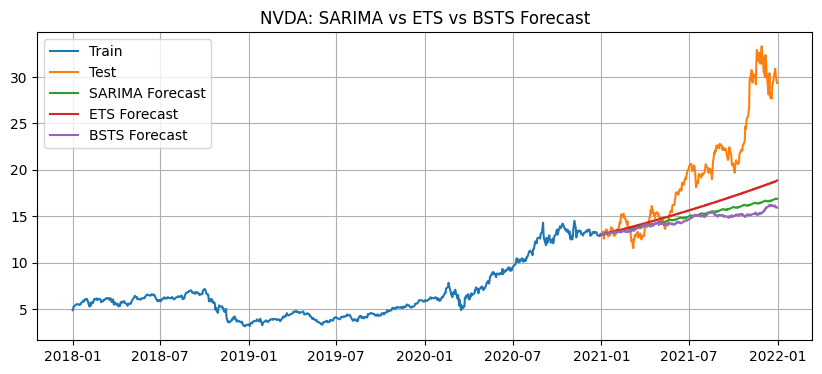

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")
# Read CSV skipping the first two metadata rows
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2018-01-01':'2020-12-31']['Close']
test = df.loc['2021-01-01':'2021-12-31']['Close']

model = SARIMAX(train, order=(2,1,2), seasonal_order=(1,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
sarima_forecast = forecast_result.predicted_mean

model = ExponentialSmoothing(train, trend='mul', seasonal='mul', seasonal_periods=5, damped_trend=False)
results = model.fit()
ets_forecast = results.forecast(steps=len(test))

def bsts_forecast():
  from orbit.models import DLT
  from orbit.diagnostics.metrics import smape, mape
  from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
  import pandas as pd
  import numpy as np
  import matplotlib.pyplot as plt
  import gc

  # -------------------------------
  # Load and preprocess data
  # -------------------------------
  df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
  df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
  df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
  df = df[['Date', 'Close']]
  df.columns = ['ds', 'y']
  df = df.set_index('ds').asfreq('D')
  df['y'] = df['y'].interpolate(method='time')
  df = df.reset_index()

  # -------------------------------
  # Define backtesting folds
  # -------------------------------
  train_start = '2018-01-01'
  train_end = '2020-12-31'
  test_start = '2021-01-01'
  test_end = '2021-12-31'

  seasonality = 22

  train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
  test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

  model = DLT(
      response_col='y',
      date_col='ds',
      seasonality=seasonality,
      seed=2023,
      estimator='stan-mcmc',
      )
  model.fit(train_df)

      # Forecast
  forecast_df = model.predict(df=test_df)
  y_true = test_df['y'].values
  y_pred = forecast_df['prediction'].values

  forecast_df = forecast_df[['prediction']]
  #forecast_df.index = forecast_df['ds']
  #forecast_df.drop(columns=['ds'], inplace=True)

  return forecast_df

bsts_prediction = bsts_forecast()

plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, sarima_forecast, label='SARIMA Forecast')
plt.plot(test.index, ets_forecast, label='ETS Forecast')
plt.plot(test.index, bsts_prediction, label='BSTS Forecast')
plt.legend()
plt.grid(True)
plt.title('NVDA: SARIMA vs ETS vs BSTS Forecast')
plt.show()


# Weekly:

100%|██████████| 51/51 [00:39<00:00,  1.29it/s]


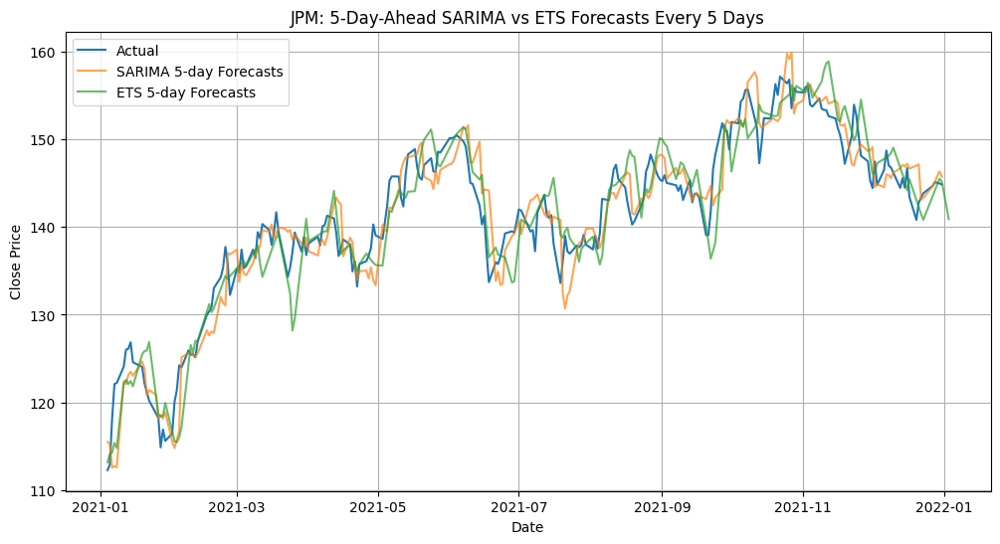

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (2, 1, 2)
best_seasonal_order = (0, 1, 1, 22)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2021-01-01", "2021-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df_sarima = pd.DataFrame(forecast_flat).dropna()
forecast_df_sarima.set_index("Date", inplace=True)

def ets_forecast():
  # -------------------------------
  # Load and preprocess data
  # -------------------------------
  df = pd.read_csv('JPM.csv', skiprows=3, header=None)
  df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
  df['Date'] = pd.to_datetime(df['Date'])
  df.set_index('Date', inplace=True)
  series = df['Close']

  # -------------------------------
  # Forecast settings
  # -------------------------------
  forecast_horizon = 5
  step_size = 5
  train_window_days = 750

  forecast_dates = series.loc["2021-01-01":"2021-12-31"].index[::step_size]

  # -------------------------------
  # Forecasting function
  # -------------------------------
  def forecast_next_5_days(forecast_start):
      train_end = forecast_start - pd.Timedelta(days=1)
      train_start = train_end - pd.Timedelta(days=train_window_days - 1)

      if train_start < series.index[0]:
          return []

      train_data = series[train_start:train_end]

      try:
          model = ExponentialSmoothing(train_data, trend='add', seasonal='mul',
                                      seasonal_periods=66, damped_trend=False)
          results = model.fit()
          forecast = results.forecast(steps=forecast_horizon)
      except Exception as e:
          print(f"Error forecasting for date {forecast_start}: {e}")
          return []

      results_list = []
      forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
      for offset, pred_date in enumerate(forecast_dates_range):
          if pred_date in series.index and offset < len(forecast):
              results_list.append({
                  "Date": pred_date,
                  "Actual": series[pred_date],
                  "Predicted": forecast.iloc[offset]
              })
      return results_list


  # -------------------------------
  # Run forecasts in parallel
  # -------------------------------
  all_results = Parallel(n_jobs=-1)(
      delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
  )

  # Flatten list of lists
  forecast_flat = [item for sublist in all_results for item in sublist]

  # -------------------------------
  # Evaluation & Plotting
  # -------------------------------
  forecast_df = pd.DataFrame(forecast_flat).dropna()
  forecast_df.set_index("Date", inplace=True)
  return forecast_df

ets_forecast = ets_forecast()

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df_sarima.index, forecast_df_sarima["Predicted"], label="SARIMA 5-day Forecasts", alpha=0.7)
plt.plot(ets_forecast.index, ets_forecast["Predicted"], label="ETS 5-day Forecasts", alpha=0.7)
plt.title("JPM: 5-Day-Ahead SARIMA vs ETS Forecasts Every 5 Days")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

100%|██████████| 51/51 [00:35<00:00,  1.45it/s]


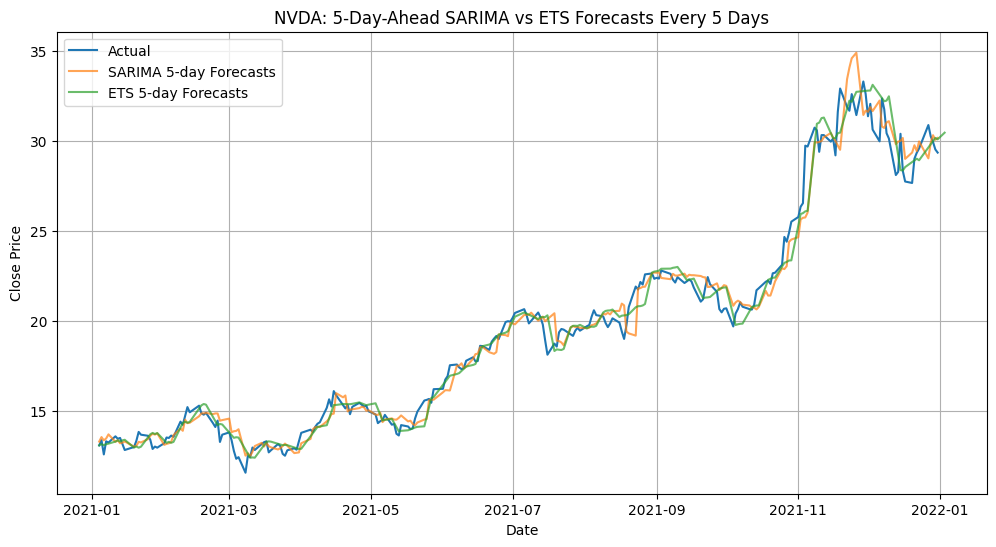

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
series = df['Close']

# -------------------------------
# Hyperparameters
# -------------------------------
best_order = (2, 1, 2)
best_seasonal_order = (1, 1, 1, 22)

# -------------------------------
# Forecast settings
# -------------------------------
forecast_horizon = 5
step_size = 5
train_window_days = 500

forecast_dates = pd.date_range("2021-01-01", "2021-12-31", freq=f"{step_size}D")

# -------------------------------
# Forecasting function
# -------------------------------
def forecast_next_5_days(forecast_start):
    train_end = forecast_start - pd.Timedelta(days=1)
    train_start = train_end - pd.Timedelta(days=train_window_days - 1)

    if train_start < series.index[0]:
        return []

    train_data = series[train_start:train_end]

    try:
        model = SARIMAX(train_data,
                        order=best_order,
                        seasonal_order=best_seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False, method_kwargs={"maxiter": 50})
        forecast = results.get_forecast(steps=forecast_horizon)
        preds = forecast.predicted_mean
    except:
        return []

    results_list = []
    for offset, pred_date in enumerate(pd.date_range(forecast_start, periods=forecast_horizon)):
        if pred_date not in series.index:
            continue
        results_list.append({
            "Date": pred_date,
            "Actual": series[pred_date],
            "Predicted": preds.iloc[offset]
        })
    return results_list

# -------------------------------
# Run forecasts in parallel
# -------------------------------
all_results = Parallel(n_jobs=-1)(
    delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
)

# Flatten list of lists
forecast_flat = [item for sublist in all_results for item in sublist]

# -------------------------------
# Evaluation & Plotting
# -------------------------------
forecast_df_sarima = pd.DataFrame(forecast_flat).dropna()
forecast_df_sarima.set_index("Date", inplace=True)

def ets_forecast():
  # -------------------------------
  # Load and preprocess data
  # -------------------------------
  df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
  df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
  df['Date'] = pd.to_datetime(df['Date'])
  df.set_index('Date', inplace=True)
  series = df['Close']

  # -------------------------------
  # Forecast settings
  # -------------------------------
  forecast_horizon = 5
  step_size = 5
  train_window_days = 750

  forecast_dates = series.loc["2021-01-01":"2021-12-31"].index[::step_size]

  # -------------------------------
  # Forecasting function
  # -------------------------------
  def forecast_next_5_days(forecast_start):
      train_end = forecast_start - pd.Timedelta(days=1)
      train_start = train_end - pd.Timedelta(days=train_window_days - 1)

      if train_start < series.index[0]:
          return []

      train_data = series[train_start:train_end]

      try:
          model = ExponentialSmoothing(train_data, trend='mul', seasonal='mul',
                                      seasonal_periods=5, damped_trend=False)
          results = model.fit()
          forecast = results.forecast(steps=forecast_horizon)
      except Exception as e:
          print(f"Error forecasting for date {forecast_start}: {e}")
          return []

      results_list = []
      forecast_dates_range = pd.date_range(forecast_start, periods=forecast_horizon)
      for offset, pred_date in enumerate(forecast_dates_range):
          if pred_date in series.index and offset < len(forecast):
              results_list.append({
                  "Date": pred_date,
                  "Actual": series[pred_date],
                  "Predicted": forecast.iloc[offset]
              })
      return results_list


  # -------------------------------
  # Run forecasts in parallel
  # -------------------------------
  all_results = Parallel(n_jobs=-1)(
      delayed(forecast_next_5_days)(day) for day in tqdm(forecast_dates)
  )

  # Flatten list of lists
  forecast_flat = [item for sublist in all_results for item in sublist]

  # -------------------------------
  # Evaluation & Plotting
  # -------------------------------
  forecast_df = pd.DataFrame(forecast_flat).dropna()
  forecast_df.set_index("Date", inplace=True)
  return forecast_df

ets_forecast = ets_forecast()

# Plot
plt.figure(figsize=(12, 6))
plt.plot(series["2021"], label="Actual")
plt.plot(forecast_df_sarima.index, forecast_df_sarima["Predicted"], label="SARIMA 5-day Forecasts", alpha=0.7)
plt.plot(ets_forecast.index, ets_forecast["Predicted"], label="ETS 5-day Forecasts", alpha=0.7)
plt.title("NVDA: 5-Day-Ahead SARIMA vs ETS Forecasts Every 5 Days")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31
Best ARIMA order: (0, 1, 0), RMSE: 2.9164
Best Seasonal order: (0, 1, 1, 22), RMSE: 2.5028
Fold 1 Metrics:
  RMSE: 2.5028
  MAE:  2.2557
  MAPE: 0.0843
  R2:   -1.2078


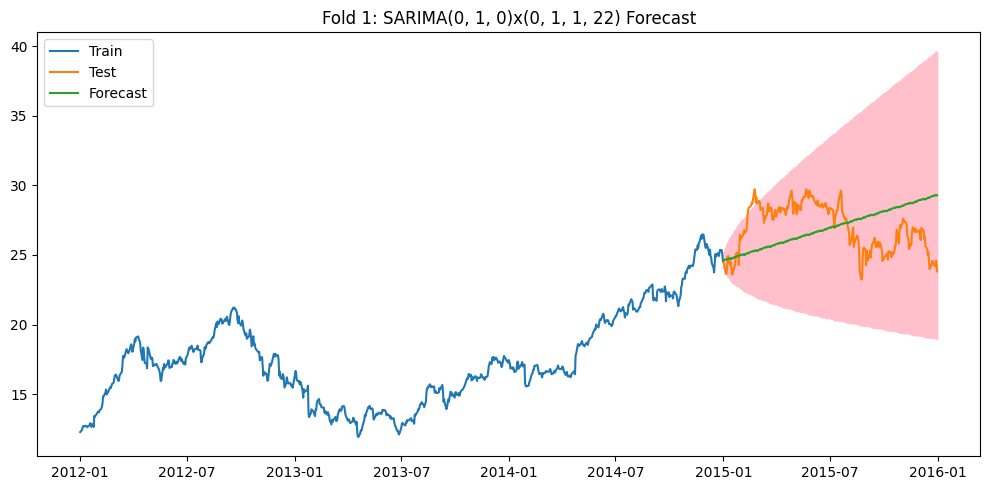


Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31


KeyboardInterrupt: 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from itertools import product
from joblib import Parallel, delayed
import warnings
warnings.filterwarnings('ignore')
import gc

# Load and preprocess data
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2012-01-01', '2014-12-31', '2015-01-01', '2015-12-31'),
    ('2013-01-01', '2015-12-31', '2016-01-01', '2016-12-31'),
    ('2014-01-01', '2016-12-31', '2017-01-01', '2017-12-31')
]

# Hyperparameter ranges
p = range(0, 3)
q = range(0, 5)
P = range(0, 2)
D = d = Q = [1]
m_values = [5, 22]
arima_params = list(product(p, d, q))
seasonal_params = list(product(P, D, Q, m_values))

# Helper functions
def evaluate_arima(train, test, order):
    try:
        model = SARIMAX(train, order=order, enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (order, rmse)
    except:
        return (order, np.inf)

def evaluate_seasonal(train, test, arima_order, seasonal_order):
    try:
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        # Use get_forecast to ensure the returned object can provide predicted_mean
        forecast_result = results.get_forecast(len(test))
        rmse = np.sqrt(mean_squared_error(test, forecast_result.predicted_mean))
        return (seasonal_order, rmse)
    except:
        return (seasonal_order, np.inf)

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train = df.loc[train_start:train_end]['Close']
    test = df.loc[test_start:test_end]['Close']

    # ARIMA Grid Search
    # Ensure train and test are passed correctly to parallel functions
    arima_results = Parallel(n_jobs=-1)(delayed(evaluate_arima)(train, test, order) for order in arima_params)
    best_arima_order, best_arima_rmse = min(arima_results, key=lambda x: x[1])
    print(f"Best ARIMA order: {best_arima_order}, RMSE: {best_arima_rmse:.4f}")

    # Seasonal Grid Search
    # Ensure train and test are passed correctly to parallel functions
    seasonal_results = Parallel(n_jobs=-1)(
        delayed(evaluate_seasonal)(train, test, best_arima_order, seasonal_order)
        for seasonal_order in seasonal_params
    )
    best_seasonal_order, best_seasonal_rmse = min(seasonal_results, key=lambda x: x[1])
    print(f"Best Seasonal order: {best_seasonal_order}, RMSE: {best_seasonal_rmse:.4f}")

    # Fit final model
    model = SARIMAX(train, order=best_arima_order, seasonal_order=best_seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)
    forecast_result = results.get_forecast(steps=len(test))
    forecast_mean = forecast_result.predicted_mean
    forecast_ci = forecast_result.conf_int()


    # Metrics
    # Use forecast_mean for metrics
    rmse = np.sqrt(mean_squared_error(test, forecast_mean))
    mae = mean_absolute_error(test, forecast_mean)
    mape = mean_absolute_percentage_error(test, forecast_mean)
    r2 = r2_score(test, forecast_mean)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  MAPE: {mape:.4f}")
    print(f"  R2:   {r2:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    # Use forecast_mean for plotting the forecast line
    plt.plot(test.index, forecast_mean, label='Forecast')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
    plt.title(f'Fold {i}: SARIMA{best_arima_order}x{best_seasonal_order} Forecast')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Explicitly delete large objects and collect garbage
    del model, results, forecast_result, forecast_mean, forecast_ci
    gc.collect()


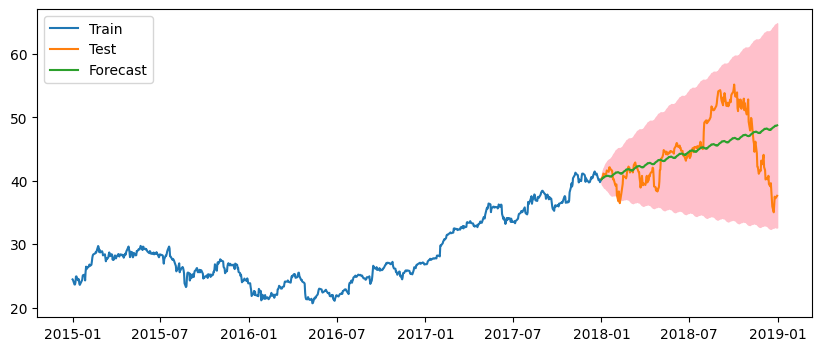

RMSE: 4.42, MAE: 3.26 MAPE: 0.07 R2: 0.21


In [ ]:
# Read CSV skipping the first two metadata rows
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)

# Set proper column names
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.set_index('Date', inplace=True)

# Ensure daily frequency and interpolate missing Close values
df = df.asfreq('D')
df['Close'].interpolate(method='time', inplace=True)

train = df.loc['2015-01-01':'2017-12-31']['Close']
test = df.loc['2018-01-01':'2018-12-31']['Close']

model = SARIMAX(train, order=(2,1,3), seasonal_order=(1,1,1,22), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False)
forecast_result = results.get_forecast(steps=len(test))
forecast = forecast_result.predicted_mean
forecast_ci = forecast_result.conf_int()
plt.figure(figsize=(10,4))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.legend()
plt.show()

# Metrics
rmse = np.sqrt(mean_squared_error(test, forecast))
mae = mean_absolute_error(test, forecast)
mape = mean_absolute_percentage_error(test, forecast)
r2 = r2_score(test, forecast)
print(f'RMSE: {rmse:.2f}, MAE: {mae:.2f}', f'MAPE: {mape:.2f}', f'R2: {r2:.2f}')

# TFT weekly:

In [ ]:
!pip install pytorch_forecasting
!pip install torch
!pip install pytorch_lightning
!pip install ta

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.9/260.9 kB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 824.2/824.2 kB 50.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 59.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

# Final test:

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 221 K  | train
------------------------------------------------------------
221 K     Trainable params
0         Non-trainable params
221 K     Total params
0.886     Total estimated model params size (MB)
238       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 5.3782
  MAE : 4.1841
  R²  : 0.9553
  MAPE: 2.05%


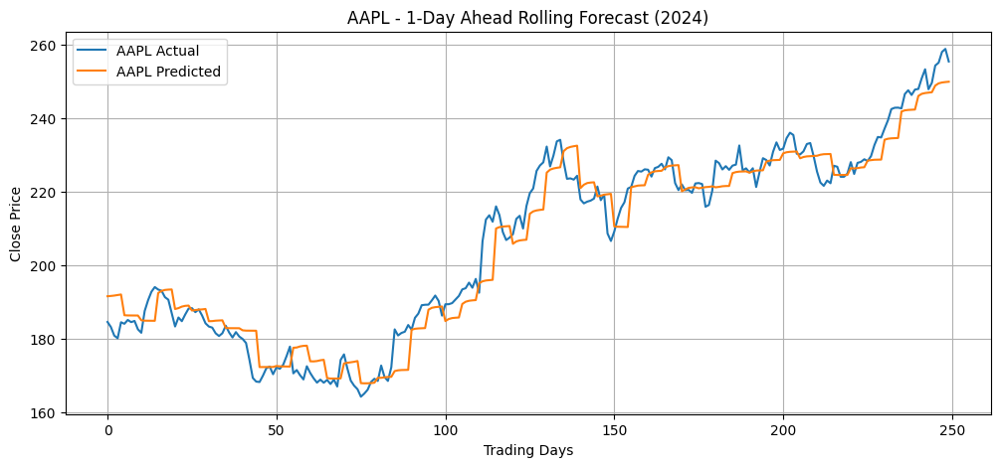


 JPM Evaluation:
  RMSE: 4.9899
  MAE : 3.5831
  R²  : 0.9489
  MAPE: 1.77%


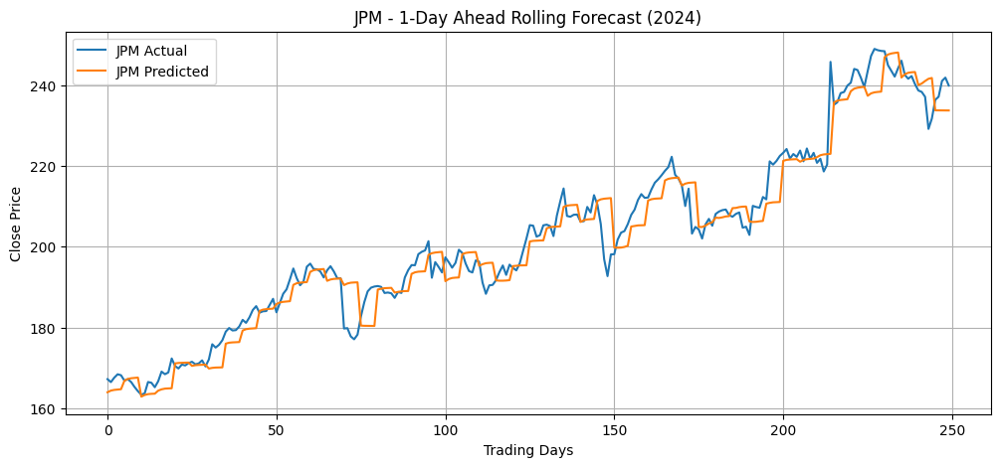


 NVDA Evaluation:
  RMSE: 6.3253
  MAE : 4.9226
  R²  : 0.9447
  MAPE: 4.70%


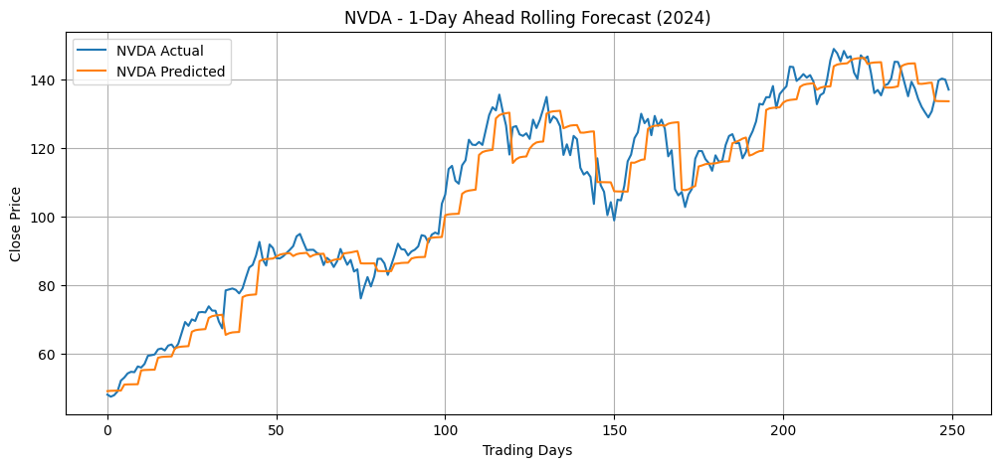


 SPY Evaluation:
  RMSE: 7.4279
  MAE : 6.0644
  R²  : 0.9619
  MAPE: 1.13%


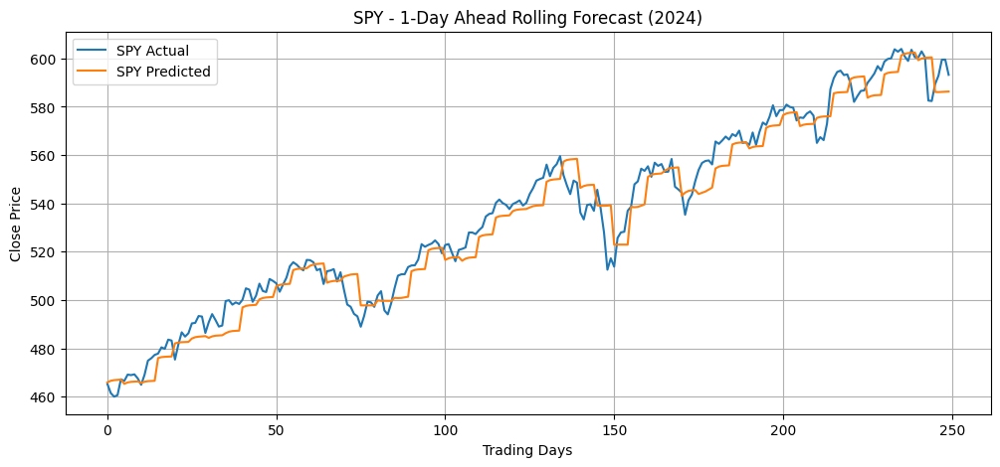

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 5
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(0, steps, max_prediction_length):  # jump in 5-day chunks
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1

        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()
            actual = data_slice.tail(max_prediction_length)["Close"].values

            preds_by_group[group].extend(prediction)
            actuals_by_group[group].extend(actual)

        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 221 K  | train
------------------------------------------------------------
221 K     Trainable params
0         Non-trainable params
221 K     Total params
0.886     Total estimated model params size (MB)
238       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 3.8790
  MAE : 2.9326
  R²  : 0.9214
  MAPE: 2.09%


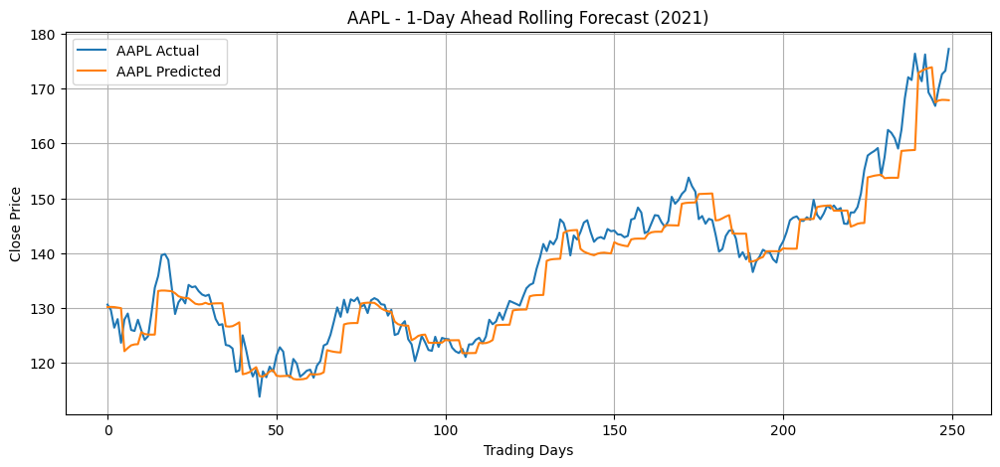


 JPM Evaluation:
  RMSE: 3.8216
  MAE : 2.9755
  R²  : 0.8441
  MAPE: 2.14%


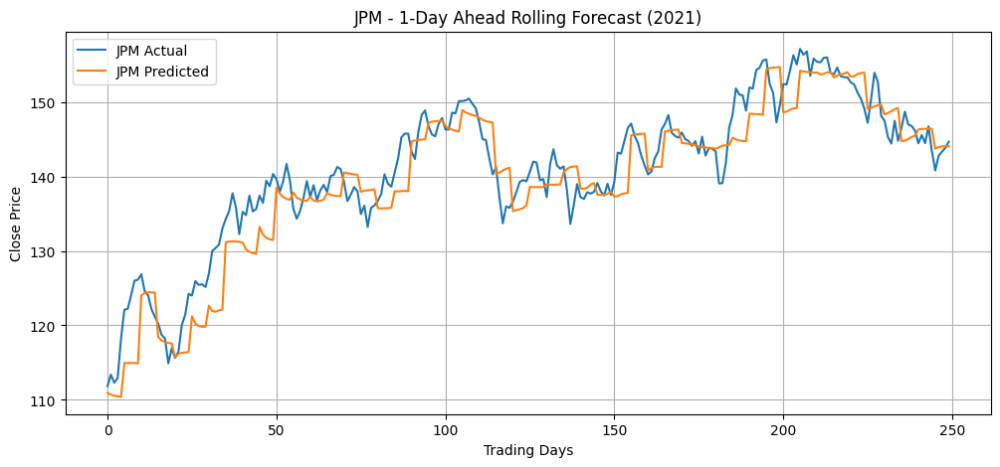


 NVDA Evaluation:
  RMSE: 1.0330
  MAE : 0.7215
  R²  : 0.9678
  MAPE: 3.63%


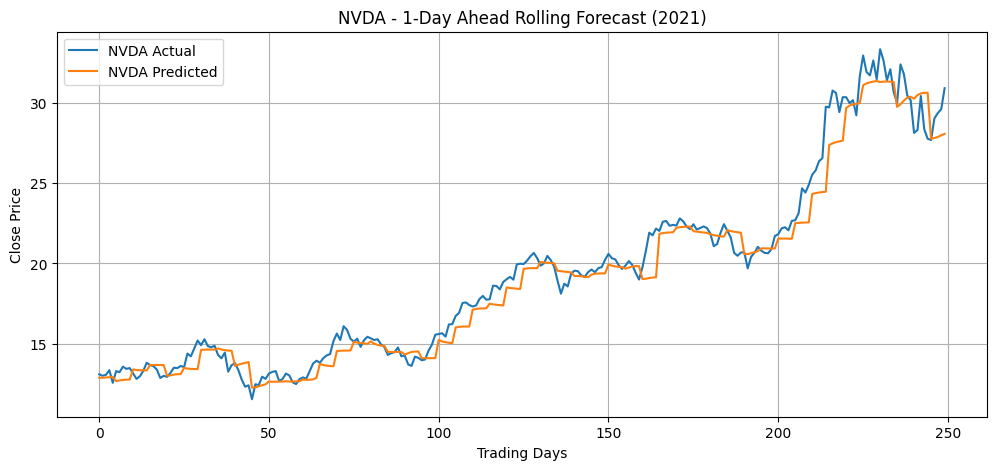


 SPY Evaluation:
  RMSE: 5.2820
  MAE : 4.2885
  R²  : 0.9652
  MAPE: 1.06%


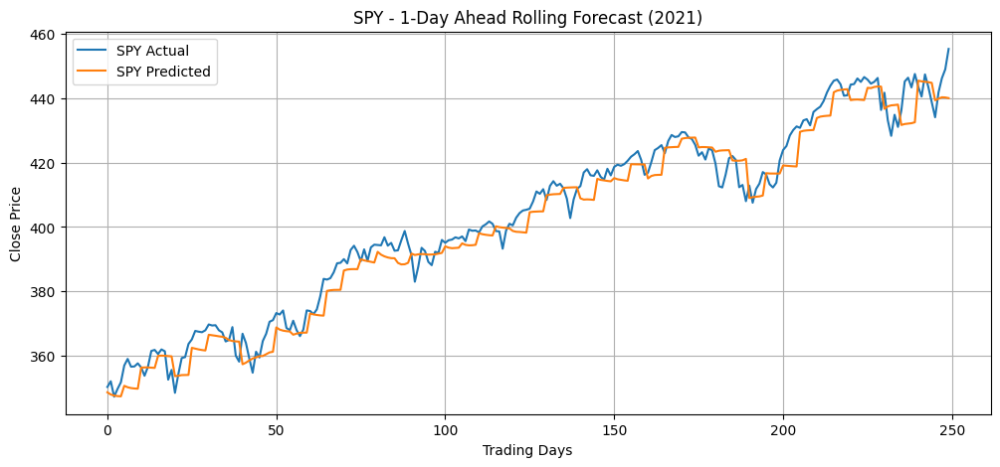

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2015-01-01') & (df['Date'] <= '2021-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2021-01-01"].copy()
test_df = df[df['Date'] >= "2020-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 5
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(0, steps, max_prediction_length):  # jump in 5-day chunks
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1

        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()
            actual = data_slice.tail(max_prediction_length)["Close"].values

            preds_by_group[group].extend(prediction)
            actuals_by_group[group].extend(actual)


        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2021)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 221 K  | train
------------------------------------------------------------
221 K     Trainable params
0         Non-trainable params
221 K     Total params
0.886     Total estimated model params size (MB)
238       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 1.5491
  MAE : 1.1542
  R²  : 0.9025
  MAPE: 2.65%


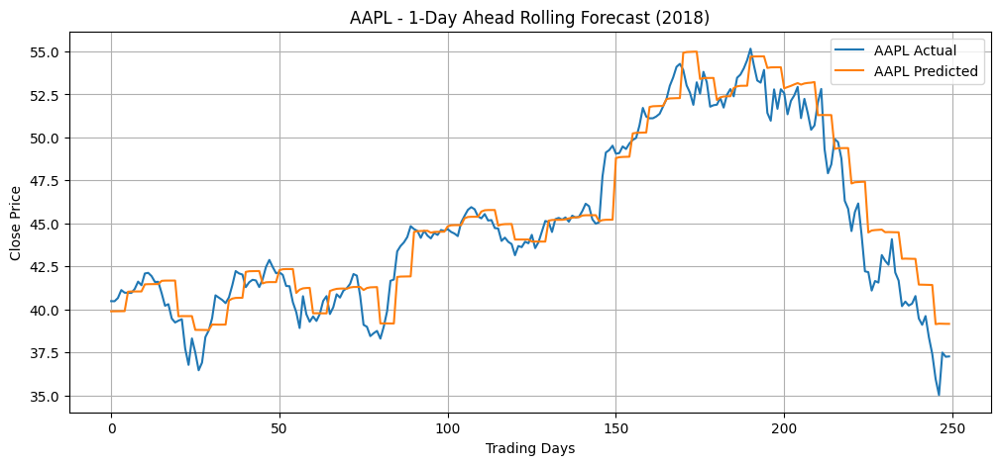


 JPM Evaluation:
  RMSE: 2.2853
  MAE : 1.7524
  R²  : 0.6375
  MAPE: 1.95%


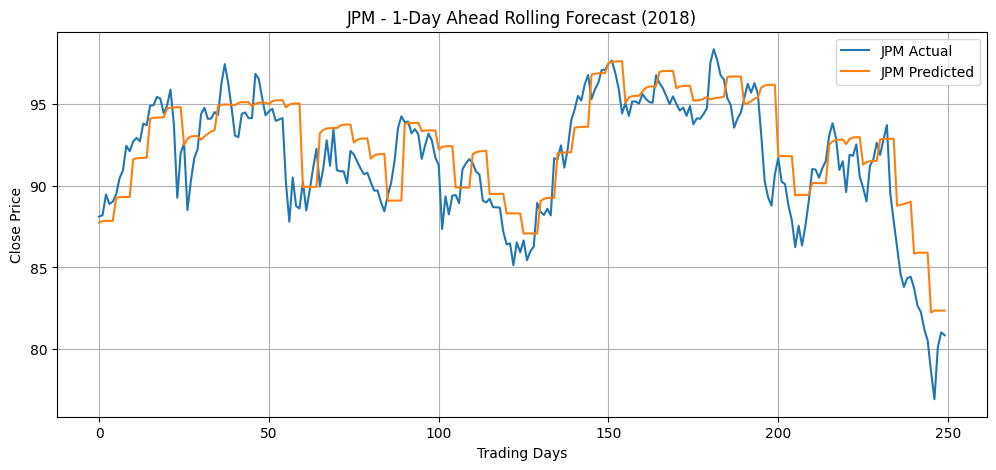


 NVDA Evaluation:
  RMSE: 0.3197
  MAE : 0.2242
  R²  : 0.8707
  MAPE: 4.27%


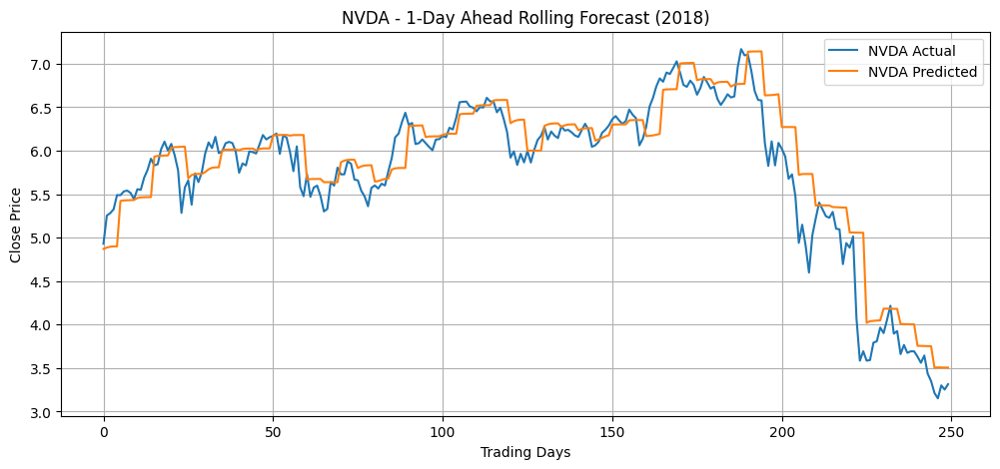


 SPY Evaluation:
  RMSE: 4.6932
  MAE : 3.2660
  R²  : 0.7301
  MAPE: 1.36%


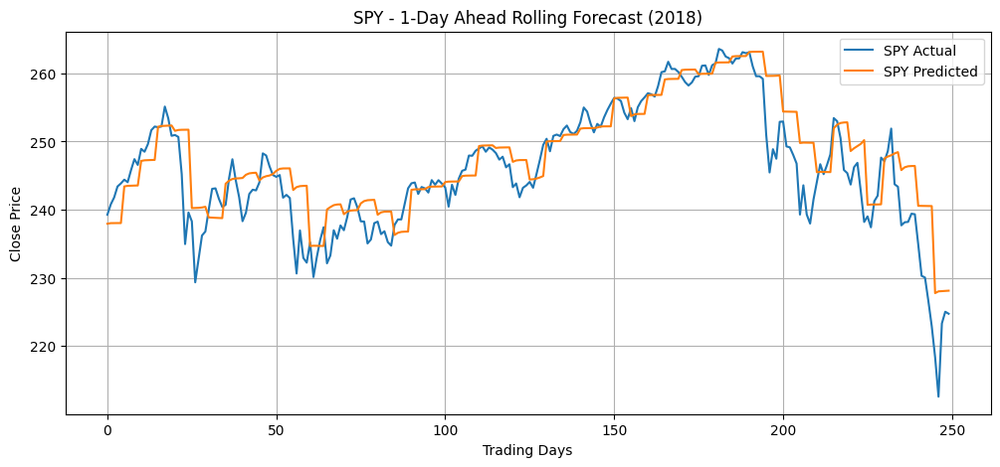

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2012-01-01') & (df['Date'] <= '2018-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2018-01-01"].copy()
test_df = df[df['Date'] >= "2017-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 5
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(0, steps, max_prediction_length):  # jump in 5-day chunks
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1

        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()
            actual = data_slice.tail(max_prediction_length)["Close"].values

            preds_by_group[group].extend(prediction)
            actuals_by_group[group].extend(actual)

        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2018)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

# LSTM time test.

daily

Epoch 1/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.1039
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.0039
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.0016
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0012
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0012
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0010
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 8.9799e-04
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 8.8639e-04
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 8.0252e-04
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 8.8584e-04
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 7.8022e-04
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 7.7325e-04
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 7.6588e-04
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 7.1005e-04
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━

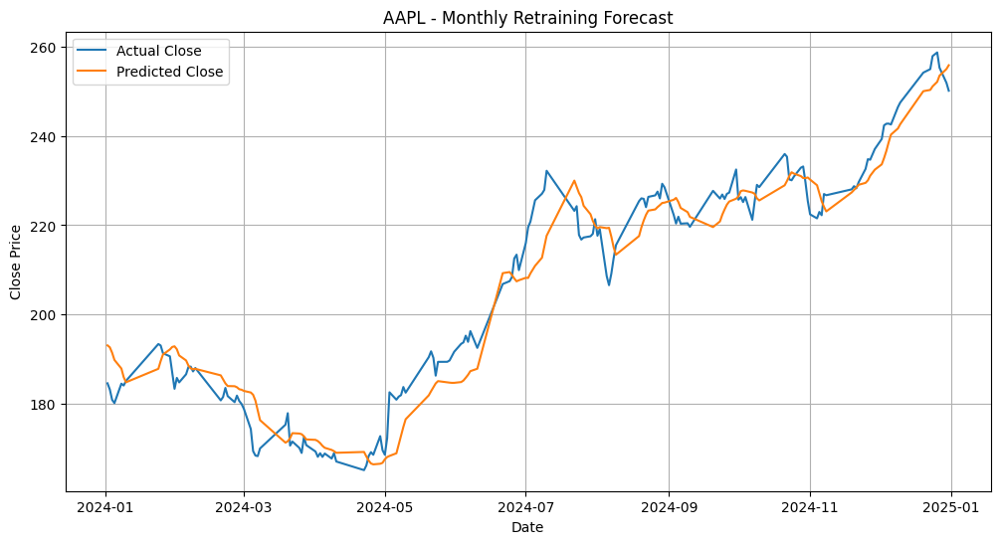

Epoch 1/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1259
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 0.0053
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0025
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0021
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0023
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0018
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.0020
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0020
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0017
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0018
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0018
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0016
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0016
Epoch 14/20
10/24 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0015

KeyboardInterrupt: 

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
import warnings
from ta.momentum import RSIIndicator
from ta.trend import MACD
from keras.optimizers import Adam
from keras.layers import Dropout
from keras.callbacks import EarlyStopping
from dateutil.relativedelta import relativedelta

warnings.filterwarnings("ignore")

def load_main_stock(path):
    df = pd.read_csv(path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Open', 'High', 'Low', 'Close', 'Volume']].set_index('Date')
    df = df.loc['2008-01-01':'2024-12-31']

    df['Close_lag1'] = df['Close'].shift(1)
    df['Volume_lag1'] = df['Volume'].shift(1)
    df['ma_5'] = df['Close_lag1'].rolling(window=5).mean()
    df['volatility_63'] = df['Close_lag1'].rolling(window=63).std()
    df['intraday_range'] = df['High'].shift(1) - df['Low'].shift(1)
    df['upper_shadow'] = df['High'].shift(1) - df[['Open', 'Close']].shift(1).max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].shift(1).min(axis=1) - df['Low'].shift(1)
    df['momentum_126'] = df['Close_lag1'] - df['Close_lag1'].shift(126)
    df['RSI'] = RSIIndicator(close=df['Close_lag1'], window=14).rsi()
    macd = MACD(close=df['Close_lag1'])
    df['MACD'] = macd.macd()
    df['MACD_signal'] = macd.macd_signal()


    df = df.drop(columns=['Open', 'High', 'Low', 'Volume'])
    return df.dropna()


def create_sequences(X, y, window):
    Xs, ys = [], []
    for i in range(len(X) - window):
        Xs.append(X[i:i+window])
        ys.append(y[i+window])
    return np.array(Xs), np.array(ys)


def forecast_with_monthly_retraining(df, stock_name, window=20):
    df = df[['Close', 'Close_lag1']].dropna()
    feature_cols = df.columns.drop('Close')
    df = df.loc['2018-01-01':'2024-12-31']

    test_start = pd.Timestamp("2023-12-11")
    test_end = pd.Timestamp("2024-12-31")

    current_train_end = pd.Timestamp("2023-12-31")
    current_test_start = test_start

    all_preds = []
    all_true = []
    all_dates = []

    while current_test_start <= test_end:
        current_test_end = (current_test_start + relativedelta(months=1)) - pd.Timedelta(days=1)
        if current_test_end > test_end:
            current_test_end = test_end

        train_df = df.loc[:current_train_end]
        test_df = df.loc[current_test_start - pd.Timedelta(days=window):current_test_end]

        if len(test_df) <= window:
            break

        # Scaling
        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train = scaler_X.fit_transform(train_df[feature_cols])
        y_train = scaler_y.fit_transform(train_df[['Close']])

        X_test = scaler_X.transform(test_df[feature_cols])
        y_test = scaler_y.transform(test_df[['Close']])

        X_train_seq, y_train_seq = create_sequences(X_train, y_train, window)
        X_test_seq, y_test_seq = create_sequences(X_test, y_test, window)

        # Model
        model = Sequential([
            LSTM(64, input_shape=(window, X_train_seq.shape[2]),
                return_sequences=False,
                dropout=0.0, recurrent_dropout=0.1),  # forces generic kernel
            Dense(1)
        ])
        model.compile(optimizer=Adam(learning_rate=0.003), loss='mse')
        model.fit(X_train_seq, y_train_seq, epochs=20, batch_size=64, verbose=1)

        y_pred_scaled = model.predict(X_test_seq, verbose=0)
        y_pred = scaler_y.inverse_transform(y_pred_scaled)
        y_true = scaler_y.inverse_transform(y_test_seq)

        # Save results
        pred_dates = test_df.index[window:]
        all_preds.extend(y_pred.flatten())
        all_true.extend(y_true.flatten())
        all_dates.extend(pred_dates)

        # Append true values to training data for next iteration
        past_and_current = df.loc[:current_test_end]
        current_train_end = current_test_end + pd.Timedelta(days=0)
        current_test_start = current_test_end + pd.Timedelta(days=1)

    # Convert to pandas Series with datetime index
    pred_series = pd.Series(all_preds, index=pd.to_datetime(all_dates))
    true_series = pd.Series(all_true, index=pd.to_datetime(all_dates))

    # Truncate to only predictions from Jan 1, 2019
    plot_start = pd.Timestamp("2024-01-01")
    pred_series = pred_series[pred_series.index >= plot_start]
    true_series = true_series[true_series.index >= plot_start]

    # Use for metrics
    rmse = np.sqrt(mean_squared_error(true_series, pred_series))
    mae = mean_absolute_error(true_series, pred_series)
    r2 = r2_score(true_series, pred_series)
    mape = mean_absolute_percentage_error(true_series, pred_series)

    print(f"\n📊 Results for {stock_name}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE : {mae:.4f}")
    print(f"R^2 : {r2:.4f}")
    print(f"MAPE: {mape:.4f}")

    # Convert to pandas Series for easy filtering
    pred_series = pd.Series(all_preds, index=pd.to_datetime(all_dates))
    true_series = pd.Series(all_true, index=pd.to_datetime(all_dates))

    # Filter to start from Jan 1, 2019
    plot_start = pd.Timestamp("2024-01-01")
    pred_series = pred_series[pred_series.index >= plot_start]
    true_series = true_series[true_series.index >= plot_start]

    plt.figure(figsize=(12, 6))
    plt.plot(true_series.index, true_series.values, label='Actual Close')
    plt.plot(pred_series.index, pred_series.values, label='Predicted Close')
    plt.title(f'{stock_name} - Monthly Retraining Forecast')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.legend()
    plt.grid()
    plt.show()

    scaled_rmse = rmse / (np.max(all_true) - np.min(all_true))
    return scaled_rmse

scaled_rmses = []

for ticker in ['AAPL.csv', 'JPM.csv', 'NVDA.csv', 'SPY.csv']:
    df = load_main_stock(ticker)
    scaled_rmse = forecast_with_monthly_retraining(df, ticker.replace('.csv', ''))
    scaled_rmses.append(scaled_rmse)

mean_scaled_rmse = sum(scaled_rmses) / len(scaled_rmses)
print("📉 Mean Scaled RMSE over 4 stocks:", mean_scaled_rmse)


weekly

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
import warnings
warnings.filterwarnings("ignore")

# Load function
def load_main_stock_close(path):
    df = pd.read_csv(path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Open', 'High', 'Low', 'Close', 'Volume']].set_index('Date')
    df = df.loc['2008-01-01':'2024-12-31']
    df['Close_lag1'] = df['Close'].shift(1)
    df = df.drop(columns=['Open', 'High', 'Low', 'Volume'])
    return df.dropna()

# Sequence creator
def create_sequences(X, y, window=20, horizon=5):
    Xs, ys = [], []
    for i in range(len(X) - window - horizon + 1):
        Xs.append(X[i:i+window])
        ys.append(y[i+window:i+window+horizon].flatten())
    return np.array(Xs), np.array(ys)

# Recursive 5-day forecaster
def forecast_stock(df, stock_name):
    df = df[['Close', 'Close_lag1']].dropna()

    train_df = df.loc['2015-01-01':'2017-12-31']
    test_df = df.loc['2017-12-01':'2018-12-31']

    feature = ['Close_lag1']

    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()

    X_train = scaler_X.fit_transform(train_df[feature])
    y_train = scaler_y.fit_transform(train_df[['Close']])

    X_test = scaler_X.transform(test_df[feature])
    y_test = scaler_y.transform(test_df[['Close']])

    X_train_seq, y_train_seq = create_sequences(X_train, y_train)

    model = Sequential([
        LSTM(64, input_shape=(window, X_train_seq.shape[2]),
            return_sequences=False,
            dropout=0.0, recurrent_dropout=0.1),  # forces generic kernel
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=0.003), loss='mse')
    model.fit(X_train_seq, y_train_seq, epochs=20, batch_size=64, verbose=0)

    # Recursive prediction (non-overlapping)
    window, horizon = 20, 5
    X_test_full = X_test
    dates = test_df.index

    y_pred_scaled = []
    y_pred_dates = []

    start = 0
    while start + window + horizon <= len(X_test_full):
        current_input = X_test_full[start:start+window].copy()
        pred_dates = dates[start + window : start + window + horizon]

        for i in range(horizon):
            date_i = pred_dates[i]
            if not (pd.Timestamp("2018-01-01") <= date_i <= pd.Timestamp("2018-12-31")):
                continue

            X_input_seq = current_input[-window:].reshape(1, window, -1)
            next_close_scaled = model.predict(X_input_seq, verbose=0)[0][0]

            y_pred_scaled.append([next_close_scaled])
            y_pred_dates.append(date_i)

            real_next_row = df.loc[date_i, feature].values.reshape(1, -1)
            real_next_row_scaled = scaler_X.transform(real_next_row)
            real_next_row_scaled[0, 0] = next_close_scaled  # replace lag1 with predicted close

            current_input = np.vstack([current_input, real_next_row_scaled])

        start += horizon

    # Evaluation
    y_pred_scaled = np.array(y_pred_scaled).reshape(-1, 1)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_true = test_df.loc[y_pred_dates, 'Close'].values.reshape(-1, 1)

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)

    print(f"\n📈 Results for {stock_name}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE : {mae:.4f}")
    print(f"R^2 : {r2:.4f}")
    print(f"MAPE: {mape:.4f}")

    # Plot
    plt.figure(figsize=(12, 6))
    plt.plot(y_pred_dates, y_true.flatten(), label='Actual Close')
    plt.plot(y_pred_dates, y_pred.flatten(), label='Predicted Close')
    plt.title(f'{stock_name} - Recursive 5-Day Forecast')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.legend()
    plt.grid()
    plt.show()
    scaled_rmse = rmse / (y_true.max() - y_true.min())
    return scaled_rmse

scaled_rmses = []

for ticker in ['AAPL.csv', 'JPM.csv', 'NVDA.csv', 'SPY.csv']:
    df = load_main_stock(ticker)
    scaled_rmse = forecast_stock(df, ticker.replace('.csv', ''))
    scaled_rmses.append(scaled_rmse)

mean_scaled_rmse = sum(scaled_rmses) / len(scaled_rmses)
print("Mean Scaled RMSE over 4 stocks:", mean_scaled_rmse)

# GNN tests:

In [ ]:
pip install torch-geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 25.8 MB/s eta 0:00:00


# AAPL

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])

    df = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'AAPL'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            # Collect features from day-(window_size-1) to day (inclusive)
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            # Extract features for each day in window: Close, RSI, MACD
            # Shape: (window_size, 3)
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        y.append(panel[target_stock].iloc[day + 1]['Close'])  # Next day close as label

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0.0, posinf=0.0, neginf=0.0)

        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)

    torch.save(graph_list, 'graph_list_aapl_21day_rsimacd.pt')

Epoch 01 | Train Loss: 0.0061 | Test Loss: 0.0114
 New best model saved (Train Loss: 0.0061)
Epoch 02 | Train Loss: 0.0035 | Test Loss: 0.0083
 New best model saved (Train Loss: 0.0035)
Epoch 03 | Train Loss: 0.0023 | Test Loss: 0.0073
 New best model saved (Train Loss: 0.0023)
Epoch 04 | Train Loss: 0.0017 | Test Loss: 0.0078
 New best model saved (Train Loss: 0.0017)
Epoch 05 | Train Loss: 0.0013 | Test Loss: 0.0069
 New best model saved (Train Loss: 0.0013)
Epoch 06 | Train Loss: 0.0012 | Test Loss: 0.0066
 New best model saved (Train Loss: 0.0012)
Epoch 07 | Train Loss: 0.0012 | Test Loss: 0.0067
 No improvement for 1 epoch(s)
Epoch 08 | Train Loss: 0.0012 | Test Loss: 0.0066
 New best model saved (Train Loss: 0.0012)
Epoch 09 | Train Loss: 0.0012 | Test Loss: 0.0064
 New best model saved (Train Loss: 0.0012)
Epoch 10 | Train Loss: 0.0012 | Test Loss: 0.0071
 No improvement for 1 epoch(s)
Epoch 11 | Train Loss: 0.0011 | Test Loss: 0.0066
 New best model saved (Train Loss: 0.0011)
E

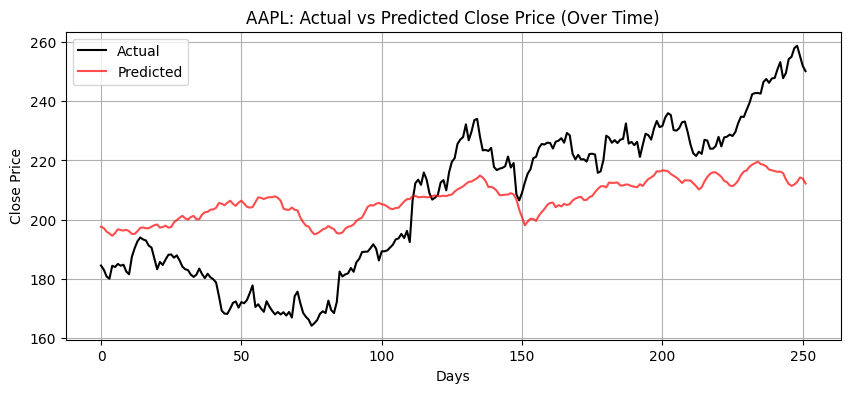

Extracted attention weights for AAPL for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


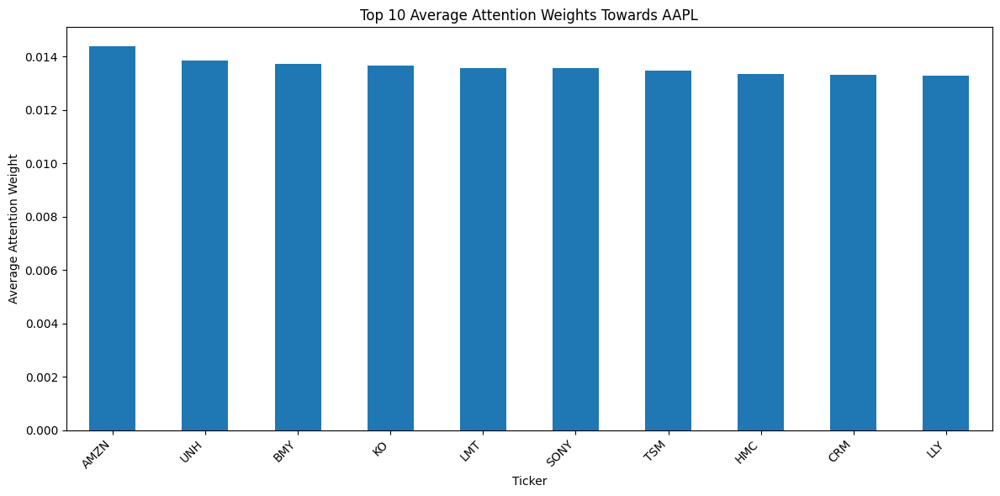

Top 10 tickers by average attention weight towards AAPL:
AMZN    0.014387
UNH     0.013849
BMY     0.013735
KO      0.013655
LMT     0.013569
SONY    0.013563
TSM     0.013482
HMC     0.013349
CRM     0.013308
LLY     0.013282
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if train_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = train_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'AAPL'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])

    df = df[(df['Date'] >= '2015-01-01') & (df['Date'] <= '2021-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'AAPL'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            # Collect features from day-(window_size-1) to day (inclusive)
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            # Extract features for each day in window: Close, RSI, MACD
            # Shape: (window_size, 3)
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        y.append(panel[target_stock].iloc[day + 1]['Close'])  # Next day close as label

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0.0, posinf=0.0, neginf=0.0)

        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)

    torch.save(graph_list, 'graph_list_aapl_21day_rsimacd21.pt')

Epoch 01 | Train Loss: 0.0027 | Test Loss: 0.0134
 New best model saved (Train Loss: 0.0027)
Epoch 02 | Train Loss: 0.0004 | Test Loss: 0.0023
 New best model saved (Train Loss: 0.0004)
Epoch 03 | Train Loss: 0.0005 | Test Loss: 0.0029
 No improvement for 1 epoch(s)
Epoch 04 | Train Loss: 0.0004 | Test Loss: 0.0042
 New best model saved (Train Loss: 0.0004)
Epoch 05 | Train Loss: 0.0004 | Test Loss: 0.0029
 No improvement for 1 epoch(s)
Epoch 06 | Train Loss: 0.0004 | Test Loss: 0.0043
 No improvement for 2 epoch(s)
Epoch 07 | Train Loss: 0.0004 | Test Loss: 0.0026
 No improvement for 3 epoch(s)
Epoch 08 | Train Loss: 0.0004 | Test Loss: 0.0054
 No improvement for 4 epoch(s)
Epoch 09 | Train Loss: 0.0003 | Test Loss: 0.0024
 New best model saved (Train Loss: 0.0003)
Epoch 10 | Train Loss: 0.0004 | Test Loss: 0.0047
 No improvement for 1 epoch(s)
Epoch 11 | Train Loss: 0.0004 | Test Loss: 0.0047
 No improvement for 2 epoch(s)
Epoch 12 | Train Loss: 0.0004 | Test Loss: 0.0079
 No improve

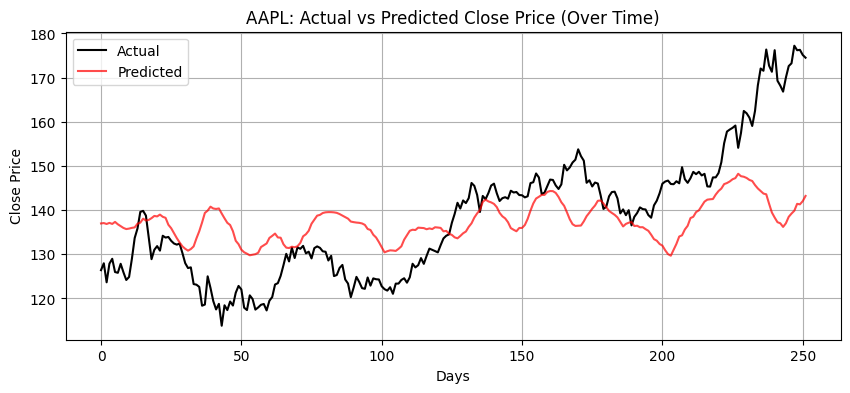

Extracted attention weights for AAPL for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


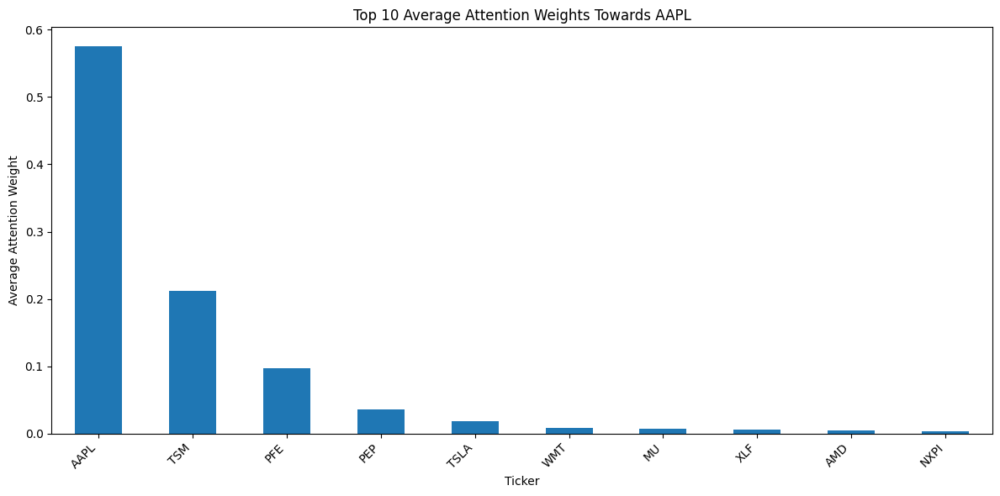

Top 10 tickers by average attention weight towards AAPL:
AAPL    0.574993
TSM     0.212526
PFE     0.097306
PEP     0.036355
TSLA    0.017983
WMT     0.008451
MU      0.007529
XLF     0.006255
AMD     0.004437
NXPI    0.003449
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd21.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if train_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = train_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'AAPL'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])

    df = df[(df['Date'] >= '2012-01-01') & (df['Date'] <= '2018-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'AAPL'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            # Collect features from day-(window_size-1) to day (inclusive)
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            # Extract features for each day in window: Close, RSI, MACD
            # Shape: (window_size, 3)
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        y.append(panel[target_stock].iloc[day + 1]['Close'])  # Next day close as label

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0.0, posinf=0.0, neginf=0.0)

        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)

    torch.save(graph_list, 'graph_list_aapl_21day_rsimacd18.pt')

Epoch 01 | Train Loss: 0.0038 | Test Loss: 0.0018
 New best model saved (Train Loss: 0.0038)
Epoch 02 | Train Loss: 0.0015 | Test Loss: 0.0011
 New best model saved (Train Loss: 0.0015)
Epoch 03 | Train Loss: 0.0006 | Test Loss: 0.0010
 New best model saved (Train Loss: 0.0006)
Epoch 04 | Train Loss: 0.0003 | Test Loss: 0.0009
 New best model saved (Train Loss: 0.0003)
Epoch 05 | Train Loss: 0.0002 | Test Loss: 0.0005
 New best model saved (Train Loss: 0.0002)
Epoch 06 | Train Loss: 0.0001 | Test Loss: 0.0004
 New best model saved (Train Loss: 0.0001)
Epoch 07 | Train Loss: 0.0001 | Test Loss: 0.0005
 New best model saved (Train Loss: 0.0001)
Epoch 08 | Train Loss: 0.0001 | Test Loss: 0.0004
 New best model saved (Train Loss: 0.0001)
Epoch 09 | Train Loss: 0.0001 | Test Loss: 0.0006
 New best model saved (Train Loss: 0.0001)
Epoch 10 | Train Loss: 0.0000 | Test Loss: 0.0003
 New best model saved (Train Loss: 0.0000)
Epoch 11 | Train Loss: 0.0000 | Test Loss: 0.0005
 No improvement for 

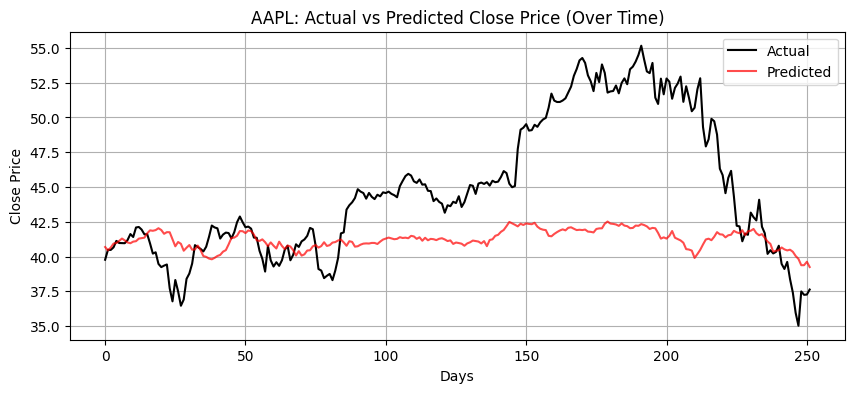

Extracted attention weights for AAPL for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


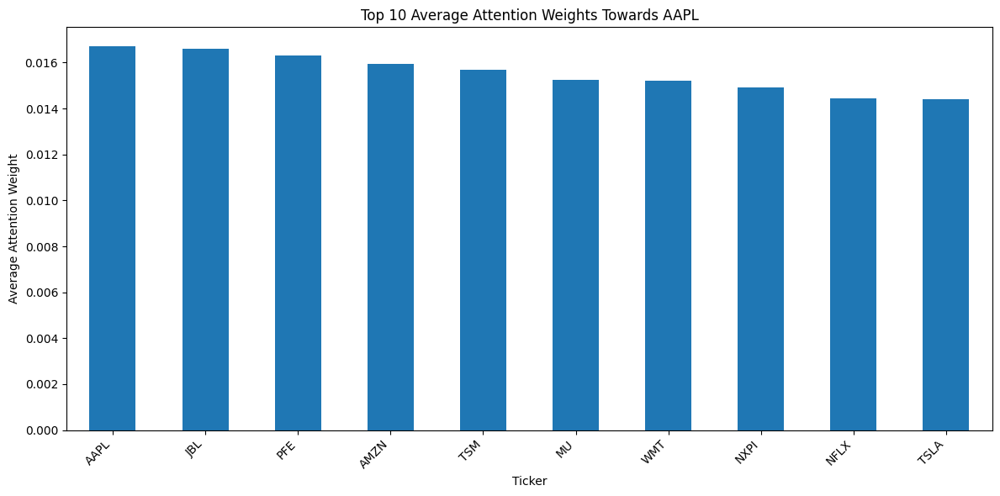

Top 10 tickers by average attention weight towards AAPL:
AAPL    0.016708
JBL     0.016599
PFE     0.016296
AMZN    0.015942
TSM     0.015704
MU      0.015235
WMT     0.015212
NXPI    0.014908
NFLX    0.014449
TSLA    0.014417
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd18.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if train_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = train_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'AAPL'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

# JPM

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])

    df = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'JPM'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            # Collect features from day-(window_size-1) to day (inclusive)
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            # Extract features for each day in window: Close, RSI, MACD
            # Shape: (window_size, 3)
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        y.append(panel[target_stock].iloc[day + 1]['Close'])  # Next day close as label

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0.0, posinf=0.0, neginf=0.0)

        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)

    torch.save(graph_list, 'graph_list_jpm_21day_rsimacd.pt')

Epoch 01 | Train Loss: 0.0070 | Test Loss: 0.0327
 New best model saved (Train Loss: 0.0070)
Epoch 02 | Train Loss: 0.0033 | Test Loss: 0.0275
 New best model saved (Train Loss: 0.0033)
Epoch 03 | Train Loss: 0.0018 | Test Loss: 0.0181
 New best model saved (Train Loss: 0.0018)
Epoch 04 | Train Loss: 0.0012 | Test Loss: 0.0142
 New best model saved (Train Loss: 0.0012)
Epoch 05 | Train Loss: 0.0009 | Test Loss: 0.0123
 New best model saved (Train Loss: 0.0009)
Epoch 06 | Train Loss: 0.0007 | Test Loss: 0.0084
 New best model saved (Train Loss: 0.0007)
Epoch 07 | Train Loss: 0.0006 | Test Loss: 0.0097
 New best model saved (Train Loss: 0.0006)
Epoch 08 | Train Loss: 0.0005 | Test Loss: 0.0085
 New best model saved (Train Loss: 0.0005)
Epoch 09 | Train Loss: 0.0005 | Test Loss: 0.0066
 New best model saved (Train Loss: 0.0005)
Epoch 10 | Train Loss: 0.0005 | Test Loss: 0.0075
 New best model saved (Train Loss: 0.0005)
Epoch 11 | Train Loss: 0.0004 | Test Loss: 0.0103
 New best model save

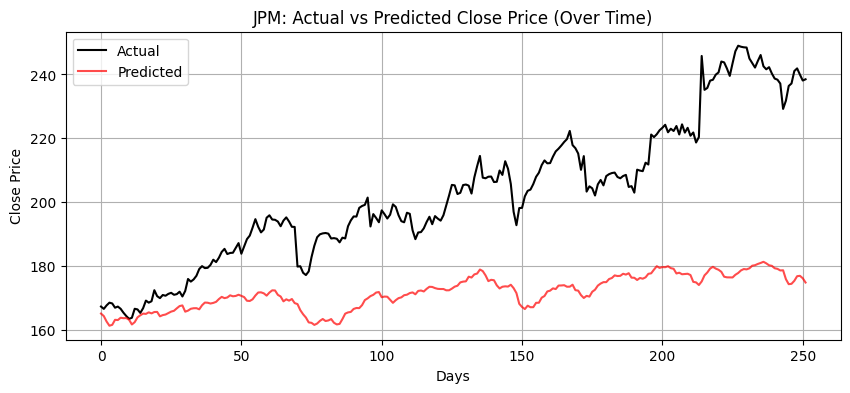

Extracted attention weights for JPM for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


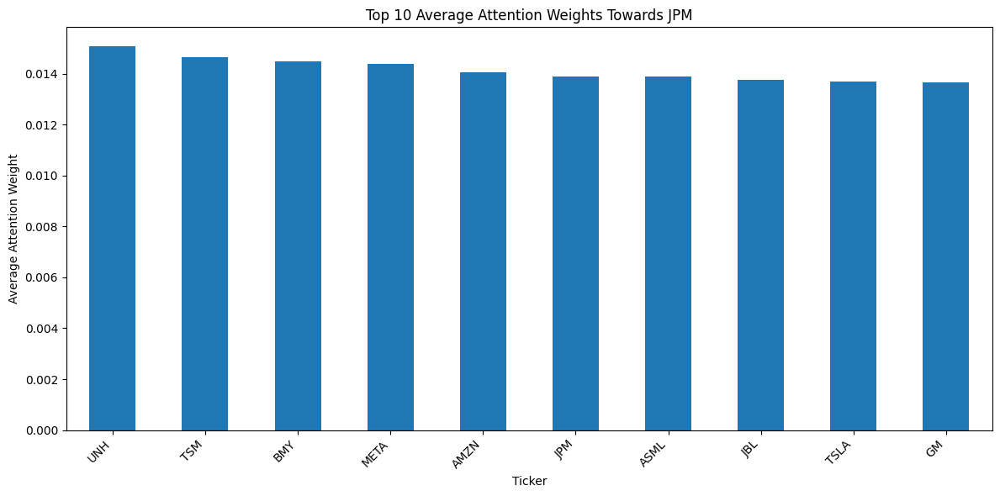

Top 10 tickers by average attention weight towards JPM:
UNH     0.015074
TSM     0.014665
BMY     0.014476
META    0.014399
AMZN    0.014044
JPM     0.013895
ASML    0.013891
JBL     0.013747
TSLA    0.013679
GM      0.013667
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'JPM'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if train_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = train_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'JPM'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])

    df = df[(df['Date'] >= '2015-01-01') & (df['Date'] <= '2021-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'JPM'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            # Collect features from day-(window_size-1) to day (inclusive)
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            # Extract features for each day in window: Close, RSI, MACD
            # Shape: (window_size, 3)
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        y.append(panel[target_stock].iloc[day + 1]['Close'])  # Next day close as label

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0.0, posinf=0.0, neginf=0.0)

        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)

    torch.save(graph_list, 'graph_list_jpm_21day_rsimacd21.pt')

Epoch 01 | Train Loss: 0.0038 | Test Loss: 0.0133
 New best model saved (Train Loss: 0.0038)
Epoch 02 | Train Loss: 0.0020 | Test Loss: 0.0117
 New best model saved (Train Loss: 0.0020)
Epoch 03 | Train Loss: 0.0010 | Test Loss: 0.0101
 New best model saved (Train Loss: 0.0010)
Epoch 04 | Train Loss: 0.0006 | Test Loss: 0.0078
 New best model saved (Train Loss: 0.0006)
Epoch 05 | Train Loss: 0.0005 | Test Loss: 0.0053
 New best model saved (Train Loss: 0.0005)
Epoch 06 | Train Loss: 0.0004 | Test Loss: 0.0047
 New best model saved (Train Loss: 0.0004)
Epoch 07 | Train Loss: 0.0004 | Test Loss: 0.0025
 No improvement for 1 epoch(s)
Epoch 08 | Train Loss: 0.0003 | Test Loss: 0.0014
 New best model saved (Train Loss: 0.0003)
Epoch 09 | Train Loss: 0.0003 | Test Loss: 0.0007
 No improvement for 1 epoch(s)
Epoch 10 | Train Loss: 0.0003 | Test Loss: 0.0014
 New best model saved (Train Loss: 0.0003)
Epoch 11 | Train Loss: 0.0003 | Test Loss: 0.0013
 New best model saved (Train Loss: 0.0003)
E

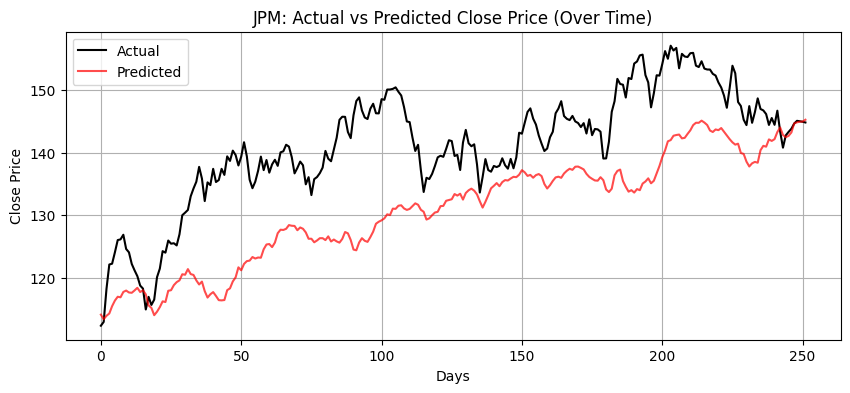

Extracted attention weights for JPM for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


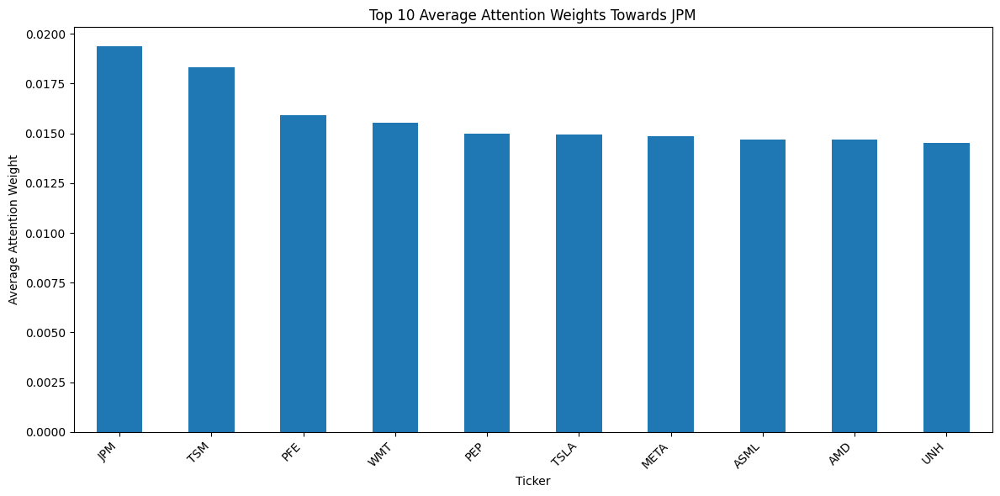

Top 10 tickers by average attention weight towards JPM:
JPM     0.019359
TSM     0.018321
PFE     0.015927
WMT     0.015511
PEP     0.014978
TSLA    0.014940
META    0.014863
ASML    0.014681
AMD     0.014667
UNH     0.014508
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'JPM'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd21.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if train_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = train_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'JPM'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])

    df = df[(df['Date'] >= '2012-01-01') & (df['Date'] <= '2018-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'JPM'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            # Collect features from day-(window_size-1) to day (inclusive)
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            # Extract features for each day in window: Close, RSI, MACD
            # Shape: (window_size, 3)
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        y.append(panel[target_stock].iloc[day + 1]['Close'])  # Next day close as label

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0.0, posinf=0.0, neginf=0.0)

        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)

    torch.save(graph_list, 'graph_list_jpm_21day_rsimacd18.pt')

Epoch 01 | Train Loss: 0.0047 | Test Loss: 0.0005
 New best model saved (Train Loss: 0.0047)
Epoch 02 | Train Loss: 0.0019 | Test Loss: 0.0009
 New best model saved (Train Loss: 0.0019)
Epoch 03 | Train Loss: 0.0010 | Test Loss: 0.0010
 New best model saved (Train Loss: 0.0010)
Epoch 04 | Train Loss: 0.0005 | Test Loss: 0.0013
 New best model saved (Train Loss: 0.0005)
Epoch 05 | Train Loss: 0.0003 | Test Loss: 0.0016
 New best model saved (Train Loss: 0.0003)
Epoch 06 | Train Loss: 0.0002 | Test Loss: 0.0004
 New best model saved (Train Loss: 0.0002)
Epoch 07 | Train Loss: 0.0002 | Test Loss: 0.0005
 New best model saved (Train Loss: 0.0002)
Epoch 08 | Train Loss: 0.0002 | Test Loss: 0.0002
 New best model saved (Train Loss: 0.0002)
Epoch 09 | Train Loss: 0.0002 | Test Loss: 0.0003
 New best model saved (Train Loss: 0.0002)
Epoch 10 | Train Loss: 0.0001 | Test Loss: 0.0005
 New best model saved (Train Loss: 0.0001)
Epoch 11 | Train Loss: 0.0001 | Test Loss: 0.0007
 New best model save

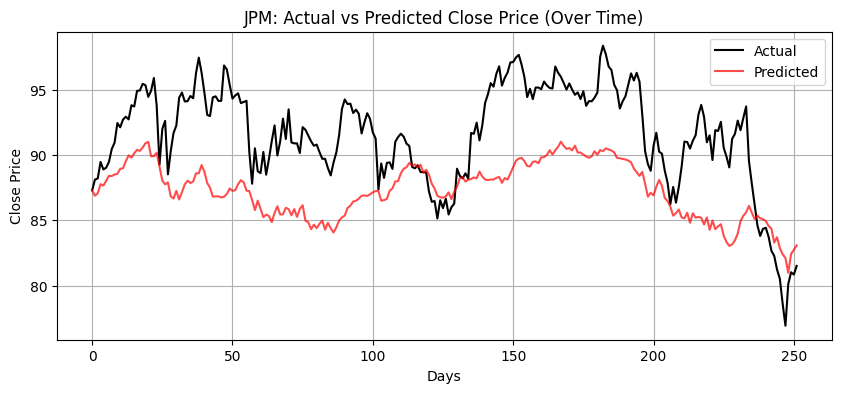

Extracted attention weights for JPM for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


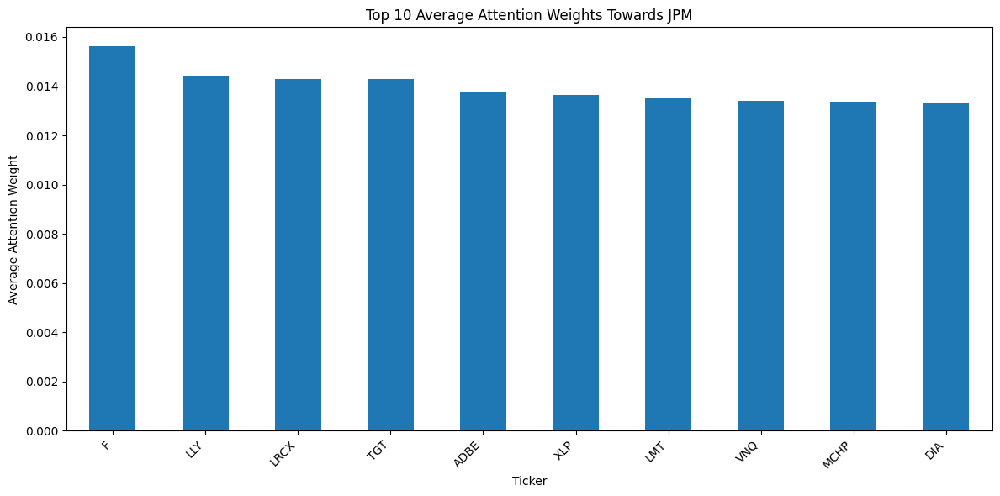

Top 10 tickers by average attention weight towards JPM:
F       0.015618
LLY     0.014433
LRCX    0.014307
TGT     0.014307
ADBE    0.013735
XLP     0.013647
LMT     0.013538
VNQ     0.013396
MCHP    0.013375
DIA     0.013307
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'JPM'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd18.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if train_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = train_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'JPM'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

# NVDA:

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])

    df = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'NVDA'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            # Collect features from day-(window_size-1) to day (inclusive)
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            # Extract features for each day in window: Close, RSI, MACD
            # Shape: (window_size, 3)
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        y.append(panel[target_stock].iloc[day + 1]['Close'])  # Next day close as label

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0.0, posinf=0.0, neginf=0.0)

        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)

    torch.save(graph_list, 'graph_list_nvda_21day_rsimacd.pt')

Epoch 01 | Train Loss: 0.0048 | Test Loss: 0.1555
 New best model saved (Train Loss: 0.0048)
Epoch 02 | Train Loss: 0.0021 | Test Loss: 0.1591
 New best model saved (Train Loss: 0.0021)
Epoch 03 | Train Loss: 0.0012 | Test Loss: 0.1663
 New best model saved (Train Loss: 0.0012)
Epoch 04 | Train Loss: 0.0006 | Test Loss: 0.1458
 New best model saved (Train Loss: 0.0006)
Epoch 05 | Train Loss: 0.0005 | Test Loss: 0.1407
 New best model saved (Train Loss: 0.0005)
Epoch 06 | Train Loss: 0.0004 | Test Loss: 0.1379
 New best model saved (Train Loss: 0.0004)
Epoch 07 | Train Loss: 0.0004 | Test Loss: 0.1315
 New best model saved (Train Loss: 0.0004)
Epoch 08 | Train Loss: 0.0003 | Test Loss: 0.1427
 New best model saved (Train Loss: 0.0003)
Epoch 09 | Train Loss: 0.0003 | Test Loss: 0.1379
 No improvement for 1 epoch(s)
Epoch 10 | Train Loss: 0.0003 | Test Loss: 0.1449
 No improvement for 2 epoch(s)
Epoch 11 | Train Loss: 0.0003 | Test Loss: 0.1467
 New best model saved (Train Loss: 0.0003)
E

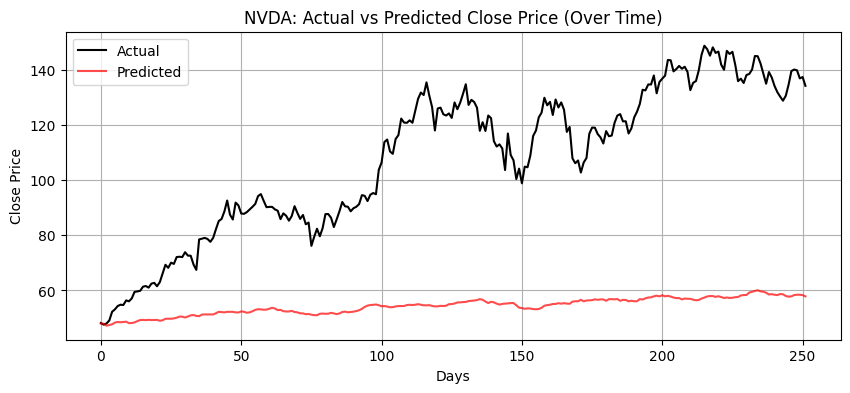

Extracted attention weights for NVDA for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


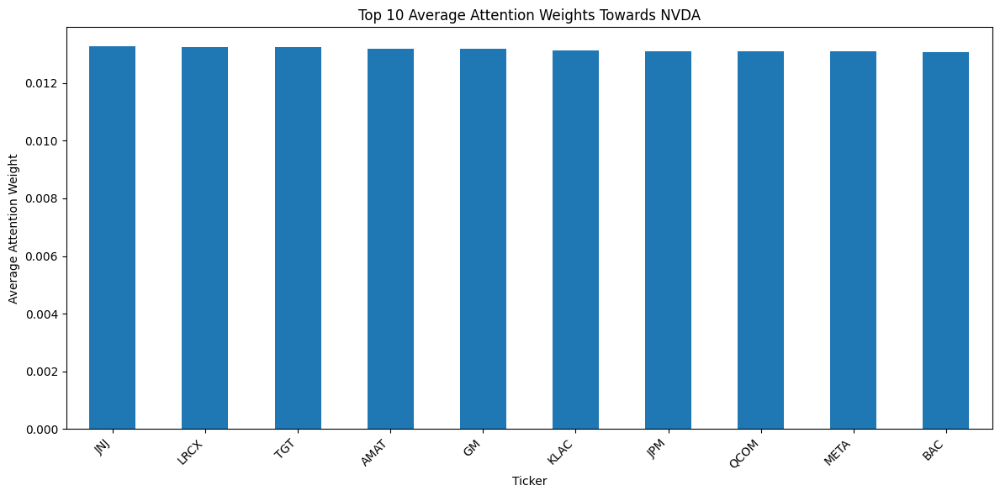

Top 10 tickers by average attention weight towards NVDA:
JNJ     0.013280
LRCX    0.013242
TGT     0.013242
AMAT    0.013201
GM      0.013192
KLAC    0.013125
JPM     0.013120
QCOM    0.013105
META    0.013099
BAC     0.013087
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'NVDA'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if train_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = train_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'NVDA'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])

    df = df[(df['Date'] >= '2015-01-01') & (df['Date'] <= '2021-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'NVDA'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            # Collect features from day-(window_size-1) to day (inclusive)
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            # Extract features for each day in window: Close, RSI, MACD
            # Shape: (window_size, 3)
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        y.append(panel[target_stock].iloc[day + 1]['Close'])  # Next day close as label

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0.0, posinf=0.0, neginf=0.0)

        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)

    torch.save(graph_list, 'graph_list_nvda_21day_rsimacd21.pt')

Epoch 01 | Train Loss: 0.0041 | Test Loss: 0.0021
 New best model saved (Train Loss: 0.0041)
Epoch 02 | Train Loss: 0.0015 | Test Loss: 0.0018
 New best model saved (Train Loss: 0.0015)
Epoch 03 | Train Loss: 0.0006 | Test Loss: 0.0018
 New best model saved (Train Loss: 0.0006)
Epoch 04 | Train Loss: 0.0003 | Test Loss: 0.0023
 New best model saved (Train Loss: 0.0003)
Epoch 05 | Train Loss: 0.0002 | Test Loss: 0.0043
 New best model saved (Train Loss: 0.0002)
Epoch 06 | Train Loss: 0.0001 | Test Loss: 0.0026
 New best model saved (Train Loss: 0.0001)
Epoch 07 | Train Loss: 0.0001 | Test Loss: 0.0030
 New best model saved (Train Loss: 0.0001)
Epoch 08 | Train Loss: 0.0001 | Test Loss: 0.0025
 New best model saved (Train Loss: 0.0001)
Epoch 09 | Train Loss: 0.0001 | Test Loss: 0.0041
 No improvement for 1 epoch(s)
Epoch 10 | Train Loss: 0.0001 | Test Loss: 0.0031
 New best model saved (Train Loss: 0.0001)
Epoch 11 | Train Loss: 0.0000 | Test Loss: 0.0028
 New best model saved (Train Los

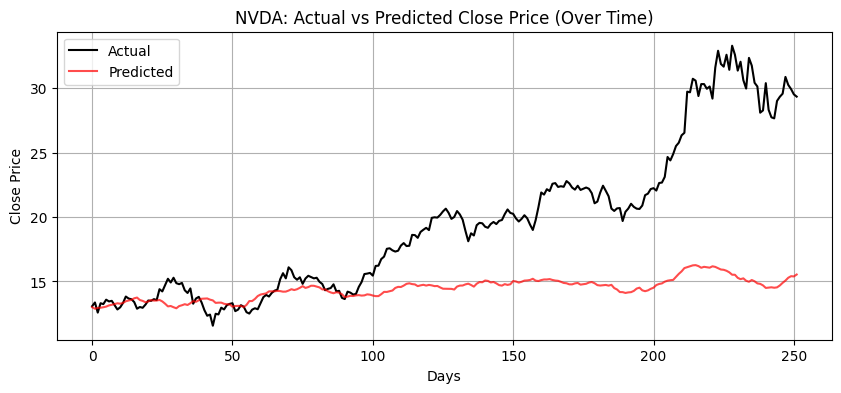

Extracted attention weights for NVDA for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


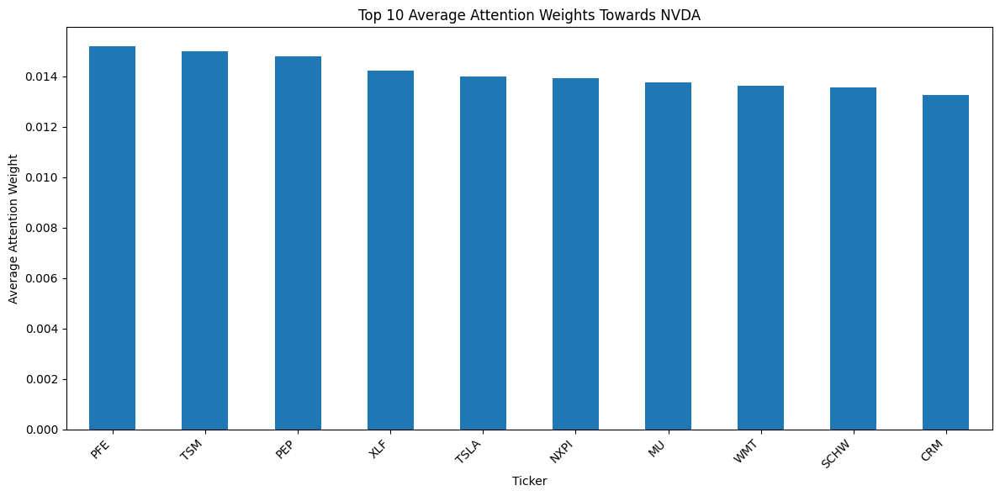

Top 10 tickers by average attention weight towards NVDA:
PFE     0.015179
TSM     0.014971
PEP     0.014778
XLF     0.014217
TSLA    0.013995
NXPI    0.013919
MU      0.013747
WMT     0.013624
SCHW    0.013540
CRM     0.013256
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'NVDA'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd21.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if train_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = train_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'NVDA'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])

    df = df[(df['Date'] >= '2012-01-01') & (df['Date'] <= '2018-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'NVDA'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            # Collect features from day-(window_size-1) to day (inclusive)
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            # Extract features for each day in window: Close, RSI, MACD
            # Shape: (window_size, 3)
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        y.append(panel[target_stock].iloc[day + 1]['Close'])  # Next day close as label

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0.0, posinf=0.0, neginf=0.0)

        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)

    torch.save(graph_list, 'graph_list_nvda_21day_rsimacd18.pt')

Epoch 01 | Train Loss: 0.0023 | Test Loss: 0.0005
 New best model saved (Train Loss: 0.0023)
Epoch 02 | Train Loss: 0.0008 | Test Loss: 0.0002
 New best model saved (Train Loss: 0.0008)
Epoch 03 | Train Loss: 0.0003 | Test Loss: 0.0001
 New best model saved (Train Loss: 0.0003)
Epoch 04 | Train Loss: 0.0001 | Test Loss: 0.0001
 New best model saved (Train Loss: 0.0001)
Epoch 05 | Train Loss: 0.0001 | Test Loss: 0.0001
 New best model saved (Train Loss: 0.0001)
Epoch 06 | Train Loss: 0.0001 | Test Loss: 0.0001
 New best model saved (Train Loss: 0.0001)
Epoch 07 | Train Loss: 0.0001 | Test Loss: 0.0001
 New best model saved (Train Loss: 0.0001)
Epoch 08 | Train Loss: 0.0000 | Test Loss: 0.0001
 New best model saved (Train Loss: 0.0000)
Epoch 09 | Train Loss: 0.0000 | Test Loss: 0.0001
 New best model saved (Train Loss: 0.0000)
Epoch 10 | Train Loss: 0.0000 | Test Loss: 0.0000
 New best model saved (Train Loss: 0.0000)
Epoch 11 | Train Loss: 0.0000 | Test Loss: 0.0001
 New best model save

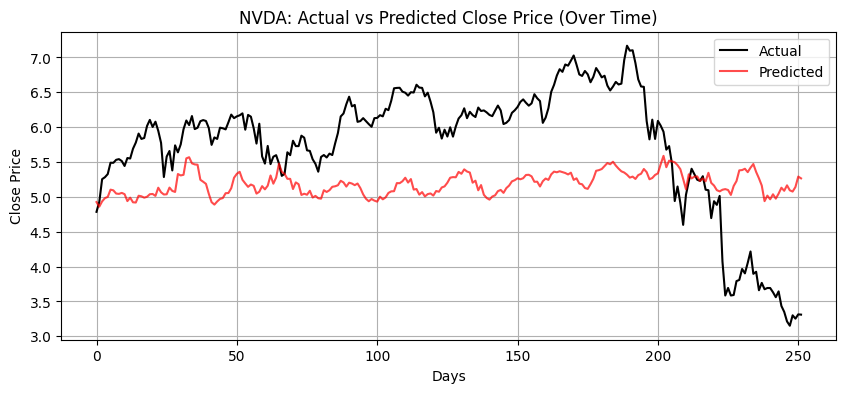

Extracted attention weights for NVDA for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


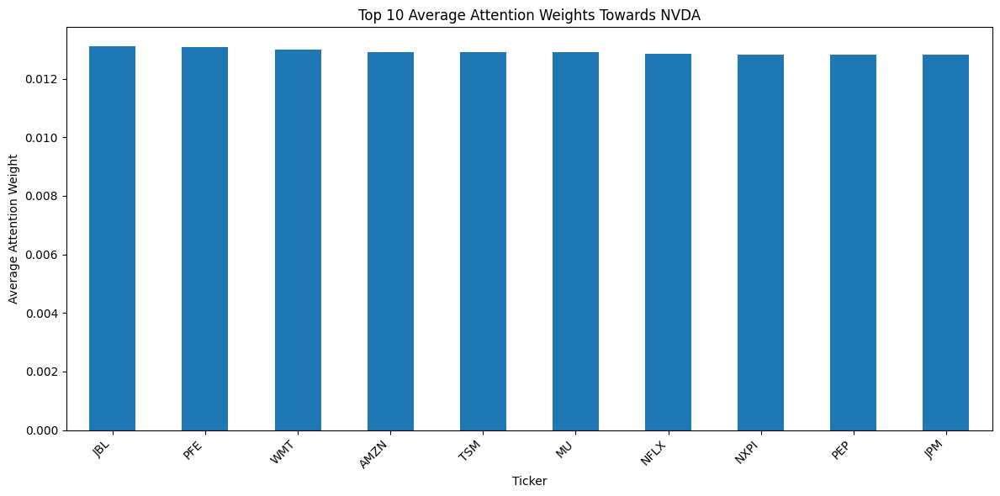

Top 10 tickers by average attention weight towards NVDA:
JBL     0.013104
PFE     0.013069
WMT     0.012997
AMZN    0.012919
TSM     0.012916
MU      0.012894
NFLX    0.012842
NXPI    0.012835
PEP     0.012833
JPM     0.012824
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'NVDA'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd18.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if train_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = train_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'NVDA'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

# SPY

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])

    df = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'SPY'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(etf_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            # Collect features from day-(window_size-1) to day (inclusive)
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            # Extract features for each day in window: Close, RSI, MACD
            # Shape: (window_size, 3)
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        y.append(panel[target_stock].iloc[day + 1]['Close'])  # Next day close as label

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0.0, posinf=0.0, neginf=0.0)

        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)

    torch.save(graph_list, 'graph_list_spy_21day_rsimacd.pt')

Epoch 01 | Train Loss: 0.0091 | Test Loss: 0.0229
 New best model saved (Train Loss: 0.0091)
Epoch 02 | Train Loss: 0.0039 | Test Loss: 0.0125
 New best model saved (Train Loss: 0.0039)
Epoch 03 | Train Loss: 0.0021 | Test Loss: 0.0016
 New best model saved (Train Loss: 0.0021)
Epoch 04 | Train Loss: 0.0014 | Test Loss: 0.0033
 New best model saved (Train Loss: 0.0014)
Epoch 05 | Train Loss: 0.0010 | Test Loss: 0.0009
 New best model saved (Train Loss: 0.0010)
Epoch 06 | Train Loss: 0.0009 | Test Loss: 0.0009
 New best model saved (Train Loss: 0.0009)
Epoch 07 | Train Loss: 0.0008 | Test Loss: 0.0008
 New best model saved (Train Loss: 0.0008)
Epoch 08 | Train Loss: 0.0007 | Test Loss: 0.0005
 New best model saved (Train Loss: 0.0007)
Epoch 09 | Train Loss: 0.0007 | Test Loss: 0.0006
 New best model saved (Train Loss: 0.0007)
Epoch 10 | Train Loss: 0.0007 | Test Loss: 0.0005
 No improvement for 1 epoch(s)
Epoch 11 | Train Loss: 0.0006 | Test Loss: 0.0009
 New best model saved (Train Los

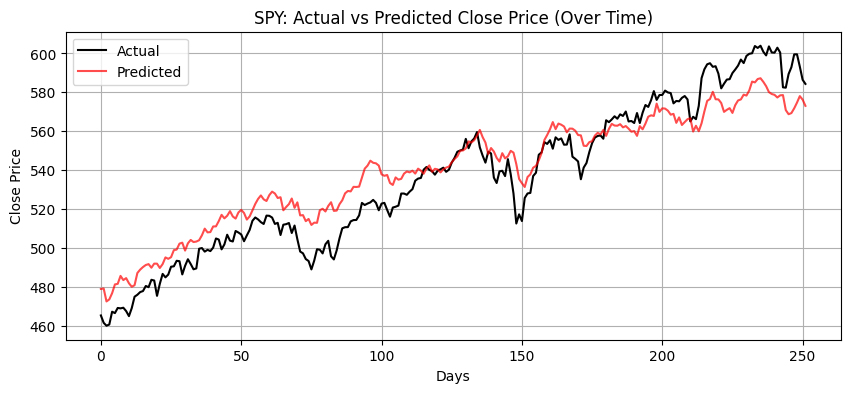

Extracted attention weights for SPY for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


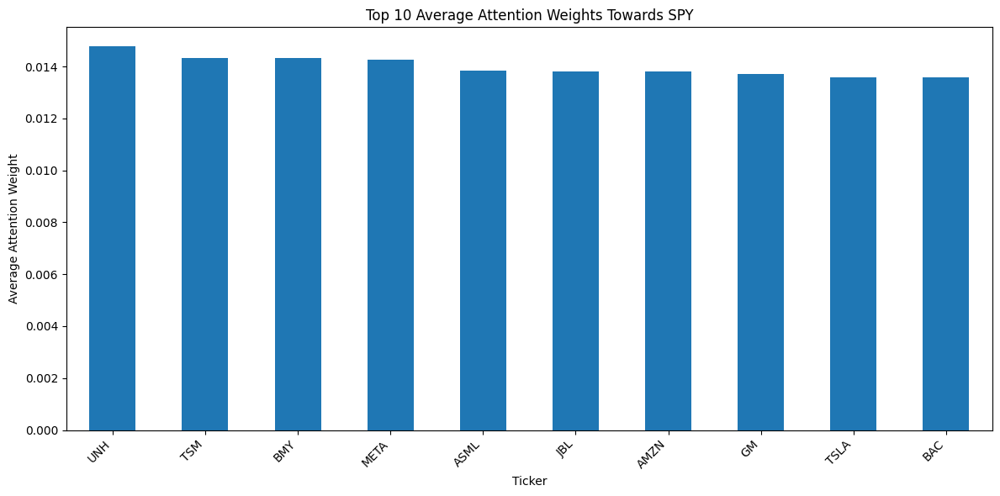

Top 10 tickers by average attention weight towards SPY:
UNH     0.014775
TSM     0.014317
BMY     0.014311
META    0.014255
ASML    0.013827
JBL     0.013814
AMZN    0.013792
GM      0.013710
TSLA    0.013592
BAC     0.013575
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'SPY'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if train_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = train_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'SPY'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])

    df = df[(df['Date'] >= '2015-01-01') & (df['Date'] <= '2021-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'SPY'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(etf_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            # Collect features from day-(window_size-1) to day (inclusive)
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            # Extract features for each day in window: Close, RSI, MACD
            # Shape: (window_size, 3)
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        y.append(panel[target_stock].iloc[day + 1]['Close'])  # Next day close as label

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0.0, posinf=0.0, neginf=0.0)

        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)

    torch.save(graph_list, 'graph_list_spy_21day_rsimacd21.pt')

Epoch 01 | Train Loss: 0.0049 | Test Loss: 0.0131
 New best model saved (Train Loss: 0.0049)
Epoch 02 | Train Loss: 0.0024 | Test Loss: 0.0113
 New best model saved (Train Loss: 0.0024)
Epoch 03 | Train Loss: 0.0013 | Test Loss: 0.0079
 New best model saved (Train Loss: 0.0013)
Epoch 04 | Train Loss: 0.0008 | Test Loss: 0.0019
 New best model saved (Train Loss: 0.0008)
Epoch 05 | Train Loss: 0.0006 | Test Loss: 0.0024
 New best model saved (Train Loss: 0.0006)
Epoch 06 | Train Loss: 0.0005 | Test Loss: 0.0014
 New best model saved (Train Loss: 0.0005)
Epoch 07 | Train Loss: 0.0004 | Test Loss: 0.0003
 New best model saved (Train Loss: 0.0004)
Epoch 08 | Train Loss: 0.0004 | Test Loss: 0.0001
 New best model saved (Train Loss: 0.0004)
Epoch 09 | Train Loss: 0.0004 | Test Loss: 0.0002
 New best model saved (Train Loss: 0.0004)
Epoch 10 | Train Loss: 0.0003 | Test Loss: 0.0003
 New best model saved (Train Loss: 0.0003)
Epoch 11 | Train Loss: 0.0004 | Test Loss: 0.0006
 No improvement for 

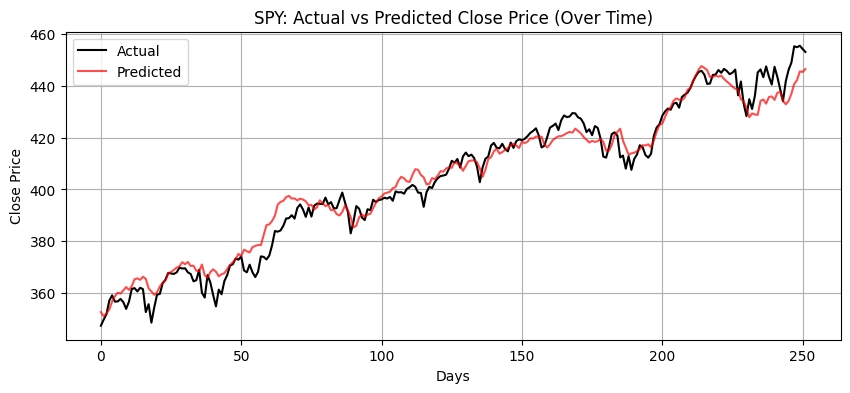

Extracted attention weights for SPY for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


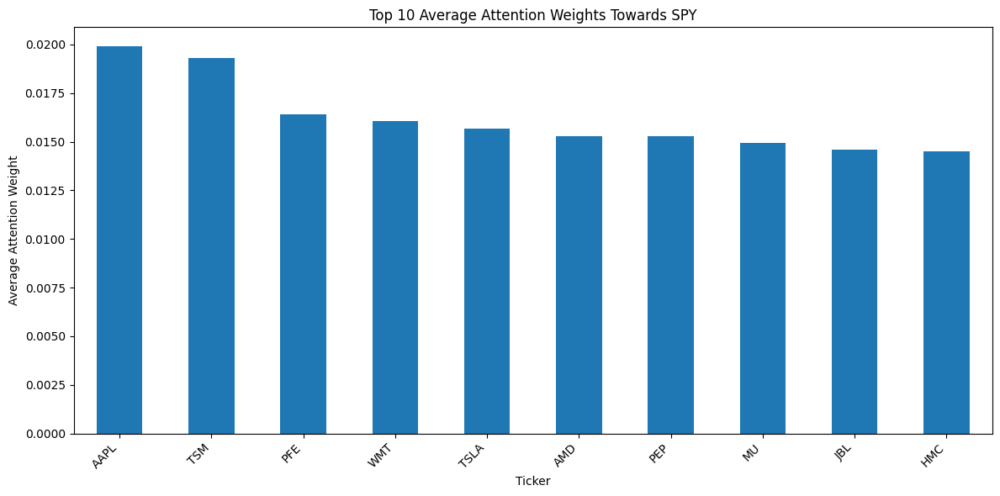

Top 10 tickers by average attention weight towards SPY:
AAPL    0.019890
TSM     0.019309
PFE     0.016411
WMT     0.016039
TSLA    0.015664
AMD     0.015304
PEP     0.015291
MU      0.014958
JBL     0.014598
HMC     0.014486
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'SPY'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd21.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if train_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = train_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'SPY'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])

    df = df[(df['Date'] >= '2012-01-01') & (df['Date'] <= '2018-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'SPY'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(etf_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            # Collect features from day-(window_size-1) to day (inclusive)
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            # Extract features for each day in window: Close, RSI, MACD
            # Shape: (window_size, 3)
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        y.append(panel[target_stock].iloc[day + 1]['Close'])  # Next day close as label

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0.0, posinf=0.0, neginf=0.0)

        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)

    torch.save(graph_list, 'graph_list_spy_21day_rsimacd18.pt')

Epoch 01 | Train Loss: 0.0040 | Test Loss: 0.0022
 New best model saved (Train Loss: 0.0040)
Epoch 02 | Train Loss: 0.0020 | Test Loss: 0.0007
 New best model saved (Train Loss: 0.0020)
Epoch 03 | Train Loss: 0.0009 | Test Loss: 0.0004
 New best model saved (Train Loss: 0.0009)
Epoch 04 | Train Loss: 0.0005 | Test Loss: 0.0002
 New best model saved (Train Loss: 0.0005)
Epoch 05 | Train Loss: 0.0004 | Test Loss: 0.0004
 New best model saved (Train Loss: 0.0004)
Epoch 06 | Train Loss: 0.0003 | Test Loss: 0.0005
 New best model saved (Train Loss: 0.0003)
Epoch 07 | Train Loss: 0.0003 | Test Loss: 0.0003
 New best model saved (Train Loss: 0.0003)
Epoch 08 | Train Loss: 0.0002 | Test Loss: 0.0005
 New best model saved (Train Loss: 0.0002)
Epoch 09 | Train Loss: 0.0002 | Test Loss: 0.0008
 New best model saved (Train Loss: 0.0002)
Epoch 10 | Train Loss: 0.0002 | Test Loss: 0.0004
 New best model saved (Train Loss: 0.0002)
Epoch 11 | Train Loss: 0.0002 | Test Loss: 0.0002
 No improvement for 

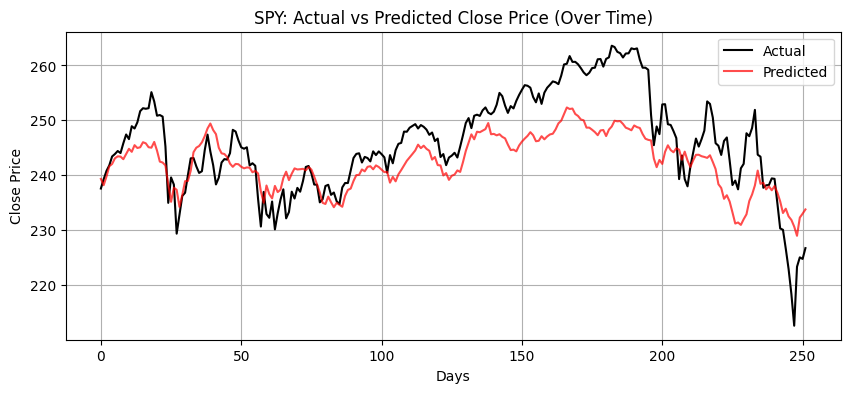

Extracted attention weights for SPY for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


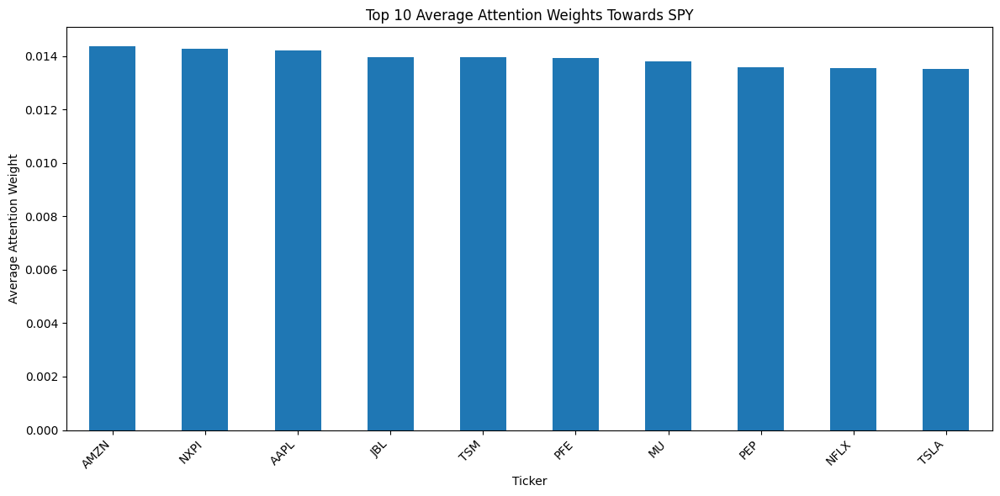

Top 10 tickers by average attention weight towards SPY:
AMZN    0.014360
NXPI    0.014272
AAPL    0.014217
JBL     0.013961
TSM     0.013950
PFE     0.013919
MU      0.013798
PEP     0.013584
NFLX    0.013545
TSLA    0.013524
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'SPY'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd18.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if train_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = train_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'SPY'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

# TFT-GNN

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])

    df = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'AAPL'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            # Collect features from day-(window_size-1) to day (inclusive)
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            # Extract features for each day in window: Close, RSI, MACD
            # Shape: (window_size, 3)
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        y.append(panel[target_stock].iloc[day + 1]['Close'])  # Next day close as label

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0.0, posinf=0.0, neginf=0.0)

        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)

    torch.save(graph_list, 'graph_list_aapl_21day_rsimacd.pt')

/tmp/ipython-input-1265440983.py:116: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:254.)
  x_tensor = torch.tensor(x, dtype=torch.float)


SAVED MODEL:

Epoch 01 | Train Loss: 0.0054 | Test Loss: 0.0247
 New best model saved (Train Loss: 0.0247)
Epoch 02 | Train Loss: 0.0034 | Test Loss: 0.0100
 New best model saved (Train Loss: 0.0100)
Epoch 03 | Train Loss: 0.0022 | Test Loss: 0.0086
 New best model saved (Train Loss: 0.0086)
Epoch 04 | Train Loss: 0.0016 | Test Loss: 0.0072
 New best model saved (Train Loss: 0.0072)
Epoch 05 | Train Loss: 0.0013 | Test Loss: 0.0067
 New best model saved (Train Loss: 0.0067)
Epoch 06 | Train Loss: 0.0013 | Test Loss: 0.0065
 New best model saved (Train Loss: 0.0065)
Epoch 07 | Train Loss: 0.0012 | Test Loss: 0.0064
 New best model saved (Train Loss: 0.0064)
Epoch 08 | Train Loss: 0.0012 | Test Loss: 0.0068
 No improvement for 1 epoch(s)
Epoch 09 | Train Loss: 0.0012 | Test Loss: 0.0066
 No improvement for 2 epoch(s)
Epoch 10 | Train Loss: 0.0011 | Test Loss: 0.0069
 No improvement for 3 epoch(s)
Epoch 11 | Train Loss: 0.0012 | Test Loss: 0.0066
 No improvement for 4 epoch(s)
Epoch 12 | Train Loss: 0.

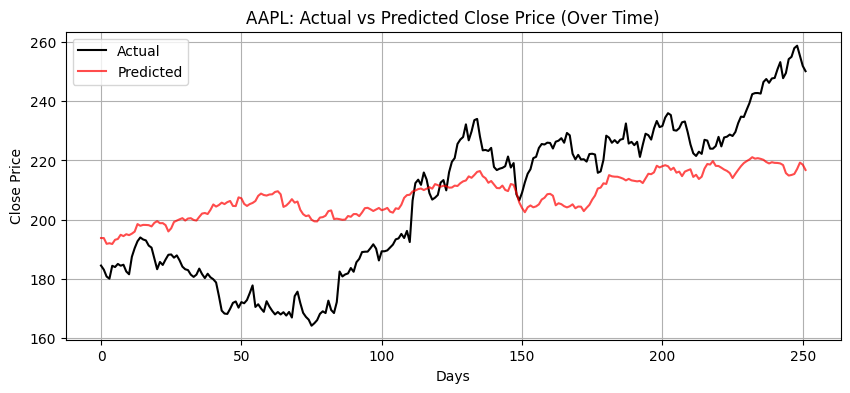

Extracted attention weights for AAPL for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


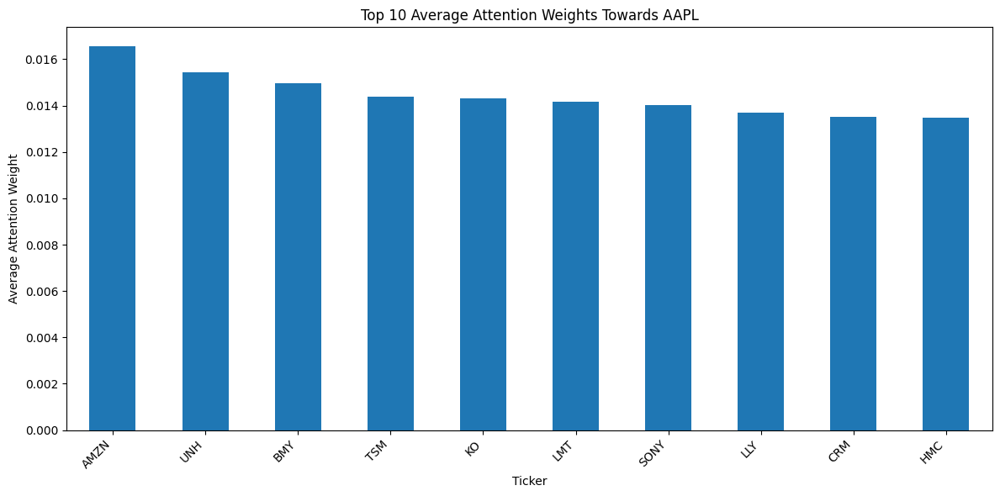

Top 10 tickers by average attention weight towards AAPL:
AMZN    0.016555
UNH     0.015440
BMY     0.014952
TSM     0.014389
KO      0.014295
LMT     0.014150
SONY    0.014018
LLY     0.013682
CRM     0.013531
HMC     0.013488
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# --- Save model after training ---
torch.save(model.state_dict(), "gnn_model_aapl.pt")
print(" Saved trained GNN model to gnn_model_aapl.pt")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'AAPL'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

SAVED EMBEDDINGS:

In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)
        self.dropout = nn.Dropout(dropout_prob)

    def encode(self, data):
        """Return node embeddings for all tickers (not just prediction)."""
        x, edge_index = data.x, data.edge_index
        x = F.elu(self.gat1(x, edge_index))   # shape: [num_nodes, hidden_channels * heads]
        return x

    def forward(self, data):
        node_embeddings = self.encode(data)
        return node_embeddings

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Recreate model exactly as trained
model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1, heads=4).to(device)

# Load trained weights
model.load_state_dict(torch.load("gnn_model_aapl.pt"))
model.eval()
print(" Loaded GNN model from gnn_model_aapl.pt")

# === Extract embeddings ===
gnn_embeddings = []

with torch.no_grad():
    for data in graph_list:
        data = data.to(device)
        node_emb = model.encode(data)   # [num_nodes, hidden_dim]
        aapl_emb = node_emb[data.target_node_ids]  # pick AAPL
        gnn_embeddings.append(aapl_emb.cpu().numpy())

gnn_embeddings = np.vstack(gnn_embeddings)  # [num_days, hidden_dim]
np.save("aapl_gnn_embeddings.npy", gnn_embeddings)
print(" Saved GNN embeddings to aapl_gnn_embeddings.npy")

 Loaded GNN model from gnn_model_aapl.pt
 Saved GNN embeddings to aapl_gnn_embeddings.npy


Padding GNN embeddings with 21 dummy zeros


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 524 K  | train
------------------------------------------------------------
524 K     Trainable params
0         Non-trainable params
524 K     Total params
2.099     Total estimated model params size (MB)
2158      Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 5.1595
  MAE : 4.0698
  R²  : 0.9592
  MAPE: 1.97%


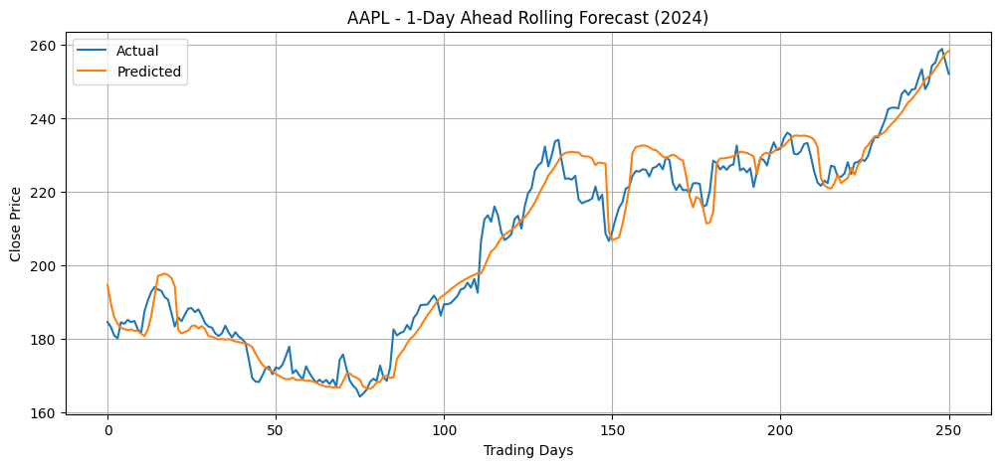

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Load GNN embeddings for AAPL (shape [num_days, hidden_dim])
gnn_emb = np.load("aapl_gnn_embeddings.npy")

# Ensure sorted by date to align with your df
aapl_sorted = df[df["group"] == "AAPL"].sort_values("Date").reset_index(drop=True)

if len(gnn_emb) < len(aapl_sorted):
    pad_len = len(aapl_sorted) - len(gnn_emb)
    print(f"Padding GNN embeddings with {pad_len} dummy zeros")
    gnn_emb = np.vstack([np.zeros((pad_len, gnn_emb.shape[1])), gnn_emb])

assert len(aapl_sorted) == len(gnn_emb), "Mismatch between AAPL rows and GNN embeddings!"

# Add each embedding dimension as its own column
hidden_dim = gnn_emb.shape[1]
for i in range(hidden_dim):
    aapl_sorted[f"gnn_emb_{i}"] = gnn_emb[:, i]

# Merge back into full df (other stocks will get NaN → fill with 0)
df = df.merge(
    aapl_sorted[["Date", "group"] + [f"gnn_emb_{i}" for i in range(hidden_dim)]],
    on=["Date", "group"],
    how="left"
)
df[[f"gnn_emb_{i}" for i in range(hidden_dim)]] = df[[f"gnn_emb_{i}" for i in range(hidden_dim)]].fillna(0.0)


# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)


# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
gnn_cols = [f"gnn_emb_{i}" for i in range(hidden_dim)]

tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", "upper_shadow", "lower_shadow"] + gnn_cols,
    static_categoricals=["group"],
    allow_missing_timesteps=True,
)


# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


preds, acts = [], []
df_group = test_df[test_df["group"] == "AAPL"].copy().reset_index(drop=True)
df_group["time_idx"] = np.arange(len(df_group))

steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

for offset in range(steps):
    decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
    data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    if data_slice["time_idx"].nunique() < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
    predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]

    preds.append(prediction)
    acts.append(actual)

# Evaluate
rmse = np.sqrt(mean_squared_error(acts, preds))
mae = mean_absolute_error(acts, preds)
r2 = r2_score(acts, preds)
mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

print(f"\n AAPL Evaluation:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE : {mae:.4f}")
print(f"  R²  : {r2:.4f}")
print(f"  MAPE: {mape:.2f}%")


plt.figure(figsize=(12, 5))
plt.plot(acts, label=f"Actual")
plt.plot(preds, label=f"Predicted")
plt.title(f"AAPL - 1-Day Ahead Rolling Forecast (2024)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


I am on a gpu but it seems like this going to take about 1 min per epoch... . Looks like we need too simplify gnn embeddings to be a feature.

Things to add:
more stocks
etf/stock col, like group
sector?
Maybe with all this extra data, model can change (more complex?)

In [ ]:
len(gnn_emb)

1740

In [ ]:
len(aapl_sorted)

1760

In [ ]:
hidden_dim

128